# Web Mining - Project (2024-2025)

BASTIEN Emma - 21900089 \\
GOARDET Marie - 21900104 \\
JELASSI Meriem - 22002887 \\

## 0 - Data Loading & Exploration

In [ ]:
!pip install numpy==1.26.4 --force-reinstall
!pip install --upgrade --force-reinstall pandas bertopic
!pip install --upgrade --force-reinstall gensim

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 61.0/61.0 kB 4.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 18.3/18.3 MB 21.3 MB/s eta 0:00:00
  Attempting uninstall: numpy
    Found existing installation: numpy 2.0.2
    Uninstalling numpy-2.0.2:
      Successfully uninstalled numpy-2.0.2
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 89.9/89.9 kB 6.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.0/62.0 kB 4.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 57.7/57.7 kB 3.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.0/62.0 kB 4.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.0/62.0 kB 4.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 40.5/40.5 kB 2.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.1/13.1 MB 18.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 150.6/150.6 kB 9.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.6/4.6 MB

  Using cached numpy-1.26.4-cp311-cp311-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (61 kB)
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 60.6/60.6 kB 2.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 26.7/26.7 MB 59.9 MB/s eta 0:00:00
Using cached numpy-1.26.4-cp311-cp311-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (18.3 MB)
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 38.6/38.6 MB 13.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 61.7/61.7 kB 4.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 83.2/83.2 kB 6.6 MB/s eta 0:00:00
  Attempting uninstall: wrapt
    Found existing installation: wrapt 1.17.2
    Uninstalling wrapt-1.17.2:
      Successfully uninstalled wrapt-1.17.2
  Attempting uninstall: numpy
    Found existing installation: numpy 2.1.3
    Uninstalling numpy-2.1.3:
      Successfully uninstalled numpy-2.1.3
  Attempting uninstall: smart-open
    Found existing installation: smart-open 7.1.0
    Uninstalling smart-

In [ ]:
!pip install -q bertopic
!pip install gensim
!pip install -q optuna
!pip install -q textblob

In [ ]:
# Standard Libraries
import string
import re
from collections import defaultdict, Counter
import torch

# Date Handling
from dateutil import parser
from dateutil.parser import parse

# Data Manipulation
import pandas as pd
import numpy as np

# Visualization
import matplotlib.pyplot as plt
from wordcloud import WordCloud
from sklearn.manifold import TSNE
from sklearn.metrics import ConfusionMatrixDisplay
from xgboost import plot_importance

# Progress Bar
from tqdm import tqdm

# Graphs and Networks
import networkx as nx

# Text Processing
import nltk
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer, SnowballStemmer
from textblob import TextBlob

# Download necessary NLTK data
nltk.download('stopwords')
nltk.download('wordnet')

# Initialize stop words and stemmers
stop_words = set(stopwords.words('english'))
lemmatizer = WordNetLemmatizer()
stemmer = SnowballStemmer("english")

# Vectorization and Embeddings
from sklearn.feature_extraction.text import TfidfVectorizer, CountVectorizer
from sentence_transformers import SentenceTransformer
import gensim.downloader as api
from gensim.models import Word2Vec

# Topic Modeling
from bertopic import BERTopic

# Classification and Clustering
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import LinearSVC
from sklearn.neural_network import MLPClassifier
from xgboost import XGBClassifier
from sklearn.cluster import KMeans
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import (
    accuracy_score, f1_score, recall_score,
    classification_report, confusion_matrix, cohen_kappa_score,
    make_scorer, silhouette_score
)
from sklearn.metrics.pairwise import cosine_similarity

# Resampling
from imblearn.over_sampling import SMOTE

# Transformers
from transformers import (
    AutoTokenizer, AutoModelForSequenceClassification, pipeline
)

# Hyperparameter Optimization
import optuna

# File Management
from google.colab import drive
import joblib

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


### Loading the NetworkX Graph

In [ ]:
drive.mount('/content/drive')
filepath = "/content/drive/MyDrive/Web Mining - Project/database/Everything/database_formated_for_NetworkX.graphml"
G = nx.read_graphml(filepath)

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


### Exploring Nodes and Relationships

In [ ]:
print(f"Number of nodes: {G.number_of_nodes()}")
print(f"Number of edges: {G.number_of_edges()}")

Number of nodes: 109627
Number of edges: 311654


In [ ]:
node_types = {}
for _, attr in G.nodes(data=True):
    node_type = attr.get('labels', 'Unknown')
    if node_type :
      node_types[node_type] = node_types.get(node_type, 0) + 1

print("Repartion of node types:")
for node_type, count in node_types.items():
    print(f"{node_type}: {count}")

Repartion of node types:
:Event: 34
:Hashtag: 10441
:PostCategory: 25
:Tweet: 55986
:User: 43141


In [ ]:
edge_types = {}
for _, _, attr in G.edges(data=True):
    edge_type = attr.get('label', 'Unknown')
    if edge_type :
      edge_types[edge_type] = edge_types.get(edge_type, 0) + 1

print("Repartion of edge types:")
for edge_type, count in edge_types.items():
    print(f"{edge_type}: {count}")

Repartion of edge types:
IS_ABOUT: 36668
HAS_HASHTAG: 55414
HAS_CATEGORY: 96566
RETWEETED: 4377
MENTIONS: 20894
REPLY_TO: 2479
POSTED: 55986
TALKS_ABOUT: 31134
RETWEETS: 6296
REPLIED_TO: 1840


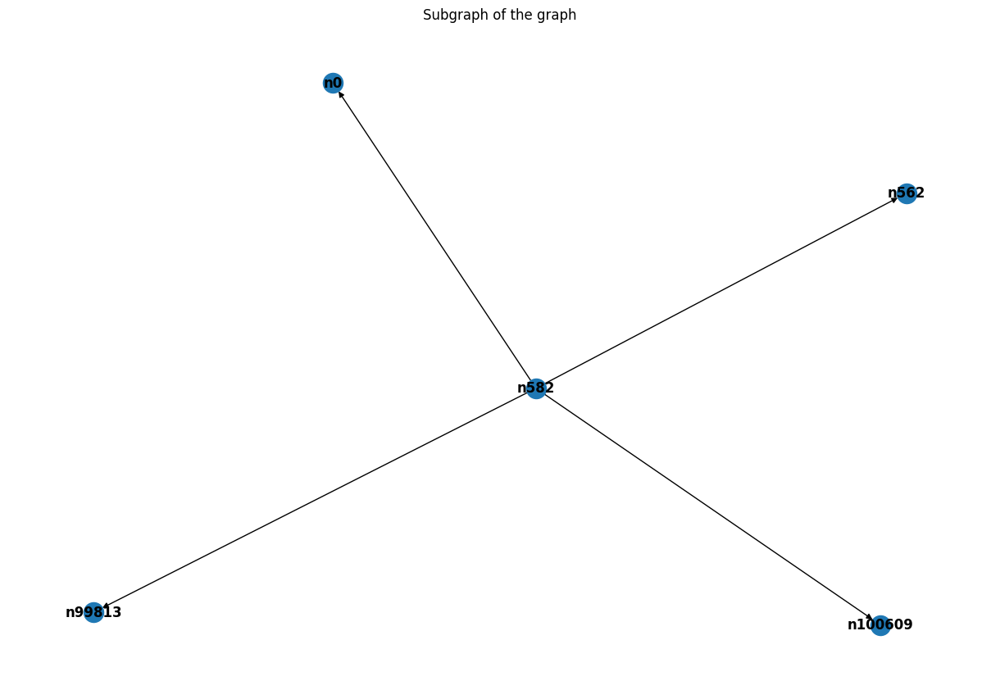

In [ ]:
tweets_nodes = [n for n, d in G.nodes(data=True) if d.get("labels") == ":Tweet"]
sub_nodes = list(nx.bfs_tree(G, source=tweets_nodes[0], depth_limit=2).nodes)
subgraph = G.subgraph(sub_nodes)

plt.figure(figsize=(12,8))
nx.draw(subgraph, with_labels=True, font_weight='bold')
plt.title("Subgraph of the graph")
plt.show()

In [ ]:
central_tweet = tweets_nodes[0]
print(f"Central Tweet : {central_tweet}")

Central Tweet : n582


In [ ]:
sub_nodes = list(nx.bfs_tree(G, source=central_tweet, depth_limit=2).nodes)
subgraph = G.subgraph(sub_nodes)

<Figure size 1200x800 with 0 Axes>

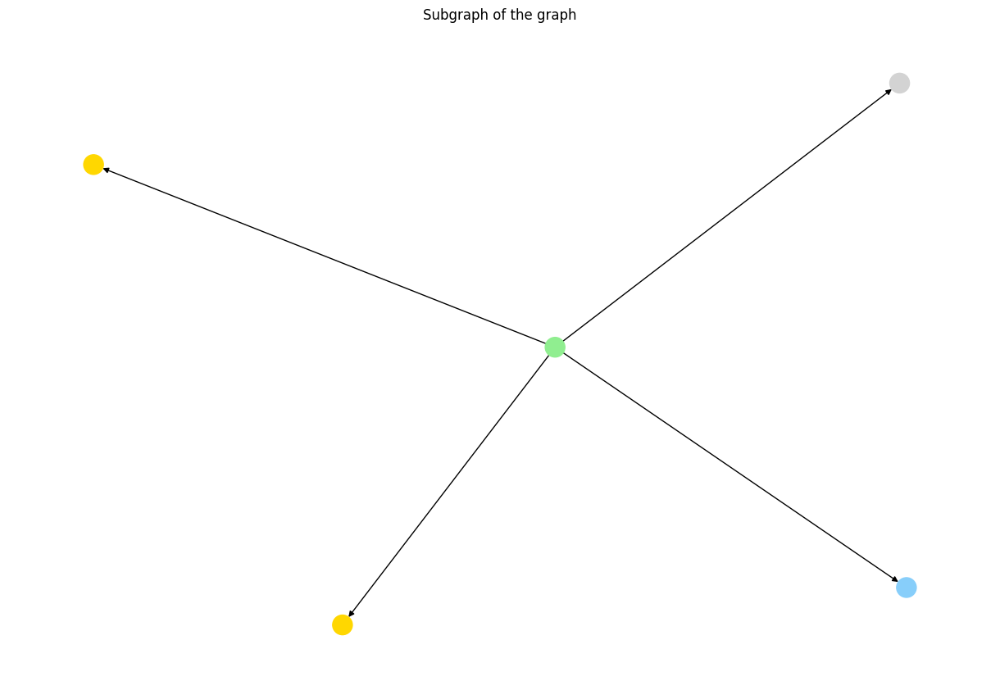

In [ ]:
color_map = []
for node in subgraph.nodes(data=True):
    label = node[1].get("labels")
    if label == ":Tweet":
        color_map.append("lightgreen")
    elif label == ":User":
        color_map.append("lightcoral")
    elif label == ":Hashtag":
        color_map.append("gold")
    elif label == ":Event":
        color_map.append("lightskyblue")
    else:
        color_map.append("lightgray")

plt.figure(figsize=(12,8))
plt.figure(figsize=(12,8))
nx.draw(subgraph, with_labels=False, font_weight='bold', node_color = color_map)
plt.title("Subgraph of the graph")
plt.show()

## I - Implement a dashboard of the online crisis

### Exploratory Analysis of Events

In [ ]:
def propagate_eventType(G, n_passes=3):
    # Repeat the propagation process multiple times to let labels spread further
    for _ in range(n_passes):

        # 1. Propagate eventType from Event → Tweet via IS_ABOUT relationship
        for u, v, d in G.edges(data=True):
            if d.get("label") == "IS_ABOUT":
                if G.nodes[u].get("labels") == ":Tweet" and "eventType" in G.nodes[v]:
                    G.nodes[u]["eventType"] = G.nodes[v]["eventType"]
                elif G.nodes[v].get("labels") == ":Tweet" and "eventType" in G.nodes[u]:
                    G.nodes[v]["eventType"] = G.nodes[u]["eventType"]

        # 2. From a Tweet linked to an Event → get its hashtags → assign the eventType to those hashtags
        for tweet, event, d in G.edges(data=True):
            if d.get("label") == "IS_ABOUT" and G.nodes[event].get("labels") == ":Event":
                event_type = G.nodes[event].get("eventType")
                for _, hashtag, d2 in G.edges(tweet, data=True):
                    if d2.get("label") == "HAS_HASHTAG" and event_type:
                        G.nodes[hashtag]["eventType"] = event_type

        # 3. From Hashtag to Tweet: if a hashtag has an eventType, assign it to the connected tweet (if not already set)
        for u, v, d in G.edges(data=True):
            if d.get("label") == "HAS_HASHTAG":
                tweet, hashtag = (u, v) if G.nodes[u].get("labels") == ":Tweet" else (v, u)
                hashtag_type = G.nodes[hashtag].get("eventType")
                if hashtag_type and "eventType" not in G.nodes[tweet]:
                    G.nodes[tweet]["eventType"] = hashtag_type

        # 4. Propagate eventType between tweets that are connected via RETWEETED relationship
        for u, v, d in G.edges(data=True):
            if d.get("label") == "RETWEETED":
                if G.nodes[u].get("labels") == ":Tweet" and G.nodes[v].get("labels") == ":Tweet":
                    if "eventType" in G.nodes[v] and "eventType" not in G.nodes[u]:
                        G.nodes[u]["eventType"] = G.nodes[v]["eventType"]
                    elif "eventType" in G.nodes[u] and "eventType" not in G.nodes[v]:
                        G.nodes[v]["eventType"] = G.nodes[u]["eventType"]

        # 5. Propagate eventType between tweets connected via REPLY_TO relationship
        for u, v, d in G.edges(data=True):
            if d.get("label") == "REPLY_TO":
                if G.nodes[u].get("labels") == ":Tweet" and G.nodes[v].get("labels") == ":Tweet":
                    if "eventType" in G.nodes[v] and "eventType" not in G.nodes[u]:
                        G.nodes[u]["eventType"] = G.nodes[v]["eventType"]
                    elif "eventType" in G.nodes[u] and "eventType" not in G.nodes[v]:
                        G.nodes[v]["eventType"] = G.nodes[u]["eventType"]

        # 6. If a user has talked about an event → propagate that eventType to their tweets
        user_event_type = {}
        for u, v, d in G.edges(data=True):
            if d.get("label") == "TALKS_ABOUT":
                if G.nodes[u].get("labels") == ":User" and "eventType" in G.nodes[v]:
                    user_event_type[u] = G.nodes[v]["eventType"]

        for u, v, d in G.edges(data=True):
            if d.get("label") == "POSTED":
                if G.nodes[u].get("labels") == ":User" and G.nodes[v].get("labels") == ":Tweet":
                    if u in user_event_type and "eventType" not in G.nodes[v]:
                        G.nodes[v]["eventType"] = user_event_type[u]

    # Final count of how many tweets now have an eventType assigned
    count = sum(1 for _, d in G.nodes(data=True) if d.get("labels") == ":Tweet" and "eventType" in d)
    print(f"Number of tweets with eventType: {count}")

In [ ]:
propagate_eventType(G)

Number of tweets with eventType: 49083


In [ ]:
all_tweet_nodes = [n for n, d in G.nodes(data=True) if d.get("labels") == ":Tweet" and "eventType" in d]

### Statistics: Number of Tweets, Hashtags, etc

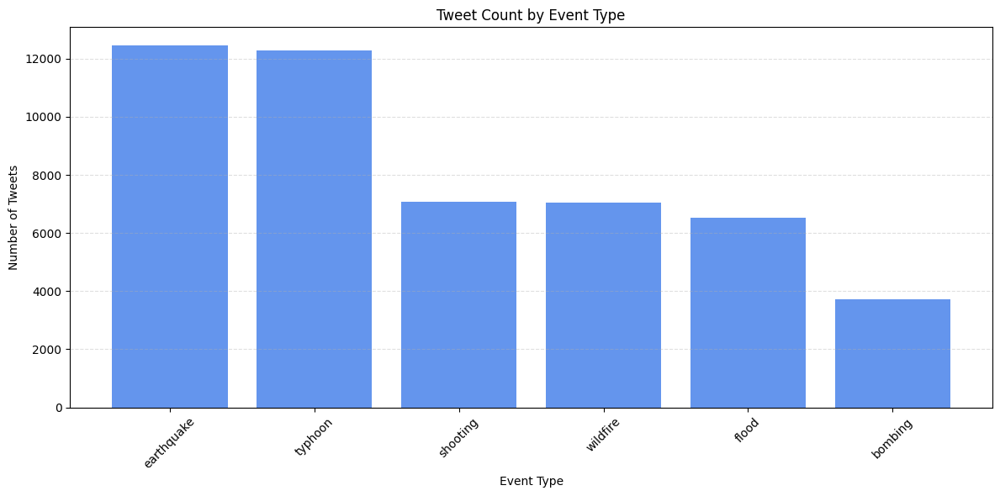

In [ ]:
from collections import Counter

event_counter = Counter()

for node in all_tweet_nodes:
    event_type = G.nodes[node].get("eventType")
    if event_type:
        event_counter[event_type] += 1

event_types, tweet_counts = zip(*sorted(event_counter.items(), key=lambda x: x[1], reverse=True))

plt.figure(figsize=(12,6))
plt.bar(event_types, tweet_counts, color='cornflowerblue')
plt.title("Tweet Count by Event Type")
plt.xlabel("Event Type")
plt.ylabel("Number of Tweets")
plt.xticks(rotation=45)
plt.grid(axis='y', linestyle='--', alpha=0.4)
plt.tight_layout()
plt.show()

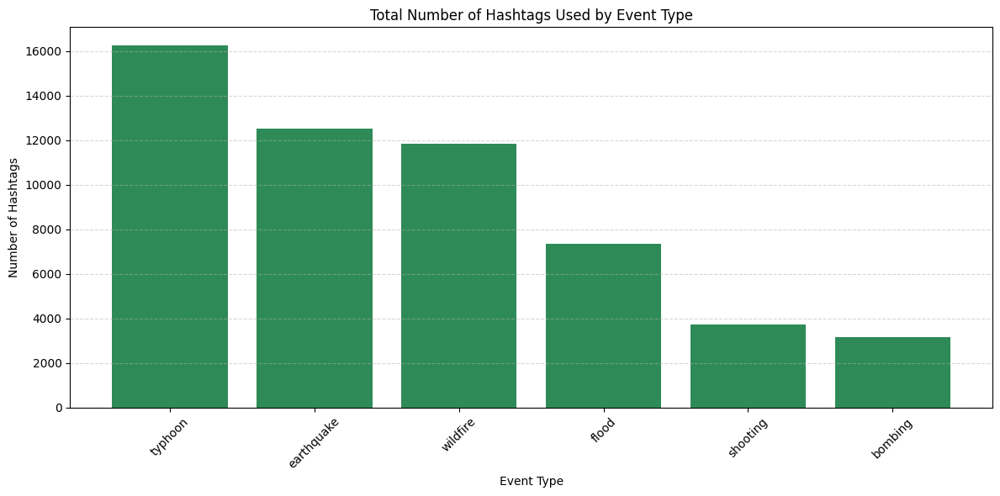

In [ ]:
hashtag_event_counter = Counter()

for tweet in all_tweet_nodes:
    event_type = G.nodes[tweet].get("eventType")

    for _, neighbor, edge_data in G.edges(tweet, data=True):
        if edge_data.get("label") == "HAS_HASHTAG":
            hashtag_event_counter[event_type] += 1

event_types, hashtag_counts = zip(*sorted(hashtag_event_counter.items(), key=lambda x: x[1], reverse=True))

plt.figure(figsize=(12, 6))
plt.bar(event_types, hashtag_counts, color='seagreen')
plt.title("Total Number of Hashtags Used by Event Type")
plt.xlabel("Event Type")
plt.ylabel("Number of Hashtags")
plt.xticks(rotation=45)
plt.grid(axis='y', linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()

In [ ]:
event_types = set()
for node in all_tweet_nodes:
    event_type = G.nodes[node].get("eventType")
    if event_type:
        event_types.add(event_type)

event_types = sorted(event_types)
print(f"Event Types Found: {event_types}")

Event Types Found: ['bombing', 'earthquake', 'flood', 'shooting', 'typhoon', 'wildfire']


In [ ]:
tweets_by_eventType = defaultdict(list)

for node, data in G.nodes(data=True):
    if data.get("labels") == ":Tweet":
        event_type = data.get("eventType")
        if event_type:
            tweets_by_eventType[event_type].append(node)

for event_type, tweet_list in tweets_by_eventType.items():
    print(f"{event_type}: {len(tweet_list)} tweets")

wildfire: 7040 tweets
flood: 6533 tweets
shooting: 7066 tweets
bombing: 3709 tweets
typhoon: 12274 tweets
earthquake: 12461 tweets


### Temporal Analysis of Tweets

In [ ]:
def graph_by_type(event_type):

    tweet_nodes = [
        node for node, data in G.nodes(data=True)
        if data.get("labels") == ":Tweet" and data.get("eventType") == event_type
    ]

    dates = []

    for node in tweet_nodes:
        date_str = G.nodes[node].get("created_at")
        if date_str:
            try:
                date_obj = parse(date_str)
                dates.append(date_obj.date())  # keep only the date (no time)
            except:
                pass

    if not dates:
        print(f"No valid dates found for event type: {event_type}")
        return

    date_series = pd.Series(dates)
    date_counts = date_series.value_counts().sort_index()

    plt.figure(figsize=(14, 6))
    date_counts.plot(kind='bar', color='skyblue')

    tick_step = max(1, len(date_counts) // 50)
    plt.xticks(ticks=np.arange(0, len(date_counts), tick_step), rotation=45)

    plt.title(f"Number of '{event_type}' tweets per day")
    plt.xlabel("Date")
    plt.ylabel("Number of tweets")
    plt.tight_layout()
    plt.show()


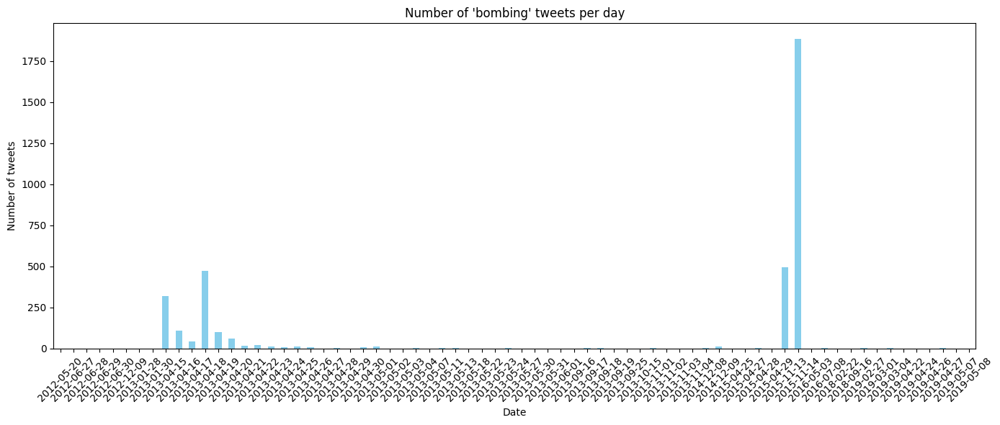

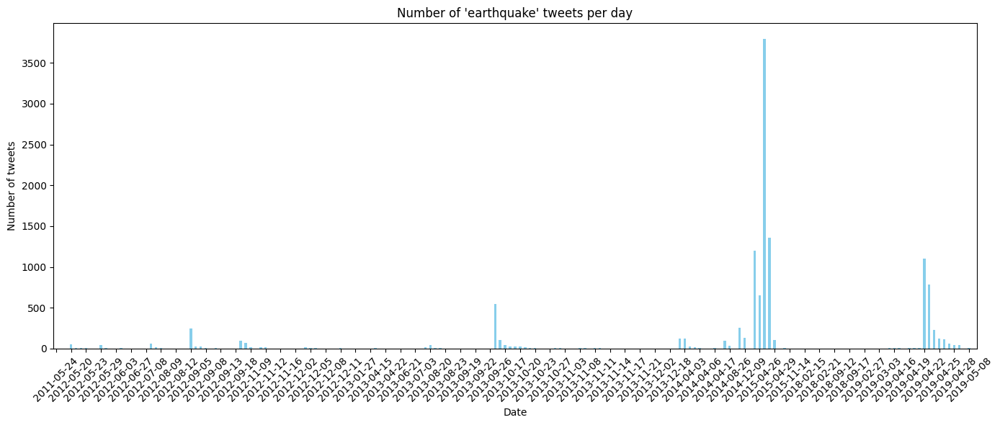

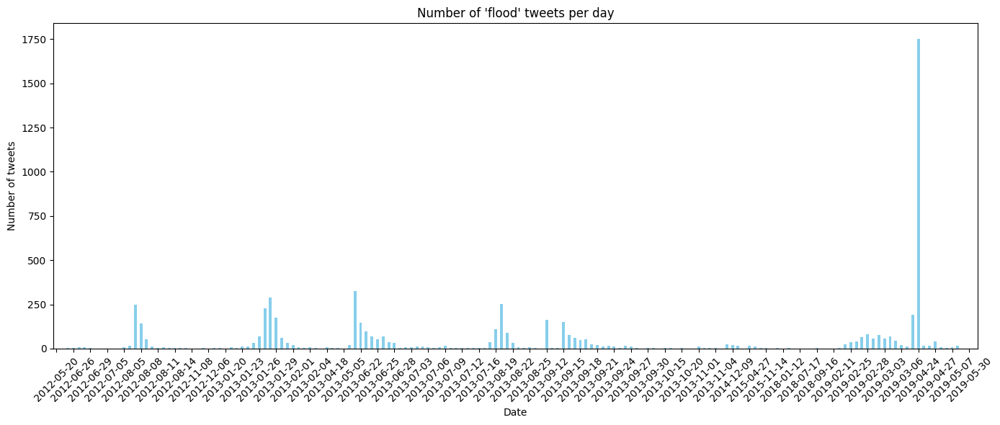

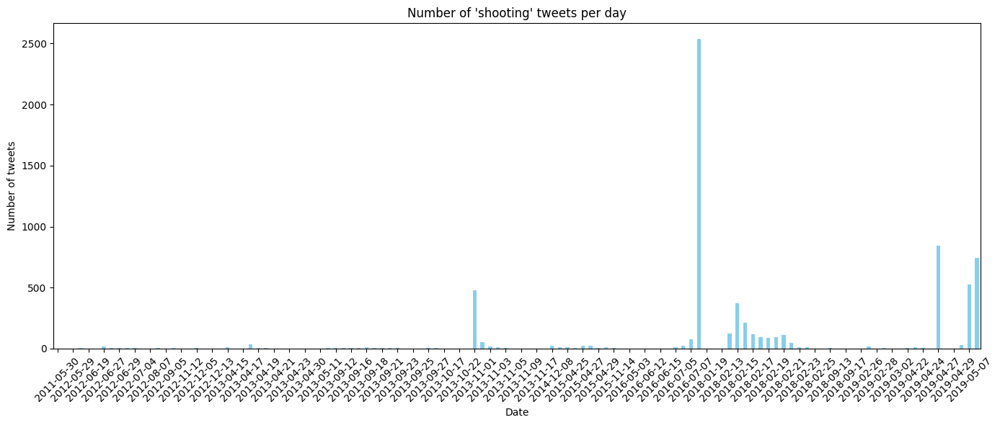

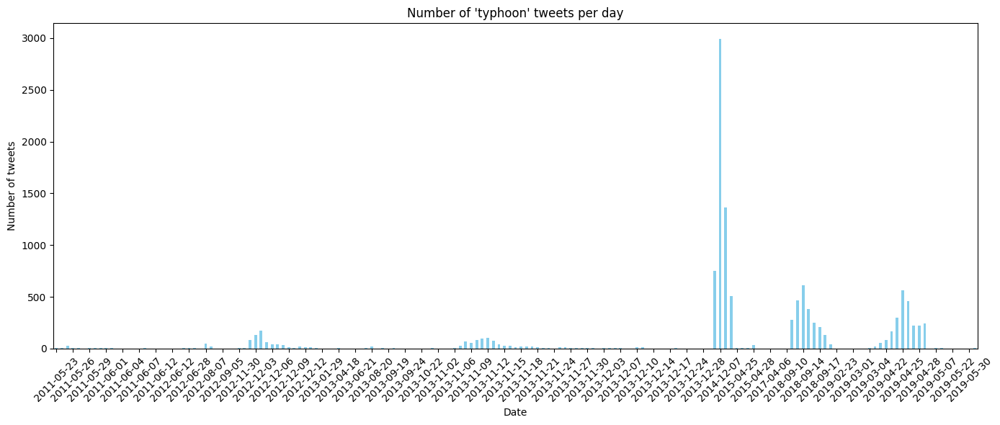

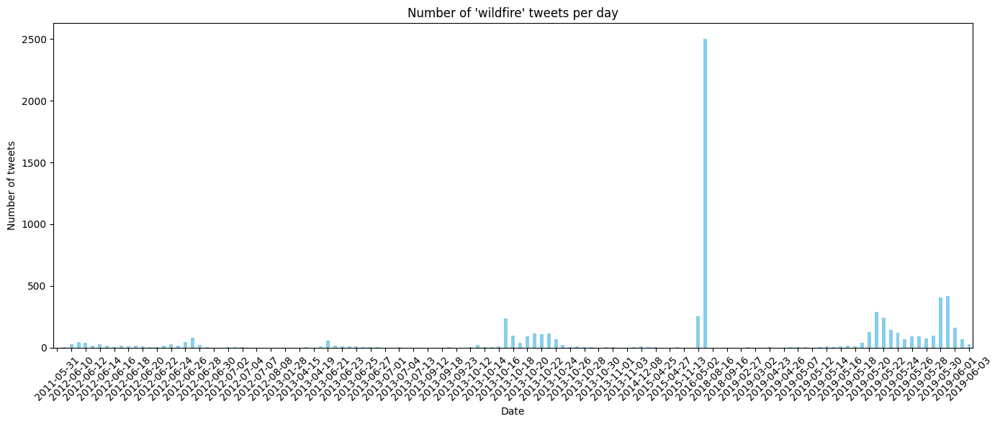

In [ ]:
for event_type in event_types:
    graph_by_type(event_type)

### Text Analysis & Clustering

#### Tweet Cleaning

In [ ]:
texts_by_event_type = defaultdict(list)

for event_type in event_types:
    tweet_nodes = [
        node for node, data in G.nodes(data=True)
        if data.get("labels") == ":Tweet" and data.get("eventType") == event_type
    ]

    tweet_texts = []

    for node in tweet_nodes:
        text = G.nodes[node].get("text")
        if text and len(text.strip()) > 0:
            tweet_texts.append(text)

    texts_by_event_type[event_type] = tweet_texts
    print(f"{event_type}: {len(tweet_texts)} tweets")

bombing: 3709 tweets
earthquake: 12461 tweets
flood: 6533 tweets
shooting: 7066 tweets
typhoon: 12274 tweets
wildfire: 7040 tweets


In [ ]:
def convert_text_to_lowercase(df, colname):
    df[colname] = df[colname].fillna('').str.lower()
    return df

def remove_punctuation(df, colname):
    df[colname] = df[colname].str.replace(rf"[{re.escape(string.punctuation)}]", " ", regex=True)
    return df

def remove_special_characters(df, colname):
    df[colname] = df[colname].str.replace(r"[^a-zA-Z0-9\s]", "", regex=True)
    return df

def tokenize_sentence(df, colname):
    df[colname] = df[colname].apply(lambda x: x.split())
    return df

def remove_stop_words(df, colname):
    df[colname] = df[colname].apply(lambda tokens: [w for w in tokens if w not in stop_words])
    return df

def lemmatize(df, colname):
    df[colname] = df[colname].apply(lambda tokens: [lemmatizer.lemmatize(w) for w in tokens])
    return df

def stem(df, colname):
    df[colname] = df[colname].apply(lambda tokens: [stemmer.stem(w) for w in tokens])
    return df

def reverse_tokenize_sentence(df, colname):
    df[colname] = df[colname].apply(lambda tokens: " ".join(tokens))
    return df

def clean_whitespace(df, colname):
    df[colname] = df[colname].str.replace(r"\s+", " ", regex=True).str.strip()
    return df

def text_cleaning(df, colname, use_stem=True, verbose=False):
    if verbose: print("Cleaning text...")
    df = (
        df
        .pipe(convert_text_to_lowercase, colname)
        .pipe(remove_punctuation, colname)
        .pipe(remove_special_characters, colname)
        .pipe(tokenize_sentence, colname)
        .pipe(remove_stop_words, colname)
        .pipe(lemmatize, colname)
    )
    if use_stem:
        df = df.pipe(stem, colname)
    df = (
        df
        .pipe(reverse_tokenize_sentence, colname)
        .pipe(clean_whitespace, colname)
    )
    if verbose: print("Text cleaned")
    return df

In [ ]:
cleaned_tweets_by_event_type = {}

for event_type, tweet_texts in texts_by_event_type.items():
    print(f"Cleaning tweets for event type: {event_type} ({len(tweet_texts)} tweets)")
    df_tweets = pd.DataFrame(tweet_texts, columns=['text'])
    cleaned_df_tweets = text_cleaning(df_tweets, 'text', use_stem=False, verbose=True)
    cleaned_tweets_by_event_type[event_type] = cleaned_df_tweets

Cleaning tweets for event type: bombing (3709 tweets)
Cleaning text...
Text cleaned
Cleaning tweets for event type: earthquake (12461 tweets)
Cleaning text...
Text cleaned
Cleaning tweets for event type: flood (6533 tweets)
Cleaning text...
Text cleaned
Cleaning tweets for event type: shooting (7066 tweets)
Cleaning text...
Text cleaned
Cleaning tweets for event type: typhoon (12274 tweets)
Cleaning text...
Text cleaned
Cleaning tweets for event type: wildfire (7040 tweets)
Cleaning text...
Text cleaned


#### Topic analysis : TF-IDF & WordCloud

In [ ]:
tfidf_by_event_type = {}
vectorizer_by_event_type = {}

for event_type, df_tweets in cleaned_tweets_by_event_type.items():
    print(f"Computing TF-IDF for event type: {event_type}")
    vectorizer = TfidfVectorizer(max_features=1000, stop_words='english')
    tfidf = vectorizer.fit_transform(df_tweets['text'])
    tfidf_by_event_type[event_type] = tfidf
    vectorizer_by_event_type[event_type] = vectorizer

Computing TF-IDF for event type: bombing
Computing TF-IDF for event type: earthquake
Computing TF-IDF for event type: flood
Computing TF-IDF for event type: shooting
Computing TF-IDF for event type: typhoon
Computing TF-IDF for event type: wildfire


----------------------------------------------------------------------------
Top-k words with the highest average TF-IDF score for event type: bombing
http: 0.0790
paris: 0.0675
attack: 0.0547
rt: 0.0475
prayforparis: 0.0463
boston: 0.0324
explosion: 0.0288
people: 0.0210
marathon: 0.0197
victim: 0.0182
prayforboston: 0.0180
bombing: 0.0176
dead: 0.0164
police: 0.0163
world: 0.0159
prayer: 0.0155
france: 0.0155
texas: 0.0149
prayfortexas: 0.0143
hostage: 0.0132
----------------------------------------------------------------------------
Wordcloud for event type: bombing


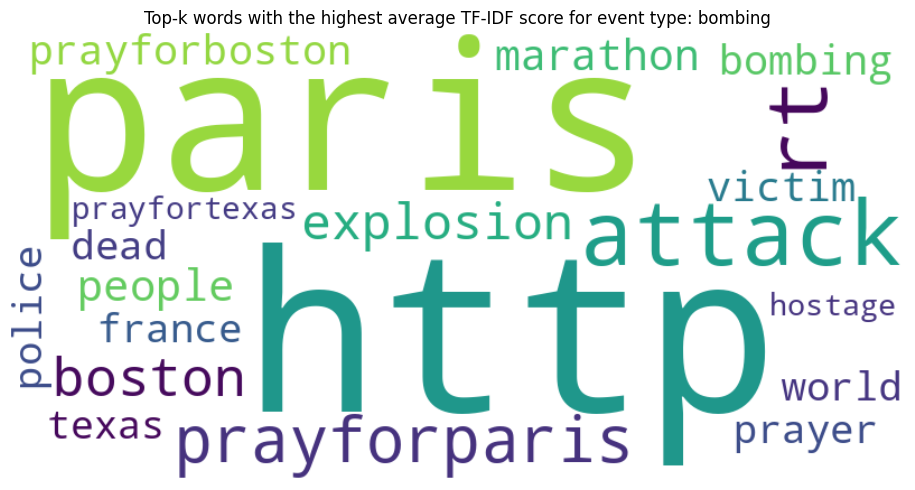

----------------------------------------------------------------------------
Top-k words with the highest average TF-IDF score for event type: earthquake
http: 0.0989
nepal: 0.0669
earthquake: 0.0533
nepalearthquake: 0.0354
philippine: 0.0308
prayer: 0.0215
help: 0.0214
rt: 0.0203
magnitude: 0.0194
quake: 0.0192
people: 0.0186
god: 0.0186
hit: 0.0169
safe: 0.0152
amp: 0.0149
nepalquake: 0.0140
news: 0.0126
pray: 0.0114
manila: 0.0103
strong: 0.0102
----------------------------------------------------------------------------
Wordcloud for event type: earthquake


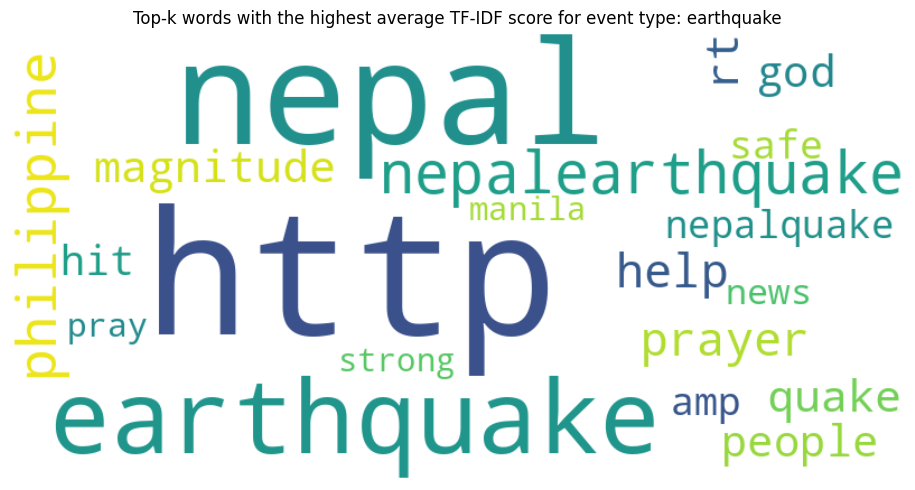

----------------------------------------------------------------------------
Top-k words with the highest average TF-IDF score for event type: flood
http: 0.0800
flood: 0.0534
rt: 0.0507
south: 0.0304
africa: 0.0296
rain: 0.0240
flooding: 0.0238
bigwet: 0.0230
yycflood: 0.0227
durban: 0.0210
people: 0.0210
kzn: 0.0177
river: 0.0167
heavy: 0.0166
dead: 0.0162
help: 0.0159
coflood: 0.0155
durbanfloods: 0.0153
water: 0.0151
amp: 0.0149
----------------------------------------------------------------------------
Wordcloud for event type: flood


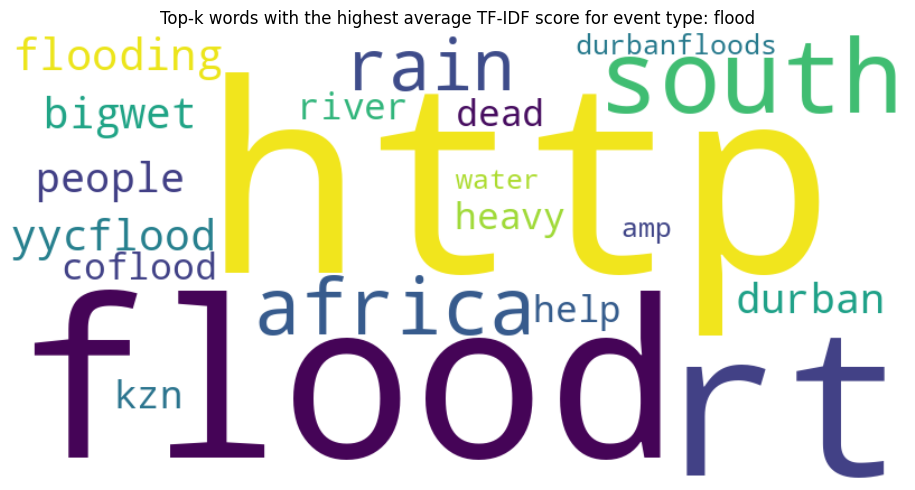

----------------------------------------------------------------------------
Top-k words with the highest average TF-IDF score for event type: shooting
shooting: 0.0876
http: 0.0776
school: 0.0656
dallas: 0.0622
police: 0.0344
rt: 0.0333
synagogue: 0.0303
colorado: 0.0298
injured: 0.0271
shot: 0.0271
protest: 0.0259
people: 0.0247
cop: 0.0236
officer: 0.0227
san: 0.0196
florida: 0.0194
diego: 0.0193
lax: 0.0179
suspect: 0.0178
say: 0.0176
----------------------------------------------------------------------------
Wordcloud for event type: shooting


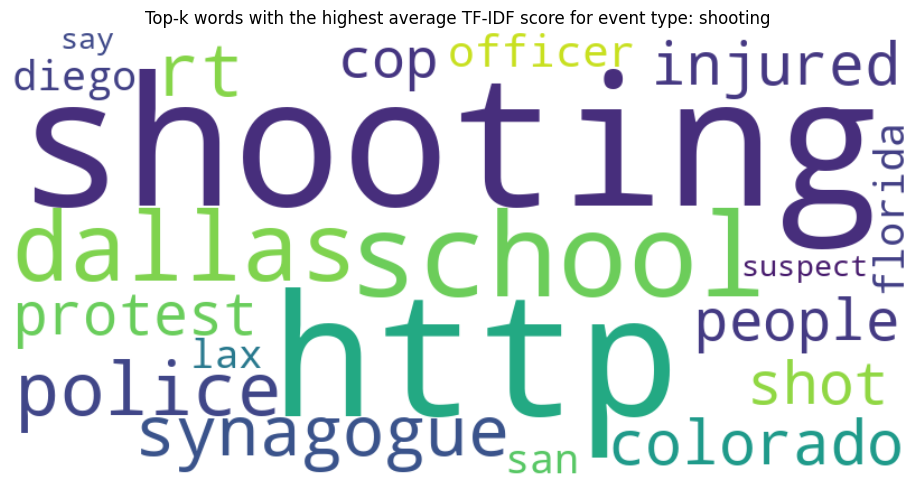

----------------------------------------------------------------------------
Top-k words with the highest average TF-IDF score for event type: typhoon
http: 0.0816
rubyph: 0.0556
typhoon: 0.0487
philippine: 0.0439
hagupit: 0.0397
mozambique: 0.0287
cyclone: 0.0258
safe: 0.0248
hurricane: 0.0239
storm: 0.0193
rt: 0.0190
hit: 0.0176
kenneth: 0.0159
people: 0.0156
hurricaneflorence: 0.0155
rain: 0.0141
pray: 0.0140
help: 0.0140
florence: 0.0138
haiyan: 0.0132
----------------------------------------------------------------------------
Wordcloud for event type: typhoon


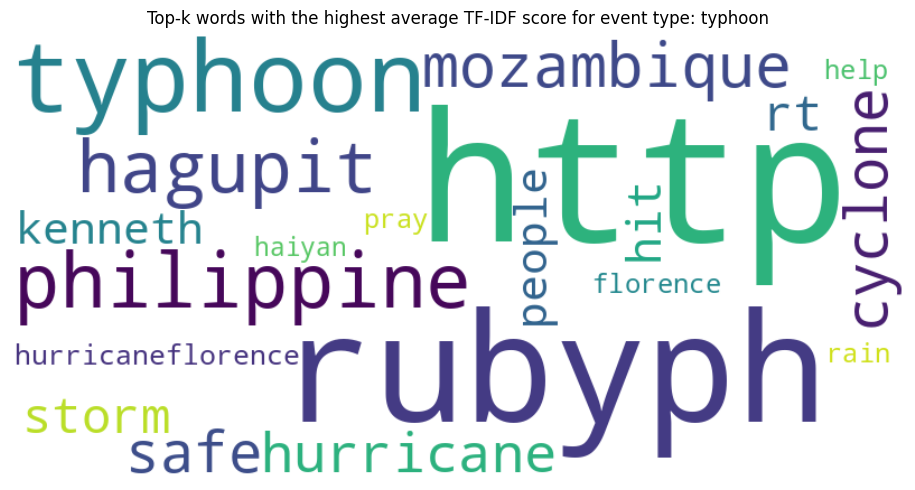

----------------------------------------------------------------------------
Top-k words with the highest average TF-IDF score for event type: wildfire
http: 0.0733
ymmfire: 0.0616
ymm: 0.0413
wildfire: 0.0348
rt: 0.0346
alberta: 0.0280
high: 0.0247
safe: 0.0244
level: 0.0234
abfire: 0.0231
fort: 0.0227
nswfires: 0.0200
smoke: 0.0189
mcmurray: 0.0186
evacuation: 0.0180
stay: 0.0175
amp: 0.0165
people: 0.0154
thought: 0.0153
home: 0.0146
----------------------------------------------------------------------------
Wordcloud for event type: wildfire


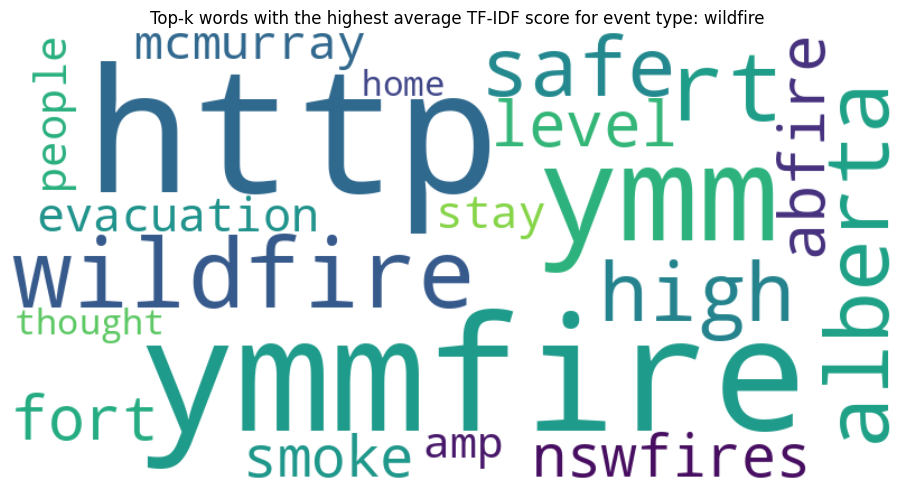

In [ ]:
top_k_words_by_event_type = {}
top_k = 20

for event_type, tfidf in tfidf_by_event_type.items():
    print("----------------------------------------------------------------------------")
    print(f"Top-k words with the highest average TF-IDF score for event type: {event_type}")
    tfidf_means = np.asarray(tfidf.mean(axis=0)).flatten()
    vectorizer  = vectorizer_by_event_type[event_type].get_feature_names_out()
    top_indices = tfidf_means.argsort()[::-1][:top_k]
    top_words = [(vectorizer[i], tfidf_means[i]) for i in top_indices]
    for word, score in top_words:
        print(f"{word}: {score:.4f}")
    print("----------------------------------------------------------------------------")
    print(f"Wordcloud for event type: {event_type}")
    wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(dict(top_words))
    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis('off')
    plt.title(f'Top-k words with the highest average TF-IDF score for event type: {event_type}')
    plt.tight_layout()
    plt.show()

#### KMeans + Elbow & Silhouette Methods

In [ ]:
def elbow_method_all_types(tfidf_by_event_type, max_k=10):
    for event_type, tfidf in tfidf_by_event_type.items():
        scores = []
        k_range = range(1, max_k + 1)

        for k in k_range:
            kmeans = KMeans(n_clusters=k, random_state=42)
            kmeans.fit(tfidf)
            scores.append(kmeans.inertia_)

        plt.figure(figsize=(10, 6))
        plt.plot(k_range, scores, marker='o')
        plt.xlabel('Number of Clusters (k)')
        plt.ylabel('Inertia')
        plt.title(f'Elbow Method for Optimal k for event type: {event_type}')
        plt.xticks(k_range)
        plt.grid(True)
        plt.tight_layout()
        plt.show()

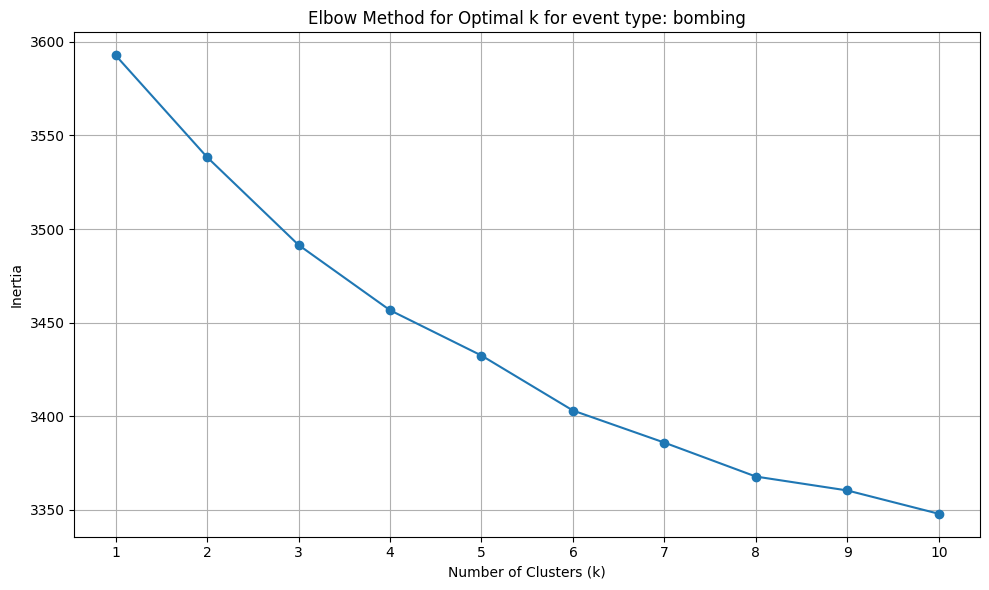

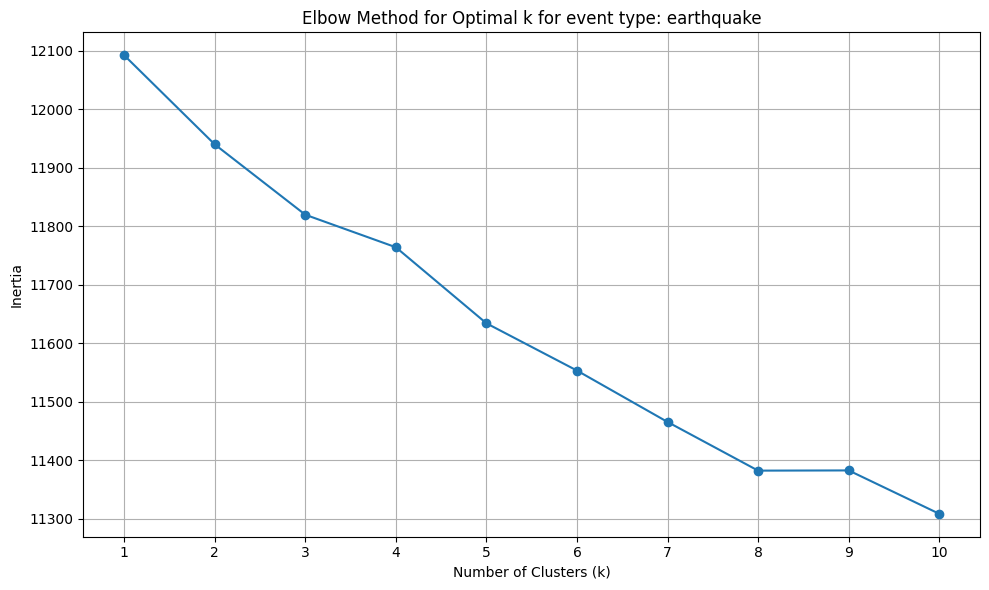

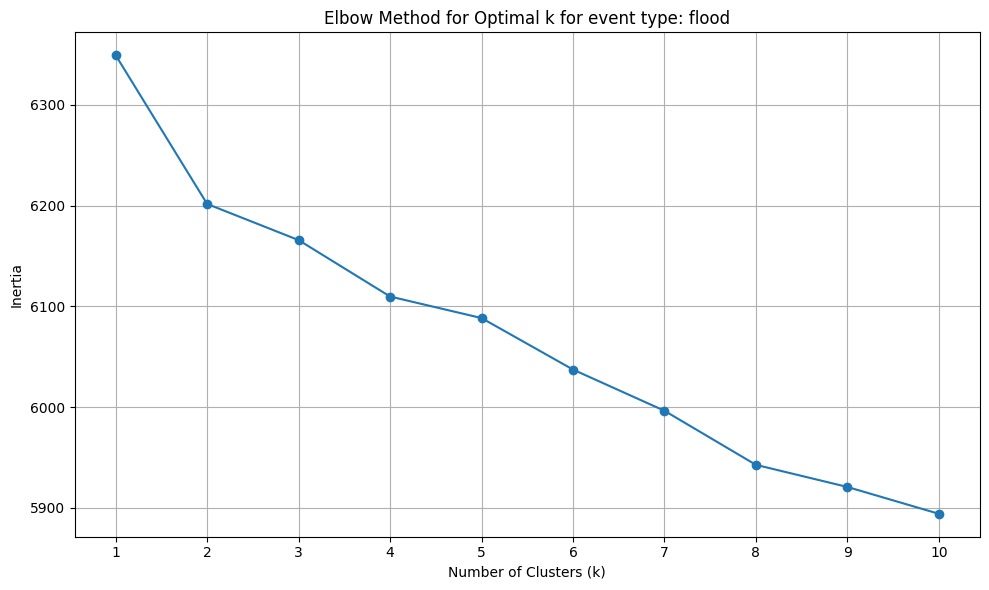

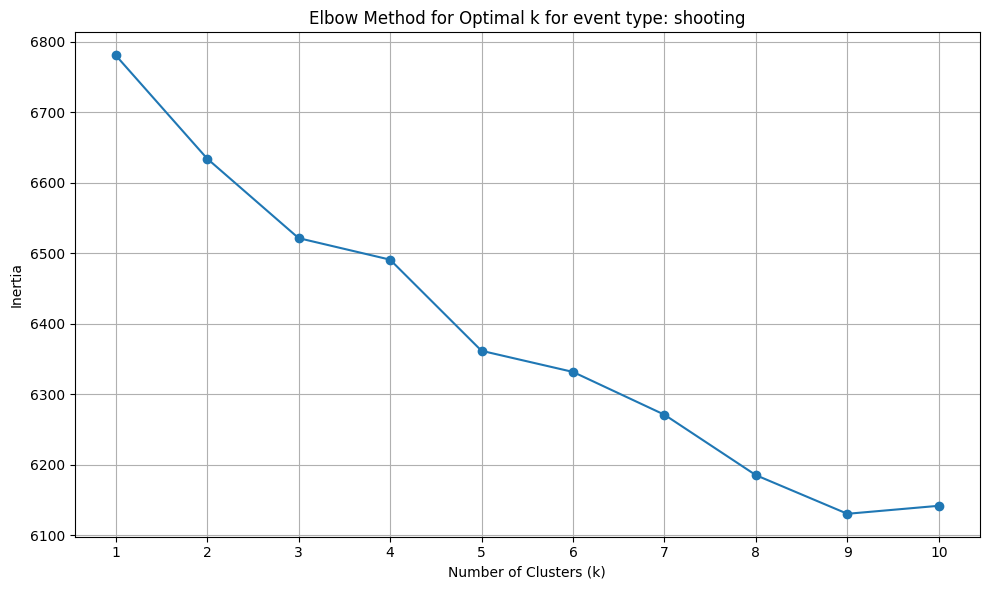

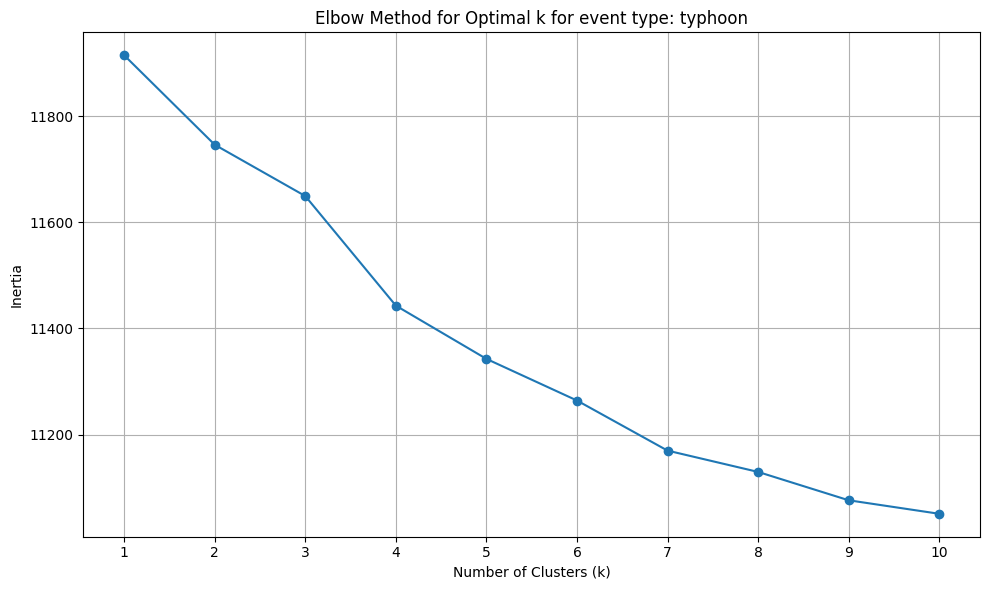

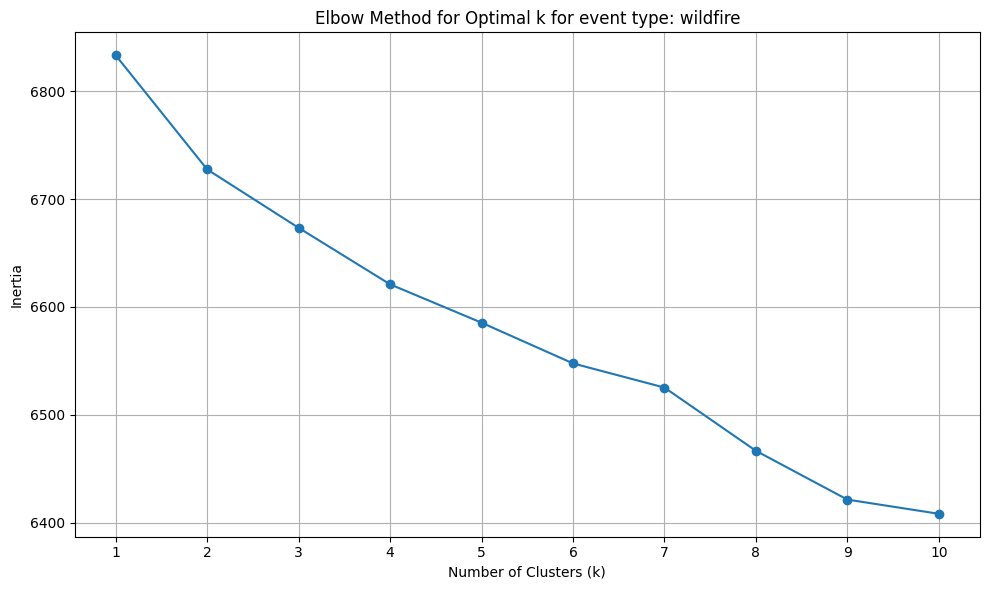

In [ ]:
elbow_method_all_types(tfidf_by_event_type)

In [ ]:
def silhouette_analysis_all_types(tfidf_by_event_type, max_k=10):
    best_k_by_event_type = {}
    for event_type, tfidf in tqdm(tfidf_by_event_type.items(), desc="Processing event types"):
        scores = []
        k_range = range(2, max_k + 1)

        for k in k_range:
            kmeans = KMeans(n_clusters=k, random_state=42)
            kmeans.fit(tfidf)
            labels = kmeans.labels_
            score = silhouette_score(tfidf, labels)
            scores.append(score)
        best_k = k_range[scores.index(max(scores))]
        best_k_by_event_type[event_type] = best_k
        print(f"\nBest k for event type {event_type}: {best_k}")
        print("\n----------------------------------------------------------------------------")
        plt.figure(figsize=(10, 6))
        plt.plot(k_range[:len(scores)], scores, marker='o')
        plt.xlabel('Number of Clusters (k)')
        plt.ylabel('Silhouette Score')
        plt.title(f'Silhouette Analysis for Optimal k for event type: {event_type}')
        plt.xticks(k_range[:len(scores)])
        plt.grid(True)
        plt.tight_layout()
        plt.show()
        print("\n----------------------------------------------------------------------------")
    return best_k_by_event_type

Processing event types:   0%|          | 0/6 [00:00<?, ?it/s]


Best k for event type bombing: 8

----------------------------------------------------------------------------


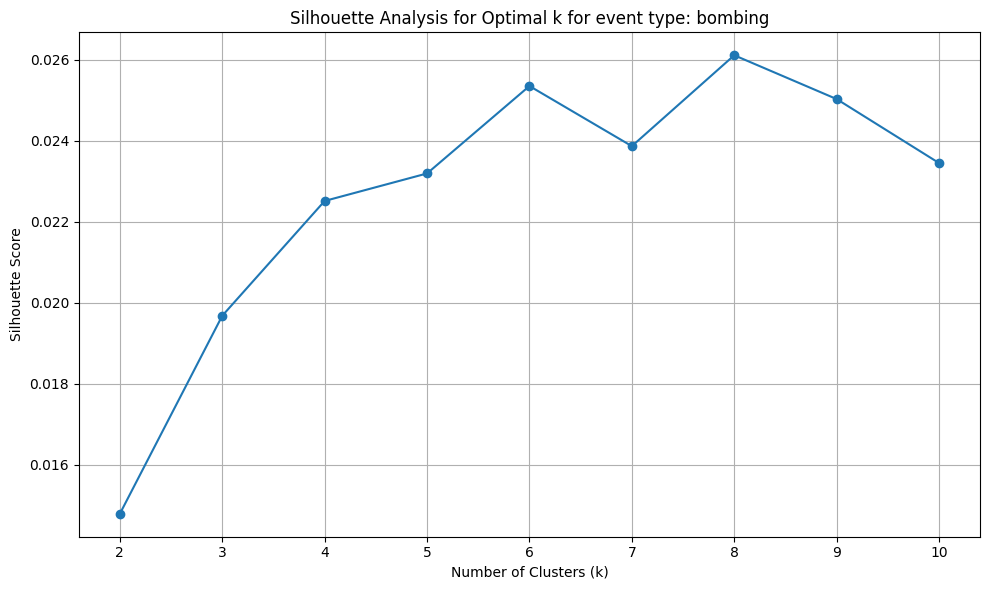

Processing event types:  17%|█▋        | 1/6 [00:05<00:29,  5.96s/it]


----------------------------------------------------------------------------

Best k for event type earthquake: 5

----------------------------------------------------------------------------


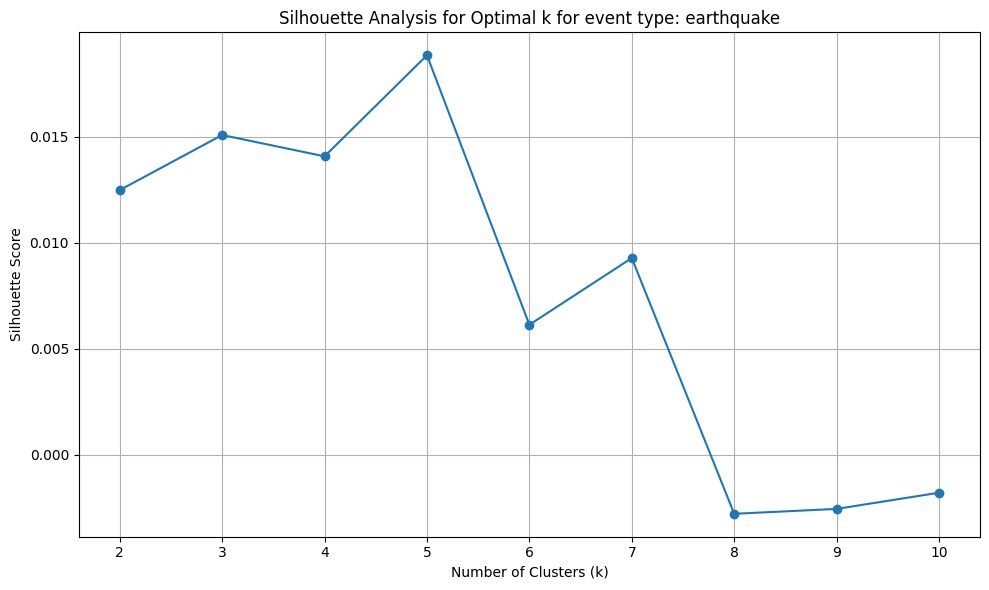

Processing event types:  33%|███▎      | 2/6 [01:28<03:23, 50.99s/it]


----------------------------------------------------------------------------

Best k for event type flood: 10

----------------------------------------------------------------------------


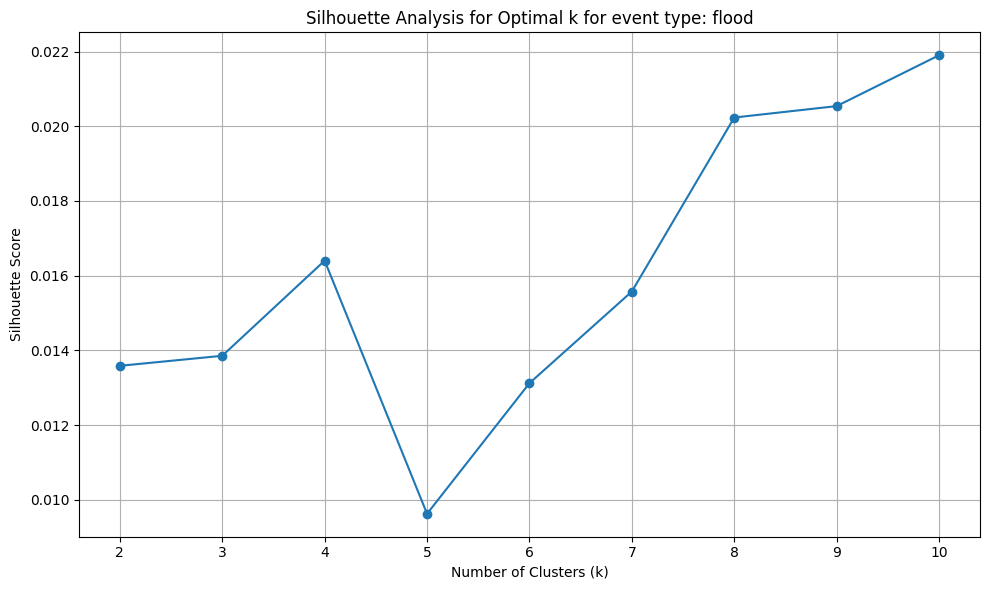

Processing event types:  50%|█████     | 3/6 [01:50<01:52, 37.65s/it]


----------------------------------------------------------------------------

Best k for event type shooting: 8

----------------------------------------------------------------------------


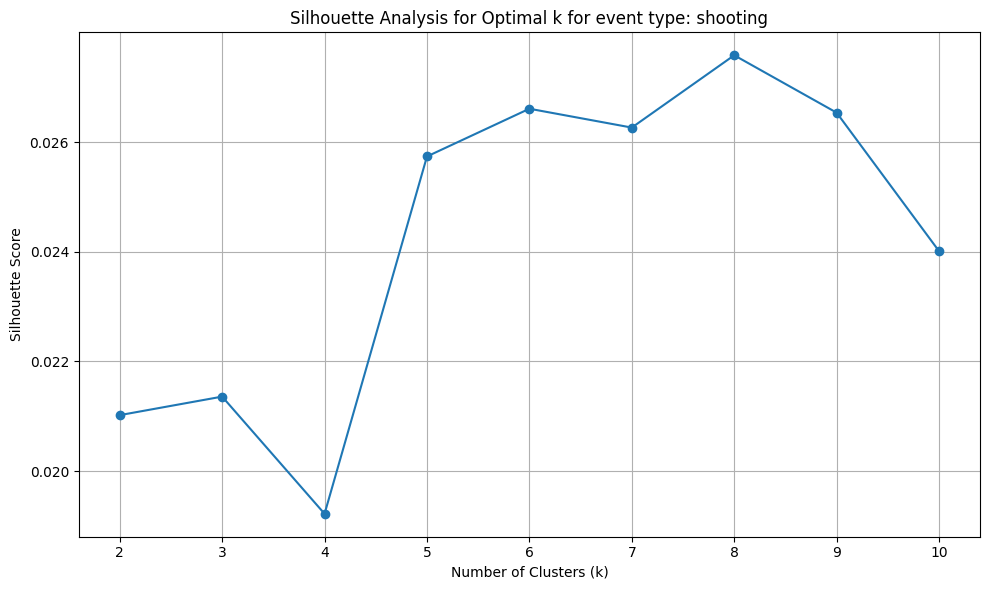

Processing event types:  67%|██████▋   | 4/6 [02:10<01:01, 30.69s/it]


----------------------------------------------------------------------------

Best k for event type typhoon: 4

----------------------------------------------------------------------------


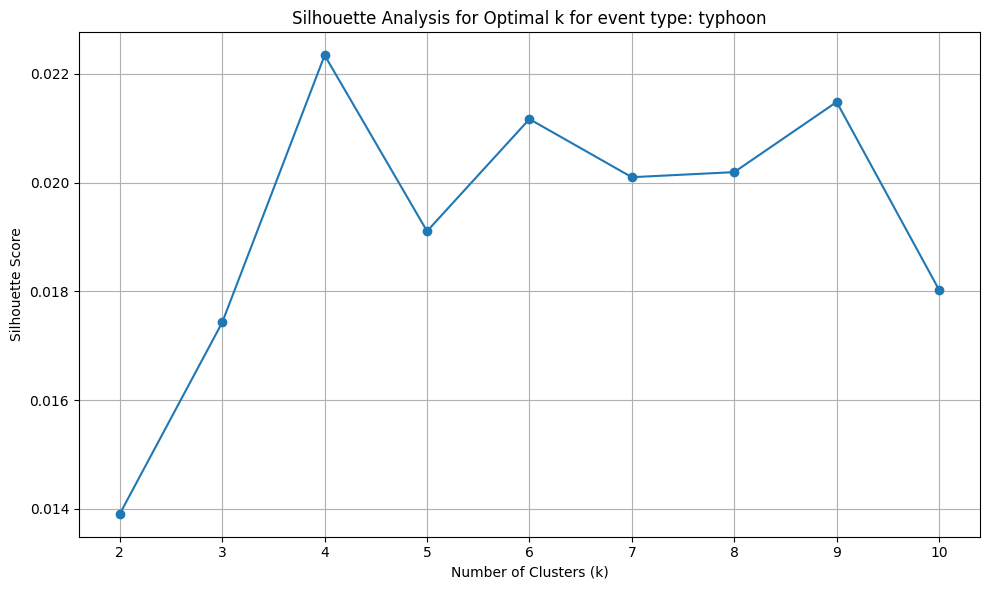

Processing event types:  83%|████████▎ | 5/6 [03:23<00:46, 46.15s/it]


----------------------------------------------------------------------------

Best k for event type wildfire: 10

----------------------------------------------------------------------------


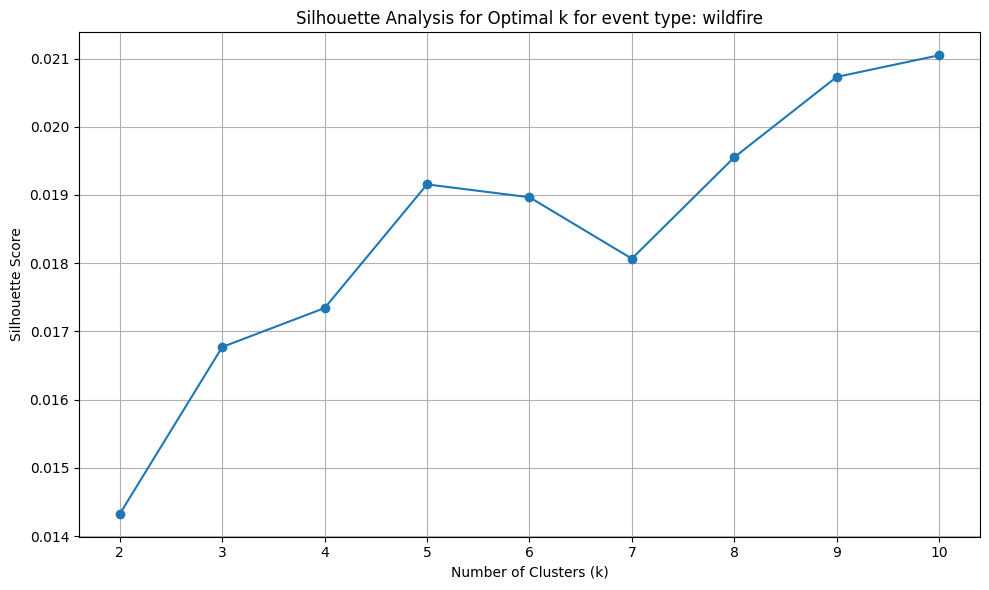

Processing event types: 100%|██████████| 6/6 [03:52<00:00, 38.82s/it]


----------------------------------------------------------------------------


In [ ]:
best_k_by_type = silhouette_analysis_all_types(tfidf_by_event_type, max_k=10)

In [ ]:
clustered_tweets_by_event_type = {}

for event_type, tfidf in tfidf_by_event_type.items():
    optimal_k = best_k_by_type[event_type]
    kmeans = KMeans(n_clusters=optimal_k, random_state=42)
    clusters = kmeans.fit_predict(tfidf)

    df_clean = cleaned_tweets_by_event_type[event_type].copy()
    df_clean['cluster'] = clusters

    clustered_tweets_by_event_type[event_type] = df_clean

#### t-SNE of Clusters

In [ ]:
def tsne_cluster_plot(event_type):
    for event_type in tfidf_by_event_type:
        print(f"Plotting t-SNE for event type: {event_type}")
        tfidf = tfidf_by_event_type[event_type]
        df_clean = cleaned_tweets_by_event_type[event_type]
        optimal_k = best_k_by_type[event_type]

        tsne = TSNE(n_components=2, perplexity=30, random_state=42)
        x_tsne = tsne.fit_transform(tfidf.toarray())

        df_clean['tsne_x'] = x_tsne[:, 0]
        df_clean['tsen_y'] = x_tsne[:, 1]
        df_clean['cluster'] = KMeans(n_clusters=optimal_k, random_state=42).fit_predict(tfidf)

        plt.figure(figsize=(10,6))
        for i in range(optimal_k):
            cluster_data = df_clean[df_clean['cluster'] == i]
            plt.scatter(cluster_data['tsne_x'], cluster_data['tsen_y'], label=f'Cluster {i}', alpha=0.6)
        plt.title(f't-SNE Visualization of Clusters for event type: {event_type}')
        plt.xlabel('t-SNE Dimension 1')
        plt.ylabel('t-SNE Dimension 2')
        plt.legend()
        plt.show()
        print("\n----------------------------------------------------------------------------")
        print(f"Top words in cluster for event type: {event_type}")
        vectorizer = vectorizer_by_event_type[event_type]
        vocab = vectorizer.get_feature_names_out()
        for i in range(optimal_k):
            cluster_data_text = df_clean[df_clean['cluster'] == i]['text']
            vectorized = vectorizer.transform(cluster_data_text)
            mean_tfidf = np.asarray(vectorized.mean(axis=0)).flatten()
            top_indices = mean_tfidf.argsort()[::-1][:10]
            top_words = [vocab[i] for i in top_indices]
            print(f"Top words in cluster {i}: {', '.join(top_words)}")
        print("\n----------------------------------------------------------------------------")
        print("\n----------------------------------------------------------------------------")

Plotting t-SNE for event type: bombing


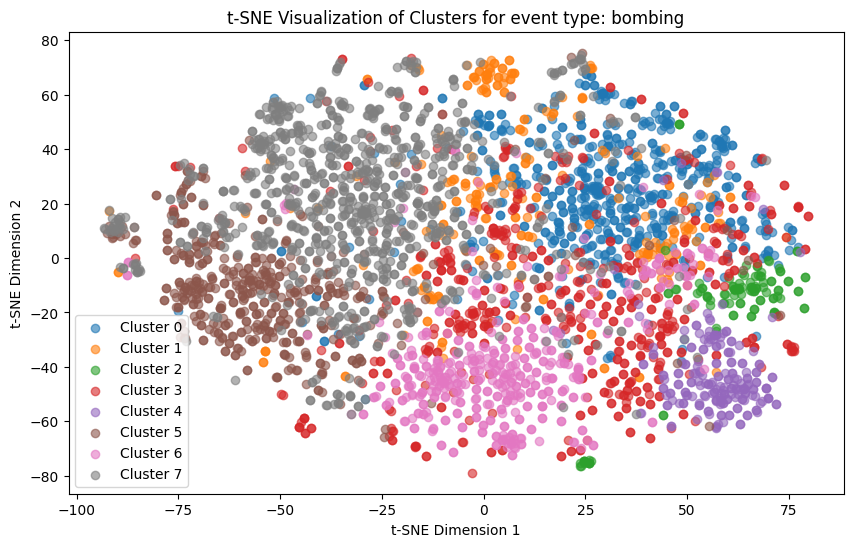


----------------------------------------------------------------------------
Top words in cluster for event type: bombing
Top words in cluster 0: prayforparis, http, paris, world, rt, people, prayer, love, prayforjapan, thought
Top words in cluster 1: victim, paris, porteouverte, http, family, parisattacks, attack, rt, prayer, shelter
Top words in cluster 2: prayfortexas, prayforboston, rt, texas, http, week, homeless, dare, world, far
Top words in cluster 3: rt, prayforboston, http, bostonmarathon, westtx, tsarnaev, westexplosion, prayforwest, people, west
Top words in cluster 4: texas, explosion, west, plant, fertilizer, waco, rt, tx, http, near
Top words in cluster 5: paris, hostage, police, dead, http, shooting, explosion, bataclan, france, 100
Top words in cluster 6: boston, marathon, bombing, rt, http, explosion, suspect, bomb, people, line
Top words in cluster 7: attack, paris, http, france, isi, rt, french, news, say, obama

----------------------------------------------------

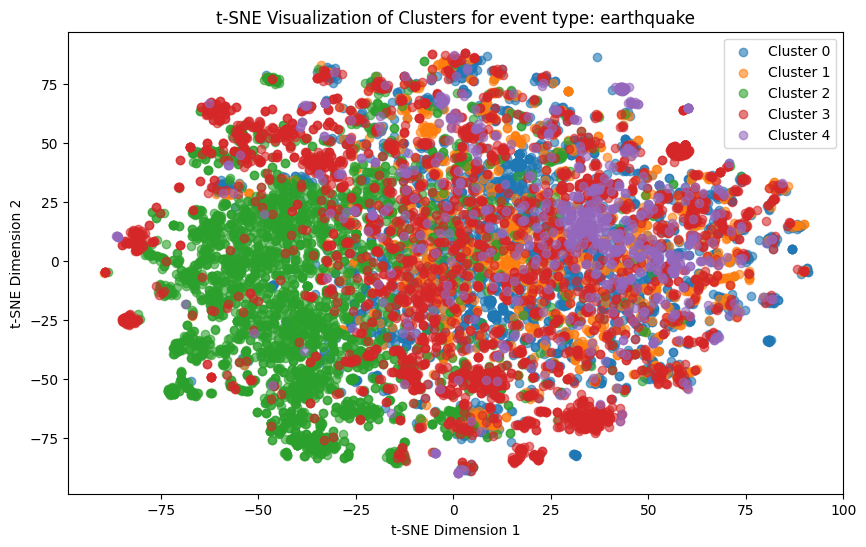


----------------------------------------------------------------------------
Top words in cluster for event type: earthquake
Top words in cluster 0: nepal, http, prayer, earthquake, quake, people, god, baltimore, amp, india
Top words in cluster 1: nepalearthquake, http, nepal, prayer, god, amp, people, baltimoreriots, missing, life
Top words in cluster 2: earthquake, philippine, http, magnitude, hit, safe, manila, quake, chile, luzon
Top words in cluster 3: http, nepalquake, rt, prayforvisayas, god, kathmandu, prayforthephilippines, prayer, typhoon, prayforbohol
Top words in cluster 4: help, nepal, http, rush, nepalearthquake, need, read, god, people, bennett

----------------------------------------------------------------------------

----------------------------------------------------------------------------
Plotting t-SNE for event type: flood


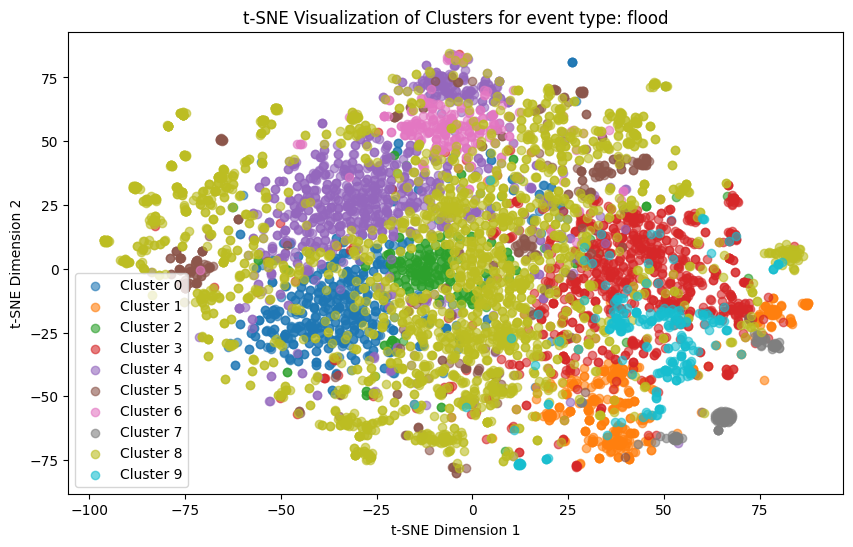


----------------------------------------------------------------------------
Top words in cluster for event type: flood
Top words in cluster 0: bigwet, qldfloods, rt, http, brisbane, qld, bundaberg, qpsmedia, power, abcnews
Top words in cluster 1: africa, south, http, heavy, rain, 51, 50, flood, dead, killed
Top words in cluster 2: boulderflood, boulder, rt, http, coflood, colorado, cowx, county, road, flooding
Top words in cluster 3: durban, kzn, durbanfloods, flood, http, kznfloods, people, affected, 51, death
Top words in cluster 4: yycflood, rt, abflood, yyc, http, rescueph, calgary, need, help, water
Top words in cluster 5: manila, juan, san, flood, metro, rt, http, river, rain, warning
Top words in cluster 6: reliefph, rt, donation, good, http, need, rescueph, help, relief, volunteer
Top words in cluster 7: 60, africa, south, leave, dead, flood, kimon, greef, nyt, york
Top words in cluster 8: http, rt, flood, coflood, flooding, colorado, colombia, river, maringph, australia
Top 

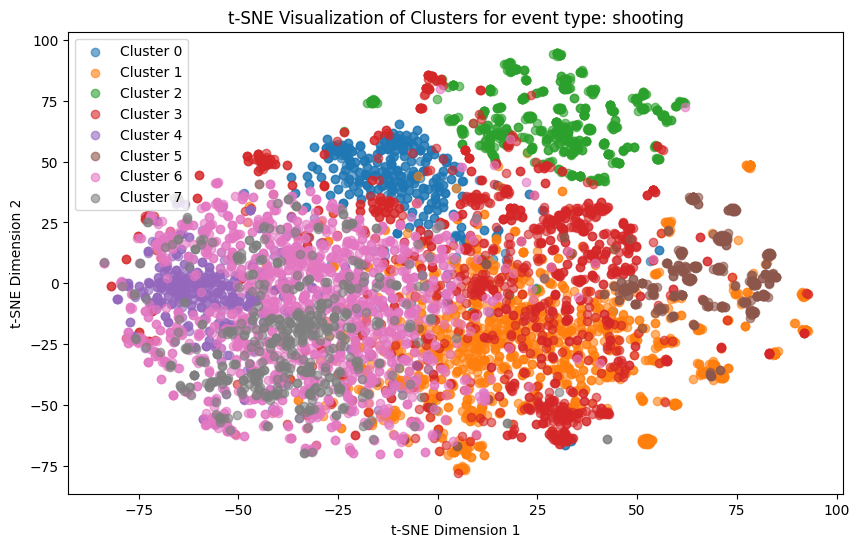


----------------------------------------------------------------------------
Top words in cluster for event type: shooting
Top words in cluster 0: lax, airport, rt, tsa, http, terminal, suspect, los, angeles, shot
Top words in cluster 1: school, shooting, http, florida, high, student, parkland, gun, realdonaldtrump, shot
Top words in cluster 2: synagogue, san, diego, poway, http, shooting, injured, man, california, detained
Top words in cluster 3: http, cruz, nikolas, rt, laxshooting, stemshooting, florida, shooting, colorado, parkland
Top words in cluster 4: officer, police, dallas, protest, shot, shooting, fired, report, http, downtown
Top words in cluster 5: colorado, school, injured, http, custody, shooting, student, denver, suspect, say
Top words in cluster 6: dallas, shooting, police, downtown, rt, protest, http, people, right, live
Top words in cluster 7: cop, dallas, shooting, protest, shot, rt, people, innocent, like, downtown

------------------------------------------------

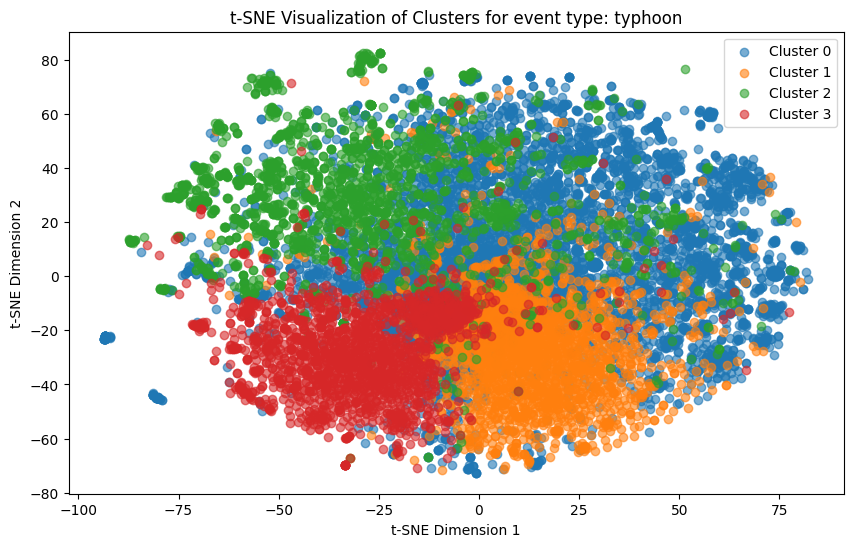


----------------------------------------------------------------------------
Top words in cluster for event type: typhoon
Top words in cluster 0: rubyph, http, safe, hagupit, rt, pabloph, pray, stay, typhoonhagupit, amp
Top words in cluster 1: hurricane, hurricaneflorence, florence, http, carolina, nc, north, power, storm, wilmington
Top words in cluster 2: typhoon, philippine, http, hagupit, haiyan, rt, hit, flee, slam, sweep
Top words in cluster 3: mozambique, cyclone, kenneth, http, hit, cyclonekenneth, idai, storm, people, tropical

----------------------------------------------------------------------------

----------------------------------------------------------------------------
Plotting t-SNE for event type: wildfire


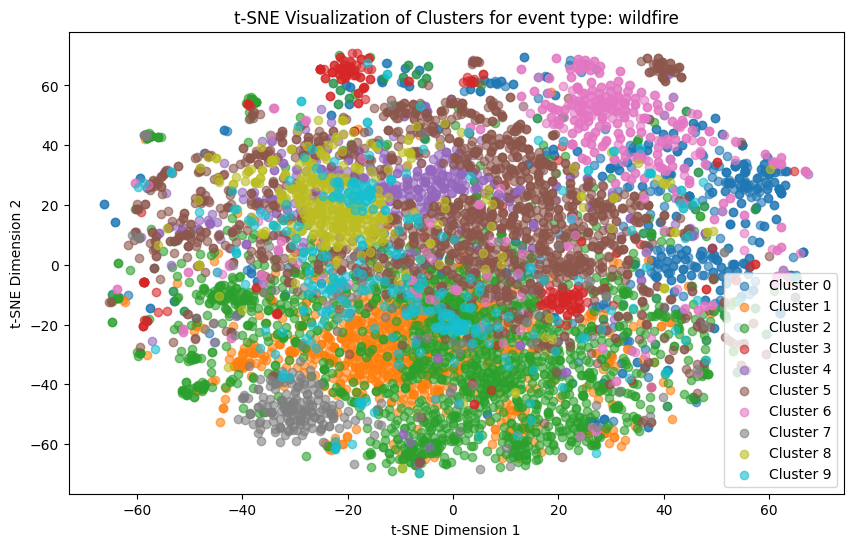


----------------------------------------------------------------------------
Top words in cluster for event type: wildfire
Top words in cluster 0: highparkfire, australia, rt, nsw, http, sydney, bush, firefighter, new, park
Top words in cluster 1: level, high, wildfire, http, alberta, town, near, evacuation, control, area
Top words in cluster 2: http, alberta, abfire, wildfire, northern, smoke, abwildfire, yyc, air, yeg
Top words in cluster 3: colorado, spring, http, wildfire, waldocanyonfire, rt, park, photo, cofire, home
Top words in cluster 4: fort, mcmurray, ymmfire, ymm, http, mac, wildfire, rt, thought, evacuation
Top words in cluster 5: ymmfire, ymm, http, rt, rmwb, fortmcmurray, evacuation, update, help, people
Top words in cluster 6: nswfires, nswrfs, rt, http, nsw, bushfires, sydney, blue, springwood, emergency
Top words in cluster 7: lake, slave, wildfire, http, evacuation, alert, evacuee, alberta, town, high
Top words in cluster 8: safe, stay, ymmfire, ymm, thought, fort, 

In [ ]:
tsne_cluster_plot(event_type)

#### BERTopic  

In [ ]:
embedding_model = SentenceTransformer('all-MiniLM-L6-v2')

bertopic_models = {}
topics_by_event_type = {}
probs_by_event_type = {}

for event_type, df_clean in cleaned_tweets_by_event_type.items():
    print(f"Fitting BERTopic for event type: {event_type}")
    text = df_clean['text'].tolist()
    topic_model = BERTopic(embedding_model=embedding_model, verbose=False)
    topics, probs = topic_model.fit_transform(text)
    bertopic_models[event_type] = topic_model
    topics_by_event_type[event_type] = topics
    probs_by_event_type[event_type] = probs

    topic_model.get_topic_info()

modules.json:   0%|          | 0.00/349 [00:00<?, ?B/s]

config_sentence_transformers.json:   0%|          | 0.00/116 [00:00<?, ?B/s]

README.md:   0%|          | 0.00/10.5k [00:00<?, ?B/s]

sentence_bert_config.json:   0%|          | 0.00/53.0 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/612 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/90.9M [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/350 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/466k [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/112 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/190 [00:00<?, ?B/s]

Fitting BERTopic for event type: bombing
Fitting BERTopic for event type: earthquake
Fitting BERTopic for event type: flood
Fitting BERTopic for event type: shooting
Fitting BERTopic for event type: typhoon
Fitting BERTopic for event type: wildfire


In [ ]:
for event_type, model in bertopic_models.items():
    print(f"Visualizations topics for event type: {event_type}")
    model.visualize_topics().show()
    print("\n----------------------------------------------------------------------------")
    model.visualize_barchart().show()
    print("\n----------------------------------------------------------------------------")

Visualizations topics for event type: bombing



----------------------------------------------------------------------------



----------------------------------------------------------------------------
Visualizations topics for event type: earthquake



----------------------------------------------------------------------------



----------------------------------------------------------------------------
Visualizations topics for event type: flood



----------------------------------------------------------------------------



----------------------------------------------------------------------------
Visualizations topics for event type: shooting



----------------------------------------------------------------------------



----------------------------------------------------------------------------
Visualizations topics for event type: typhoon



----------------------------------------------------------------------------



----------------------------------------------------------------------------
Visualizations topics for event type: wildfire



----------------------------------------------------------------------------



----------------------------------------------------------------------------


#### Word Embeddings — Word2Vec

In [ ]:
pretrained_w2v = api.load("word2vec-google-news-300")

[==================================================] 100.0% 1662.8/1662.8MB downloaded


In [ ]:
save_path = '/content/drive/MyDrive/Web Mining - Project/model'
w2v_models_by_type = {}

for event_type, df_clean in cleaned_tweets_by_event_type.items():
    print(f"Fitting Word2Vec for event type: {event_type}")
    text = df_clean['text'].dropna().apply(lambda x: x.split())
    w2v_model = Word2Vec(sentences=text, vector_size=100, window=5, min_count=4, workers=4)
    w2v_model.save(save_path + f'/word2vec_{event_type}.model')
    w2v_models_by_type[event_type] = w2v_model

Fitting Word2Vec for event type: bombing
Fitting Word2Vec for event type: earthquake
Fitting Word2Vec for event type: flood
Fitting Word2Vec for event type: shooting
Fitting Word2Vec for event type: typhoon
Fitting Word2Vec for event type: wildfire


In [ ]:
keywords = {
    "flood": "flood",
    "wildfire": "fire",
    "shooting": "shooting",
    "bombing": "bombing",
    "typhoon": "typhoon",
    "earthquake": "earthquake"
}

for event_type, keyword in keywords.items():
    print(f"Word2Vec Google News - Words similar to '{keyword}")
    for word, score in pretrained_w2v.most_similar(keyword, topn=10):
        print(f"{word} : {score:.3f}")
    print("\n----------------------------------------------------------------------------")

    print(f"Word2Vec Custom (tweets flood) - Words similar to '{keyword}")
    model = w2v_models_by_type.get(event_type)
    word_vectors = model.wv

    for word, score in word_vectors.most_similar(keyword, topn=10):
        print(f"{word} : {score:.3f}")
    print("\n----------------------------------------------------------------------------")

Word2Vec Google News - Words similar to 'flood
flooding : 0.789
floods : 0.767
Flood : 0.673
devastating_floods : 0.641
deluge : 0.623
flooded : 0.617
inundation : 0.612
flood_prone : 0.608
flash_floods : 0.604
flash_flooding : 0.592

----------------------------------------------------------------------------
Word2Vec Custom (tweets flood) - Words similar to 'flood
flooding : 0.996
torrential : 0.996
33 : 0.994
confirmed : 0.994
bbc : 0.993
news : 0.992
dozen : 0.992
southafrica : 0.991
flash : 0.990
risen : 0.990

----------------------------------------------------------------------------
Word2Vec Google News - Words similar to 'fire
blaze : 0.752
fires : 0.722
Fire : 0.699
flames : 0.639
carelessly_discarded_cigarette : 0.622
inferno : 0.606
firefighters : 0.604
alarm_blaze : 0.584
brush_fires : 0.580
grassfire : 0.576

----------------------------------------------------------------------------
Word2Vec Custom (tweets flood) - Words similar to 'fire
south : 0.985
forest : 0.979
bu

Plotting t-SNE for event type: bombing


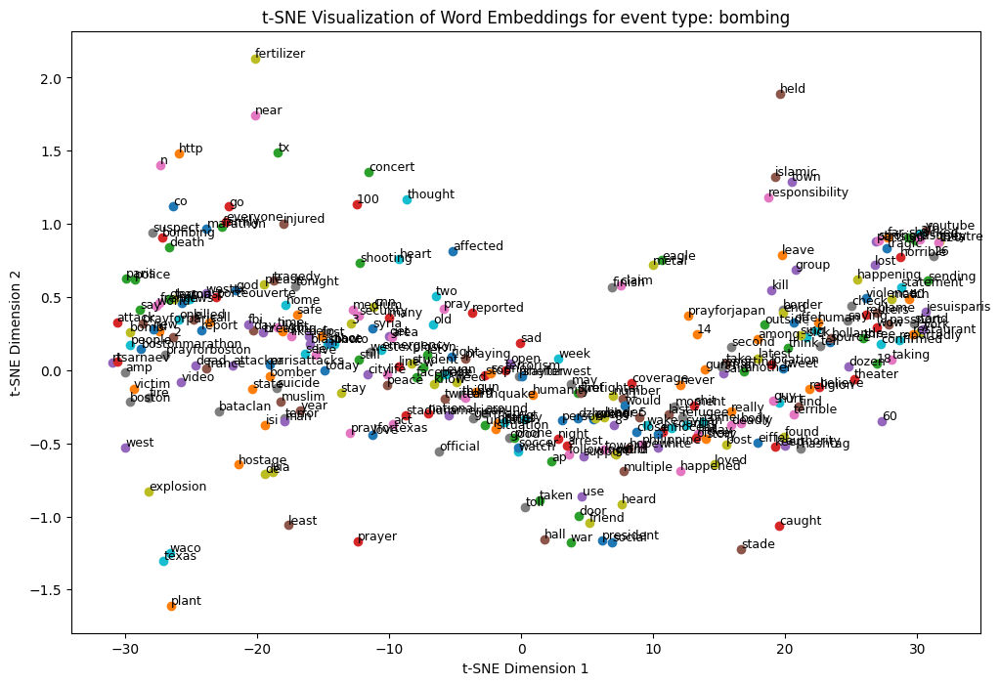


----------------------------------------------------------------------------
Plotting t-SNE for event type: earthquake


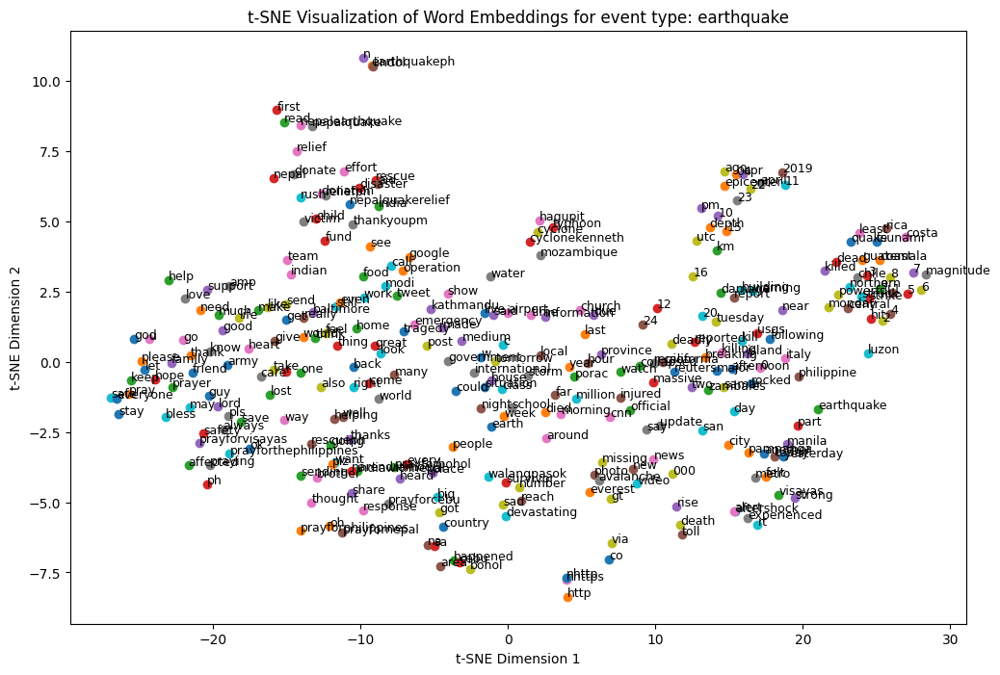


----------------------------------------------------------------------------
Plotting t-SNE for event type: flood


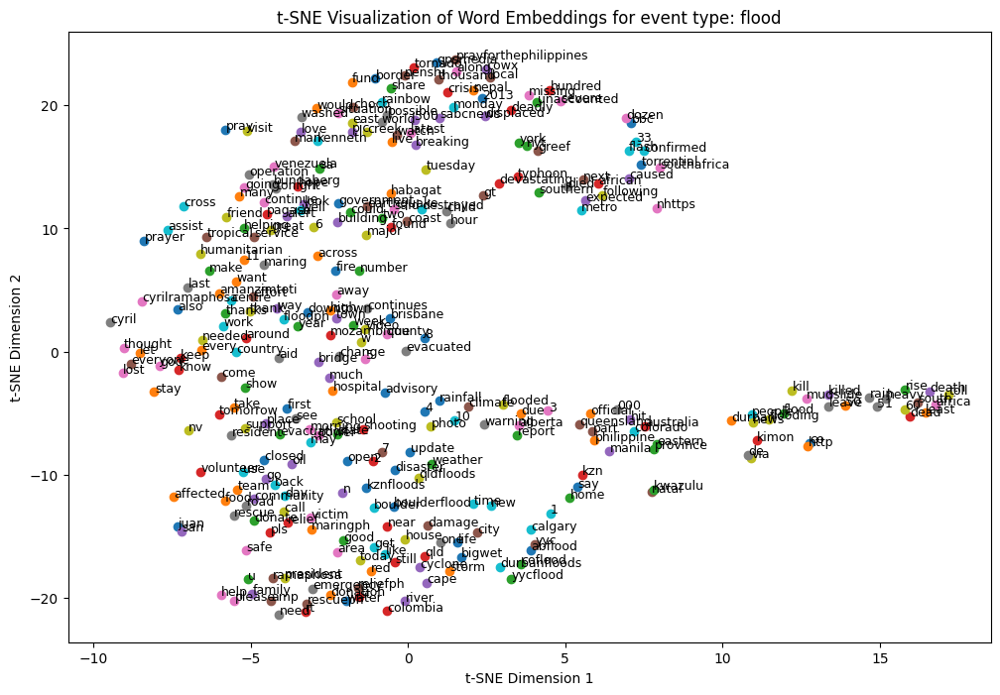


----------------------------------------------------------------------------
Plotting t-SNE for event type: shooting


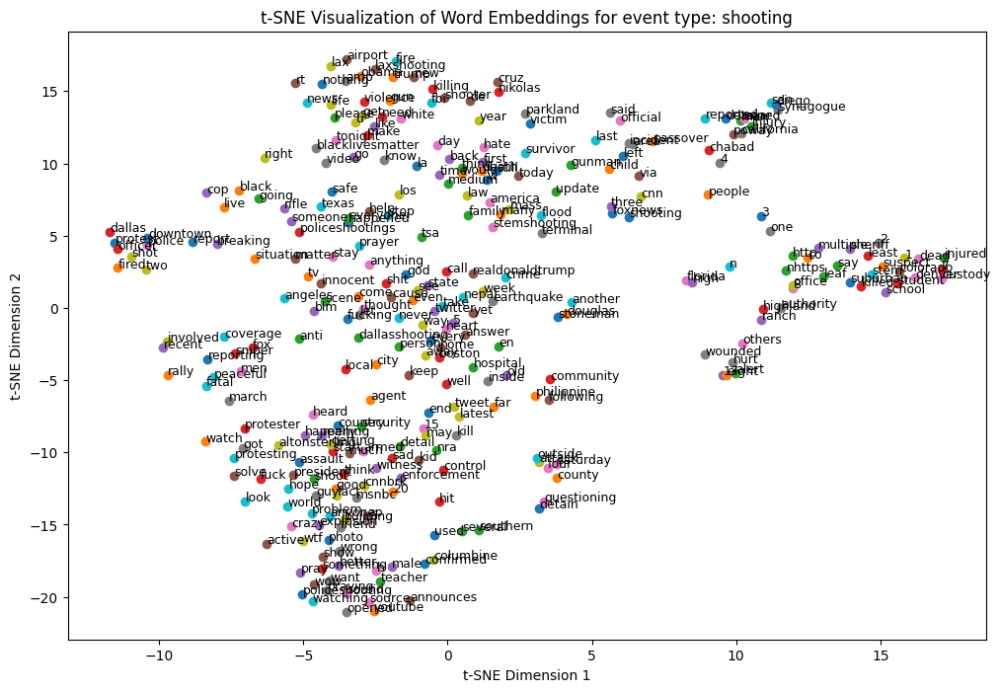


----------------------------------------------------------------------------
Plotting t-SNE for event type: typhoon


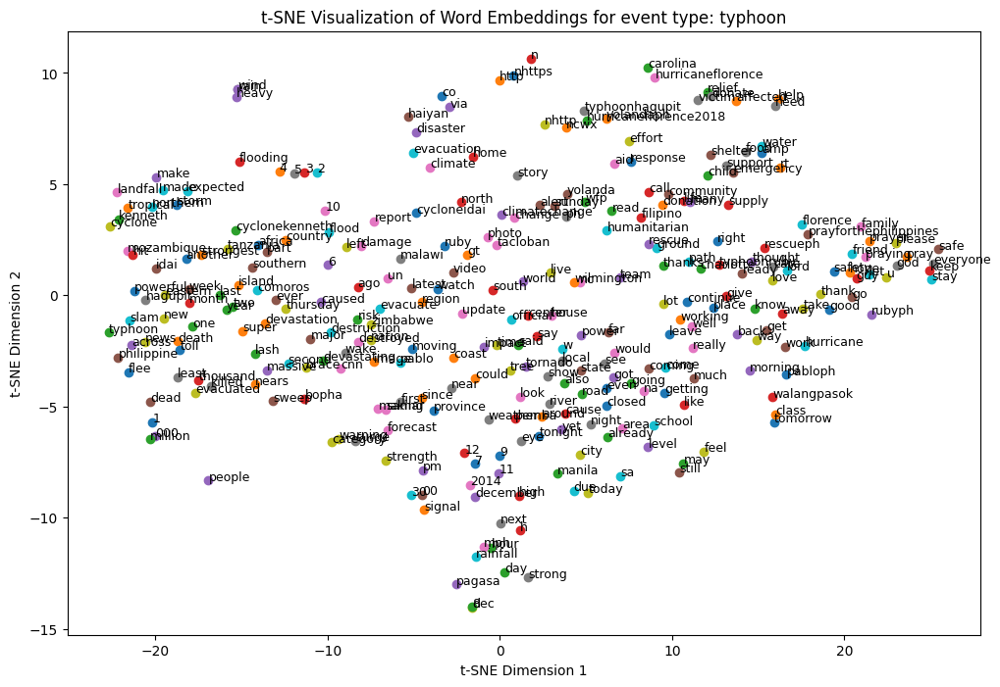


----------------------------------------------------------------------------
Plotting t-SNE for event type: wildfire


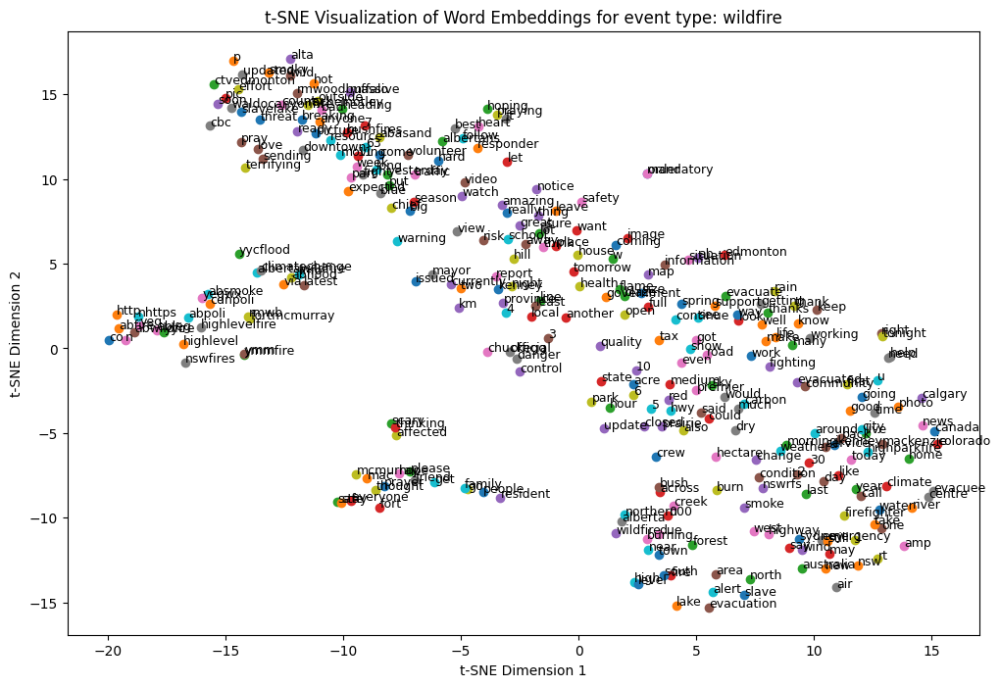


----------------------------------------------------------------------------


In [ ]:
for event_type, w2v_model in w2v_models_by_type.items():
    print(f"Plotting t-SNE for event type: {event_type}")
    word_vectors = w2v_model.wv
    words = list(word_vectors.key_to_index)[:300]
    vectors = [word_vectors[word] for word in words]

    # Apply t-SNE to the Word2Vec embeddings
    tsne = TSNE(n_components=2, random_state=42)
    x_2d = tsne.fit_transform(np.array(vectors))

    plt.figure(figsize=(12, 8))
    for i, word in enumerate(words):
        plt.scatter(x_2d[i, 0], x_2d[i, 1], label=word)
        plt.text(x_2d[i, 0]+0.01, x_2d[i, 1]+0.01, word, fontsize=9)
    plt.title(f't-SNE Visualization of Word Embeddings for event type: {event_type}')
    plt.xlabel('t-SNE Dimension 1')
    plt.ylabel('t-SNE Dimension 2')
    plt.show()
    print("\n----------------------------------------------------------------------------")

#### Sentence Embeddings

In [ ]:
model = SentenceTransformer('all-MiniLM-L6-v2')
sentence_embedding_by_type = {}

for event_type, df_clean in cleaned_tweets_by_event_type.items():
    print(f"Computing sentence embeddings for event type: {event_type}")
    sentence_embeddings = model.encode(df_clean['text'].tolist(), show_progress_bar=True)
    sentence_embedding_by_type[event_type] = sentence_embeddings

Computing sentence embeddings for event type: bombing


Batches:   0%|          | 0/116 [00:00<?, ?it/s]

Computing sentence embeddings for event type: earthquake


Batches:   0%|          | 0/390 [00:00<?, ?it/s]

Computing sentence embeddings for event type: flood


Batches:   0%|          | 0/205 [00:00<?, ?it/s]

Computing sentence embeddings for event type: shooting


Batches:   0%|          | 0/221 [00:00<?, ?it/s]

Computing sentence embeddings for event type: typhoon


Batches:   0%|          | 0/384 [00:00<?, ?it/s]

Computing sentence embeddings for event type: wildfire


Batches:   0%|          | 0/220 [00:00<?, ?it/s]

Plotting t-SNE for event type: bombing


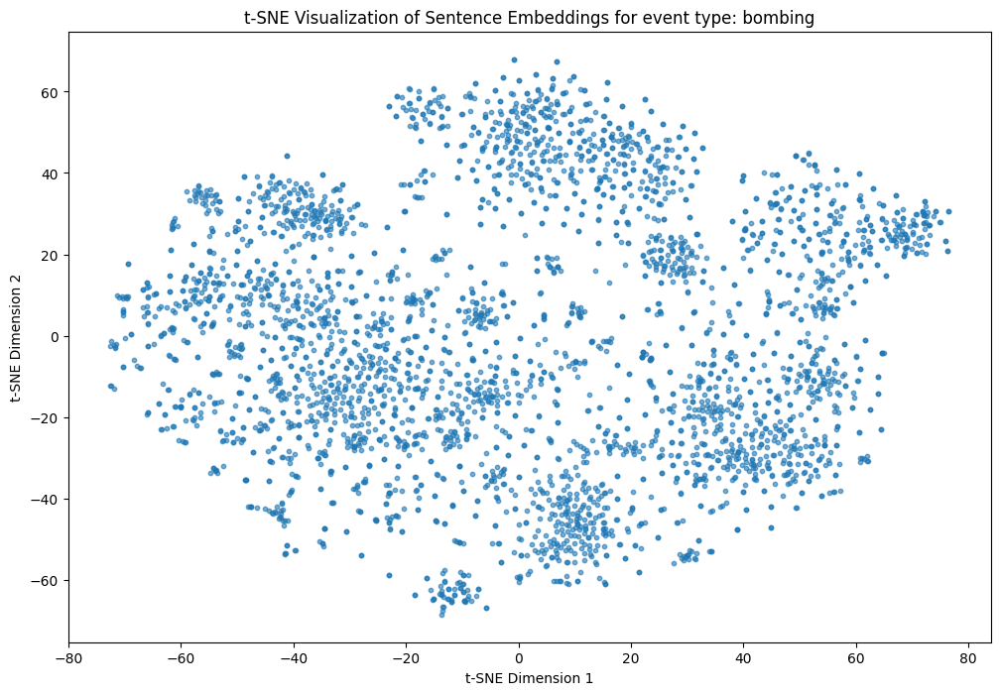


----------------------------------------------------------------------------
Plotting t-SNE for event type: earthquake


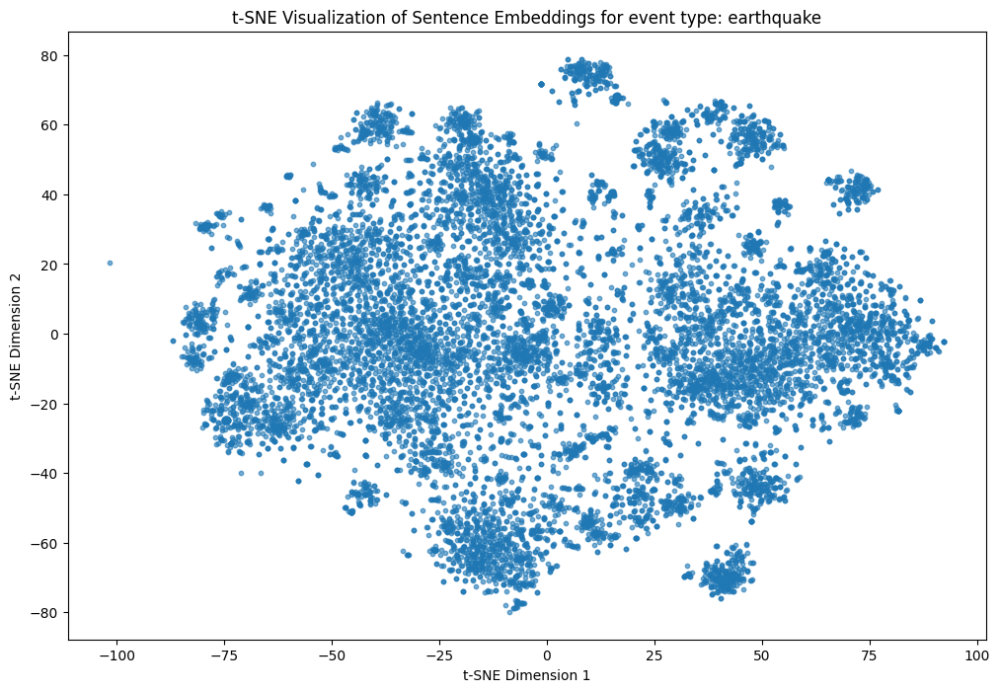


----------------------------------------------------------------------------
Plotting t-SNE for event type: flood


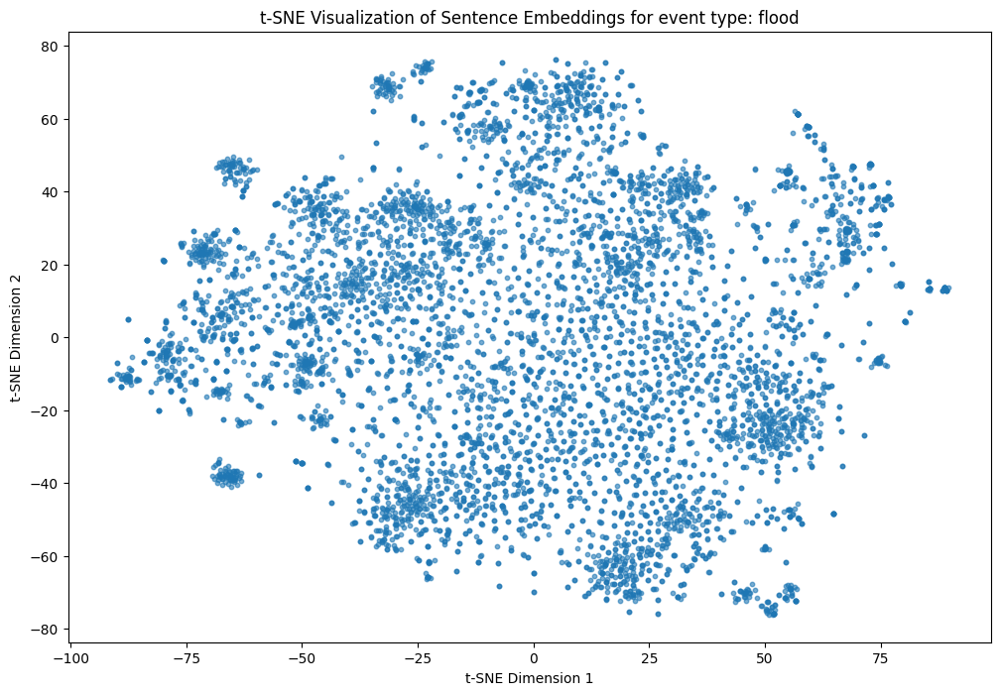


----------------------------------------------------------------------------
Plotting t-SNE for event type: shooting


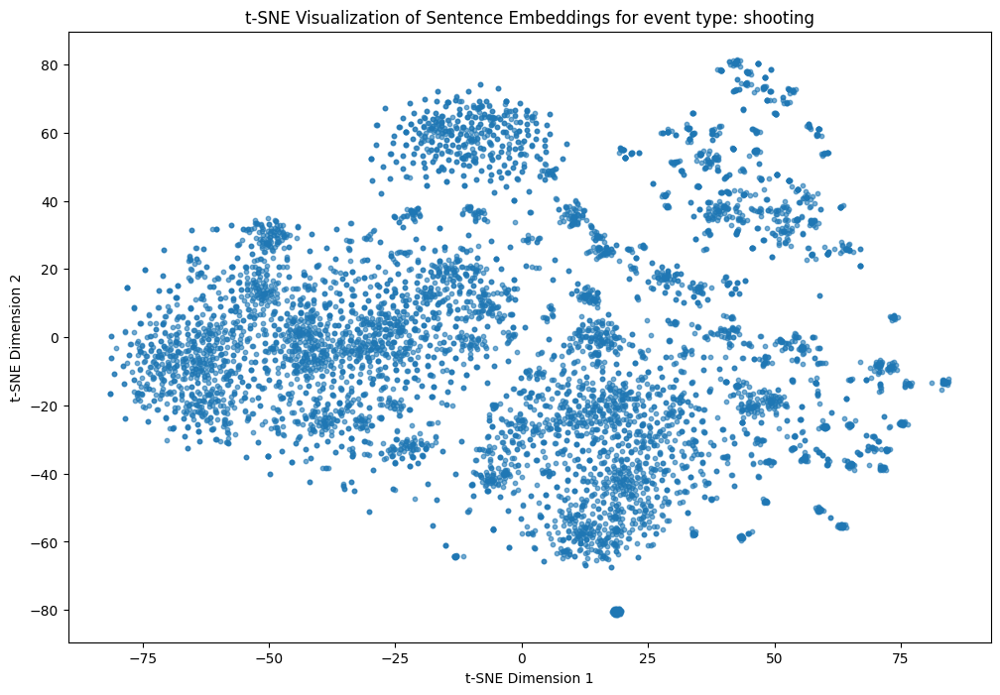


----------------------------------------------------------------------------
Plotting t-SNE for event type: typhoon


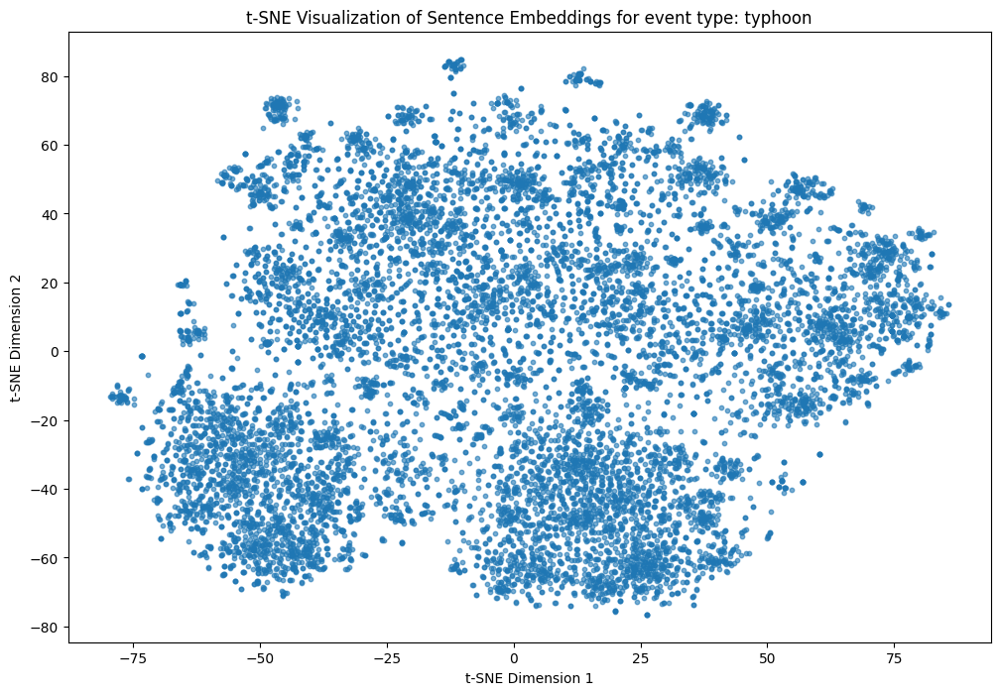


----------------------------------------------------------------------------
Plotting t-SNE for event type: wildfire


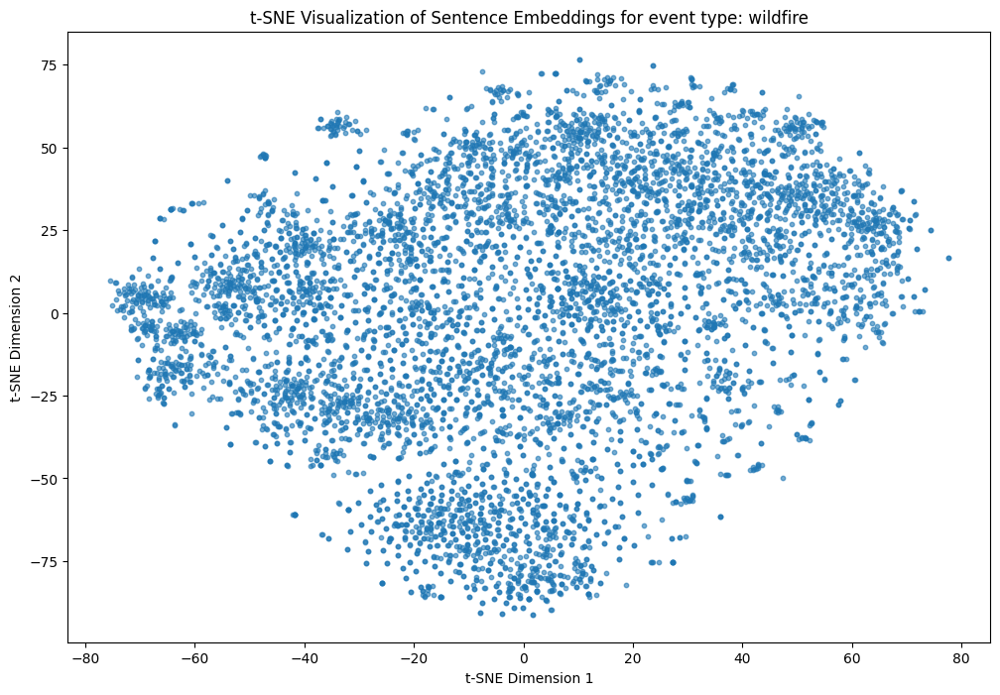


----------------------------------------------------------------------------


In [ ]:
for event_type, embeddings in sentence_embedding_by_type.items():
    print(f"Plotting t-SNE for event type: {event_type}")
    tsne = TSNE(n_components=2, perplexity=30, random_state=42)
    tweet_2d = tsne.fit_transform(embeddings)
    plt.figure(figsize=(12, 8))
    plt.scatter(tweet_2d[:, 0], tweet_2d[:, 1], s=10, alpha=0.6)
    plt.title(f't-SNE Visualization of Sentence Embeddings for event type: {event_type}')
    plt.xlabel('t-SNE Dimension 1')
    plt.ylabel('t-SNE Dimension 2')
    plt.show()
    print("\n----------------------------------------------------------------------------")

In [ ]:
model = SentenceTransformer('all-MiniLM-L6-v2')

tweet_embeddings_by_event_type = {}

for event_type, df_clean in cleaned_tweets_by_event_type.items():
    print(f"Computing tweet embeddings for event type: {event_type}")
    tweet_embeddings = model.encode(df_clean['text'].tolist(), show_progress_bar=True)
    tweet_embeddings_by_event_type[event_type] = tweet_embeddings
    print("\n----------------------------------------------------------------------------")

Computing tweet embeddings for event type: bombing


Batches:   0%|          | 0/116 [00:00<?, ?it/s]


----------------------------------------------------------------------------
Computing tweet embeddings for event type: earthquake


Batches:   0%|          | 0/390 [00:00<?, ?it/s]


----------------------------------------------------------------------------
Computing tweet embeddings for event type: flood


Batches:   0%|          | 0/205 [00:00<?, ?it/s]


----------------------------------------------------------------------------
Computing tweet embeddings for event type: shooting


Batches:   0%|          | 0/221 [00:00<?, ?it/s]


----------------------------------------------------------------------------
Computing tweet embeddings for event type: typhoon


Batches:   0%|          | 0/384 [00:00<?, ?it/s]


----------------------------------------------------------------------------
Computing tweet embeddings for event type: wildfire


Batches:   0%|          | 0/220 [00:00<?, ?it/s]


----------------------------------------------------------------------------


In [ ]:
def tsne_tweet_embeddings_per_type(tweet_embeddings_by_event_type):
    for event_type, tweet_embeddings in tweet_embeddings_by_event_type.items():
        print(f"Plotting t-SNE for event type: {event_type}")
        df_clean = cleaned_tweets_by_event_type[event_type].copy()
        tsne = TSNE(n_components=2, perplexity=30, random_state=42)
        tweet_2d = tsne.fit_transform(tweet_embeddings)
        df_clean['tsne_x'] = tweet_2d[:, 0]
        df_clean['tsen_y'] = tweet_2d[:, 1]

        plt.figure(figsize=(12, 8))
        plt.scatter(tweet_2d[:, 0], tweet_2d[:, 1], c=df_clean["cluster"], cmap='viridis', s=10, alpha=0.6)
        plt.title(f't-SNE Visualization of Tweet Embeddings for event type: {event_type}')
        plt.xlabel('t-SNE Dimension 1')
        plt.ylabel('t-SNE Dimension 2')
        plt.colorbar(label='TF-IDF Cluster')
        plt.show()
        print("\n----------------------------------------------------------------------------")

Plotting t-SNE for event type: bombing


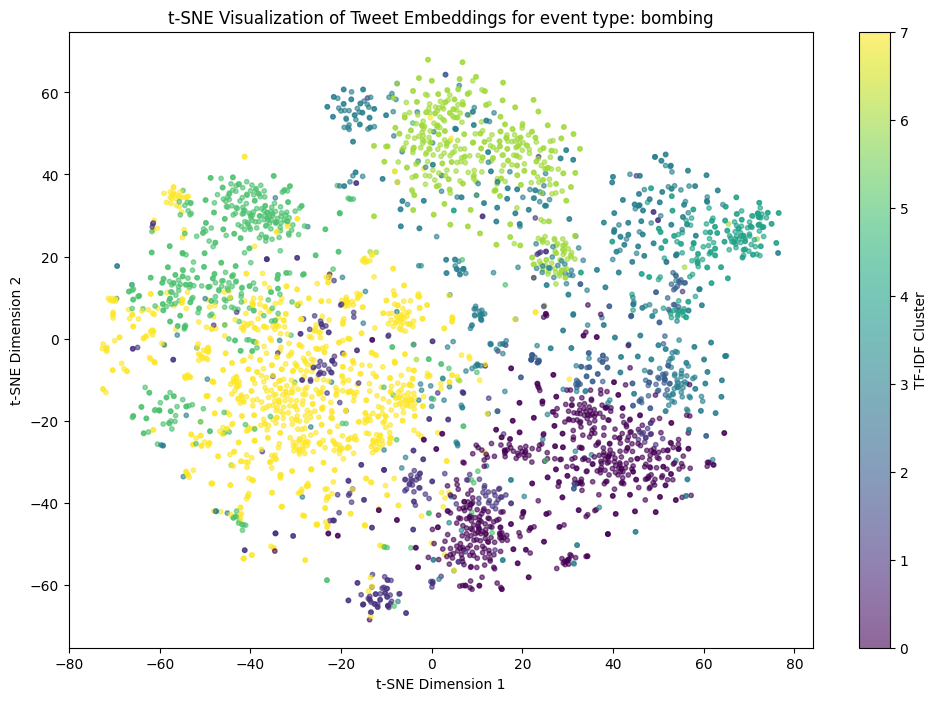


----------------------------------------------------------------------------
Plotting t-SNE for event type: earthquake


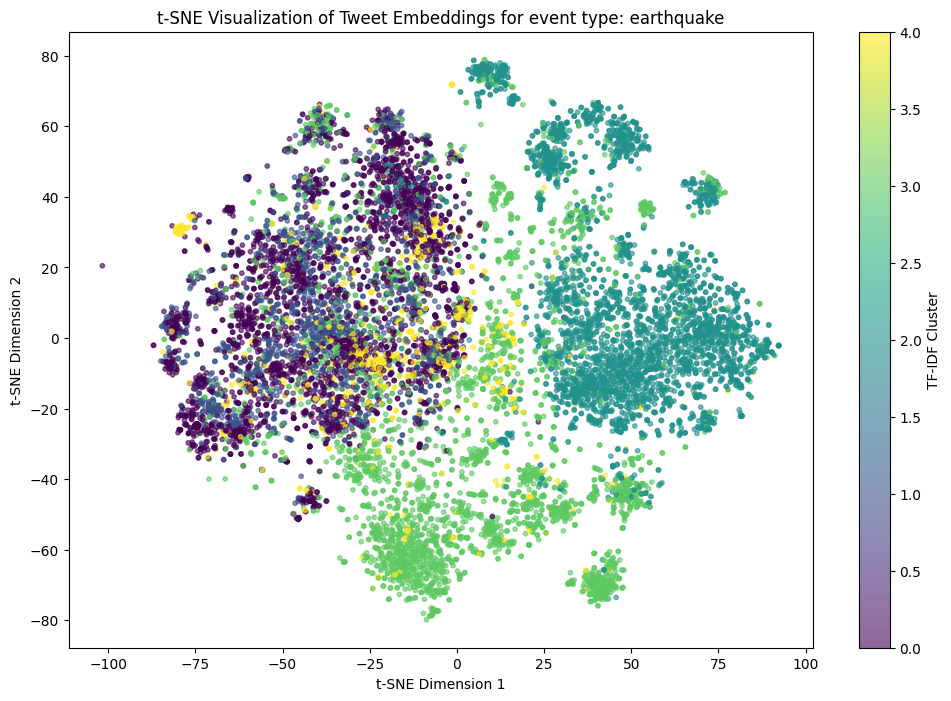


----------------------------------------------------------------------------
Plotting t-SNE for event type: flood


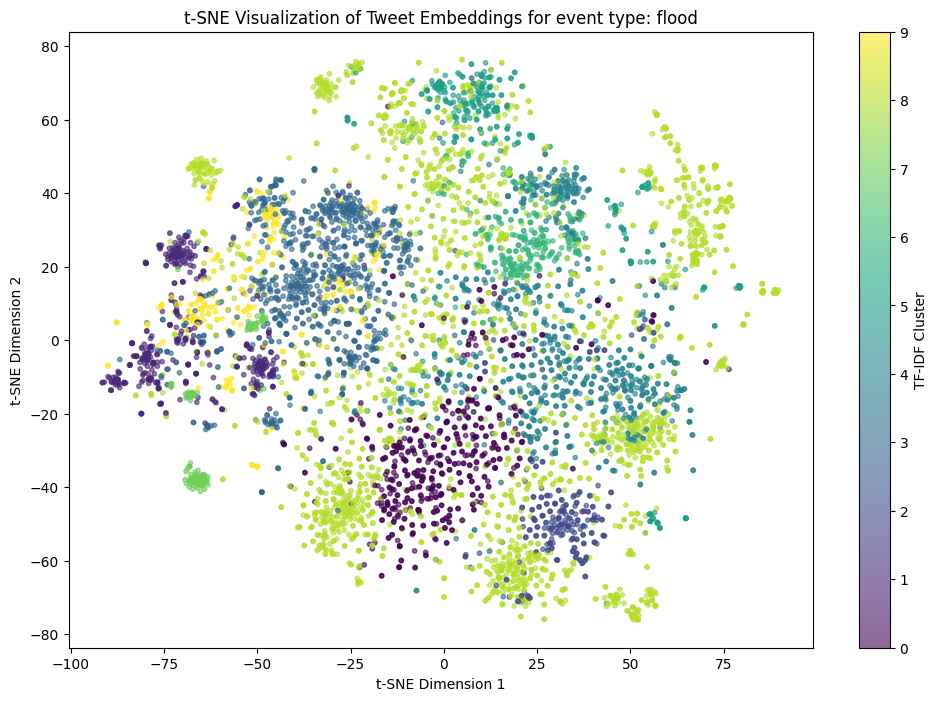


----------------------------------------------------------------------------
Plotting t-SNE for event type: shooting


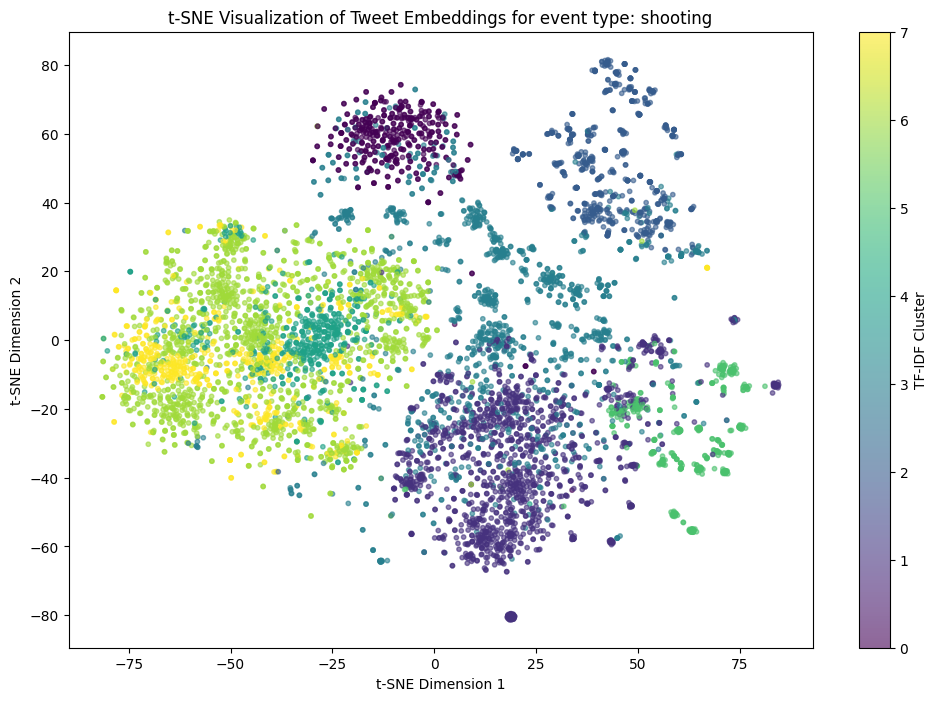


----------------------------------------------------------------------------
Plotting t-SNE for event type: typhoon


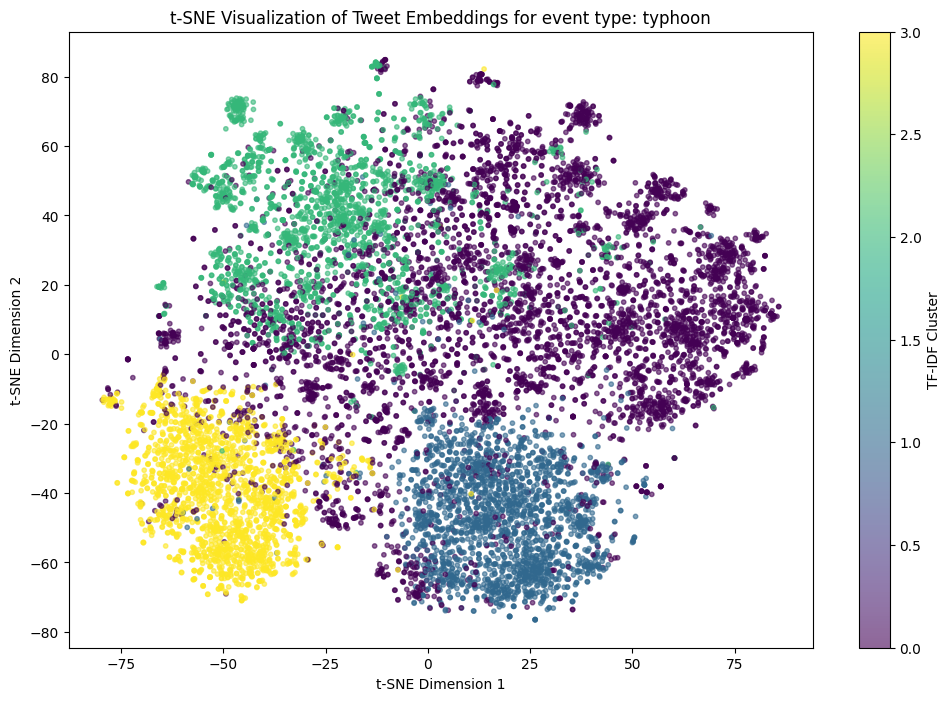


----------------------------------------------------------------------------
Plotting t-SNE for event type: wildfire


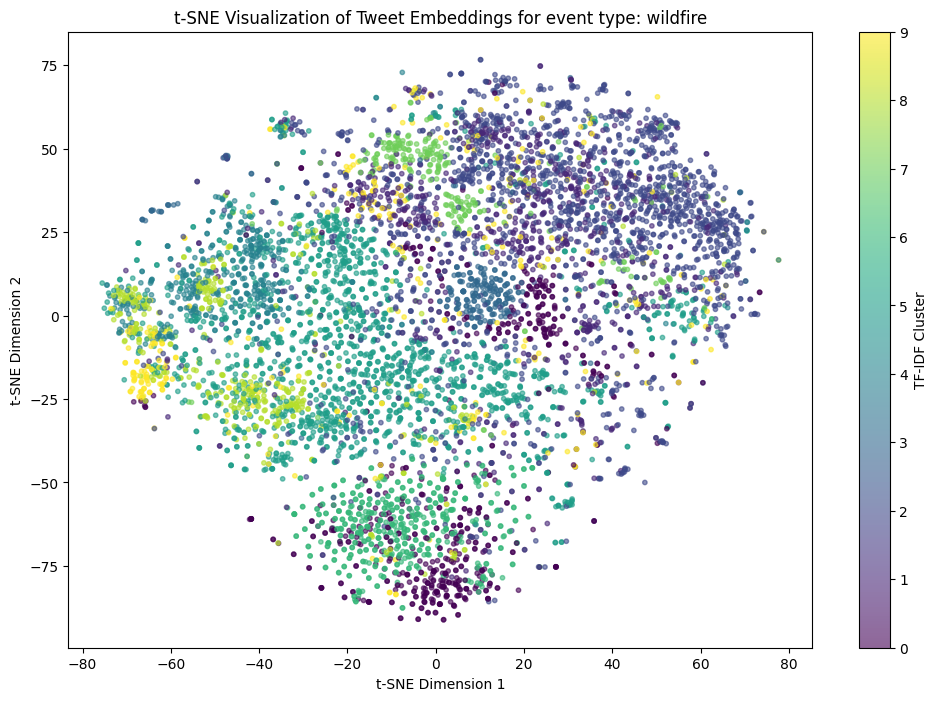


----------------------------------------------------------------------------


In [ ]:
tsne_tweet_embeddings_per_type(tweet_embeddings_by_event_type)

### Temporal Analysis of Retweets

Temporal analysis of retweets for event type: bombing


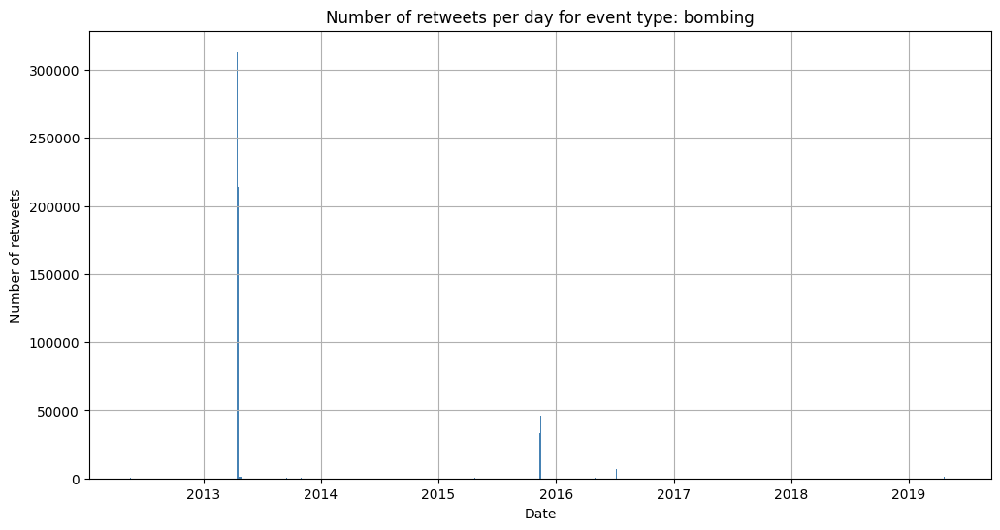


----------------------------------------------------------------------------


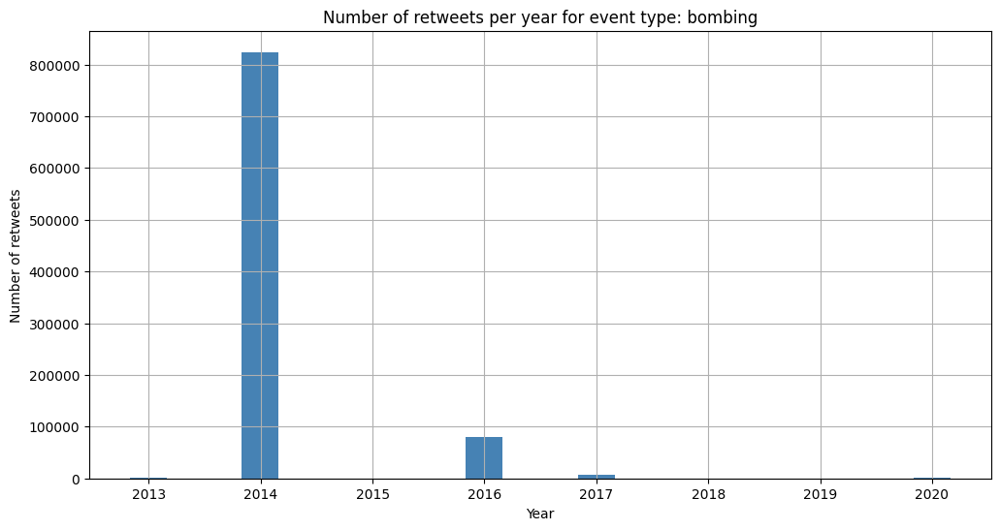


----------------------------------------------------------------------------
Temporal analysis of retweets for event type: earthquake


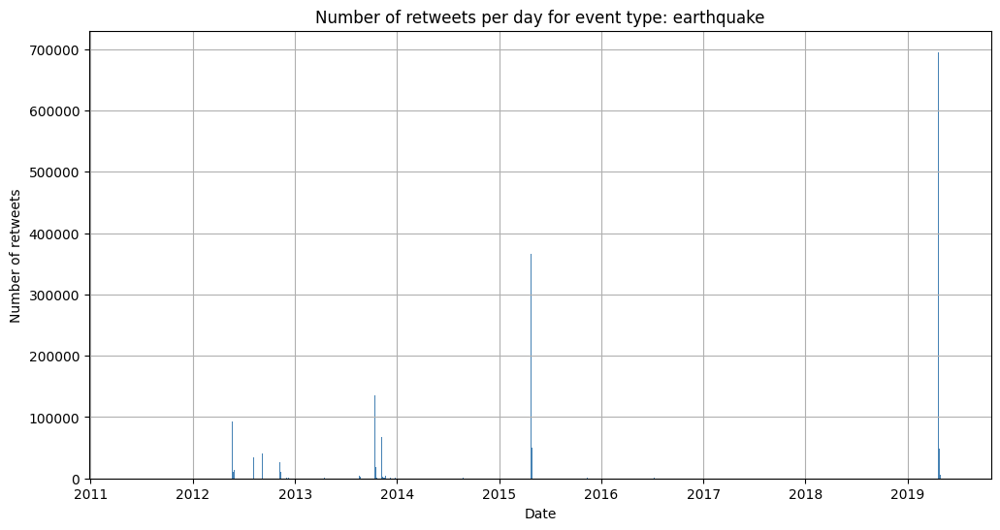


----------------------------------------------------------------------------


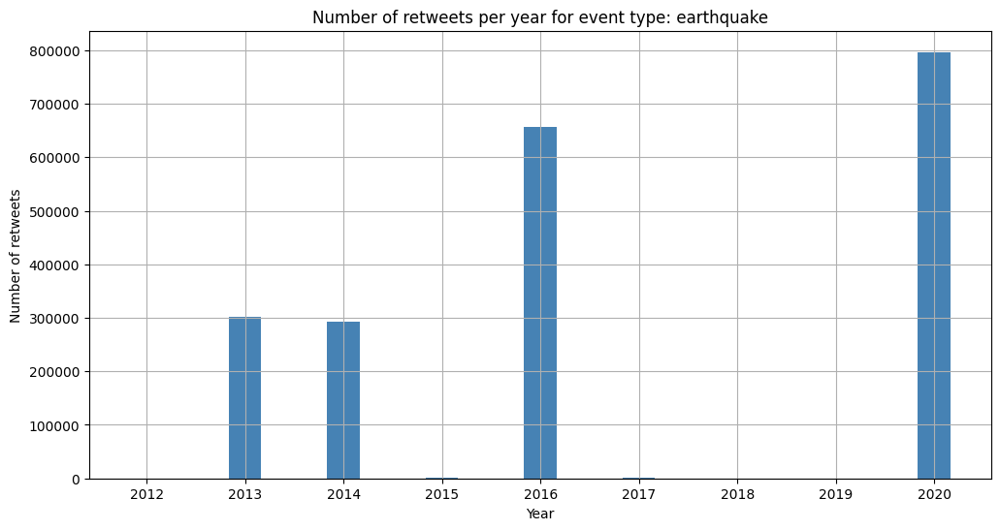


----------------------------------------------------------------------------
Temporal analysis of retweets for event type: flood


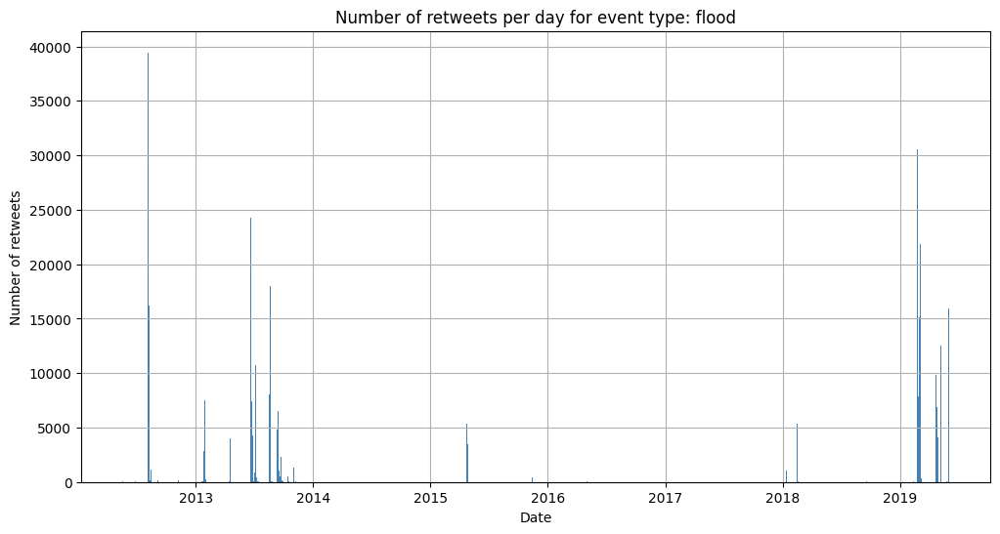


----------------------------------------------------------------------------


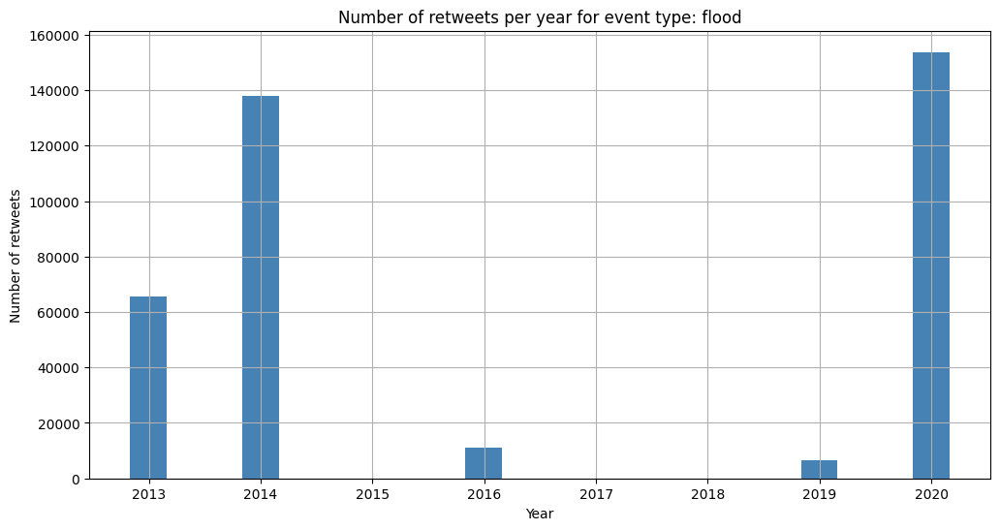


----------------------------------------------------------------------------
Temporal analysis of retweets for event type: shooting


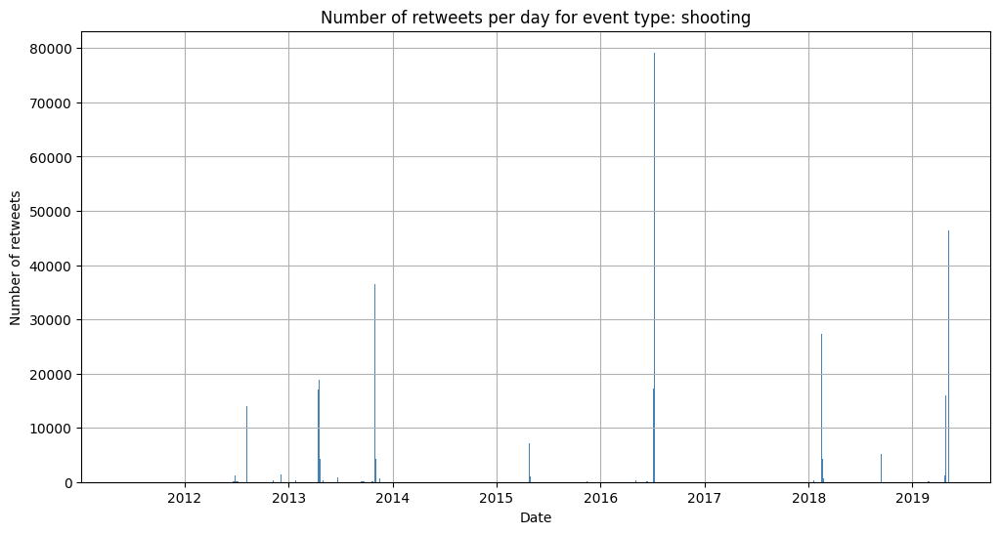


----------------------------------------------------------------------------


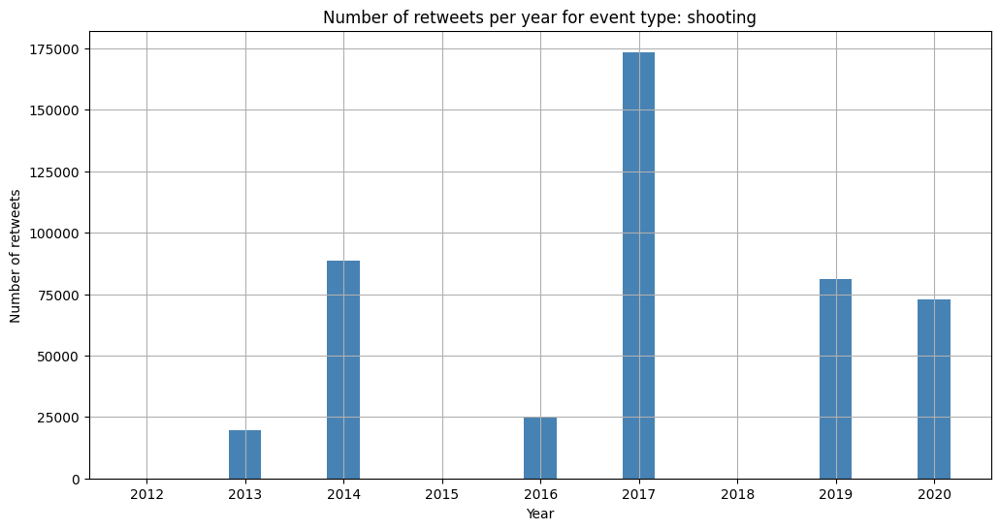


----------------------------------------------------------------------------
Temporal analysis of retweets for event type: typhoon


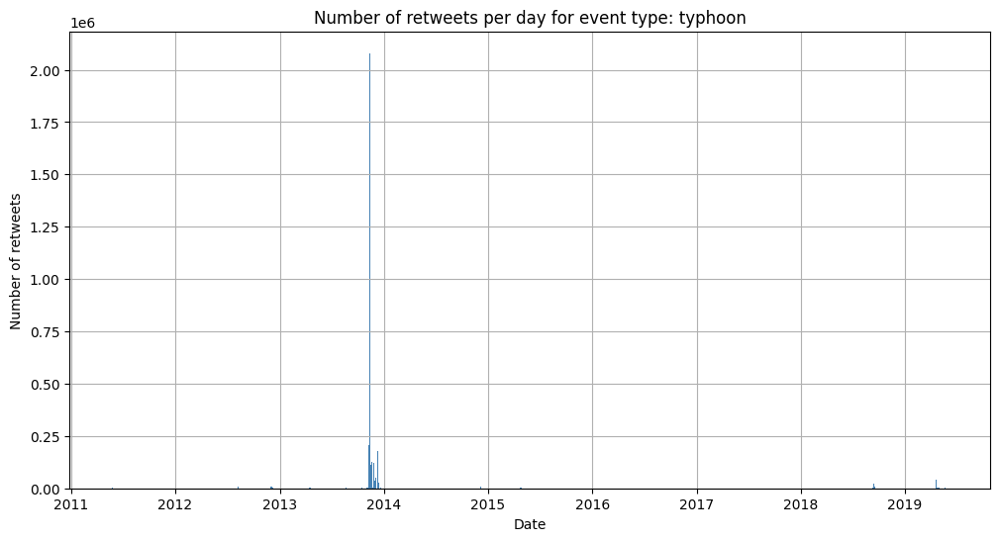


----------------------------------------------------------------------------


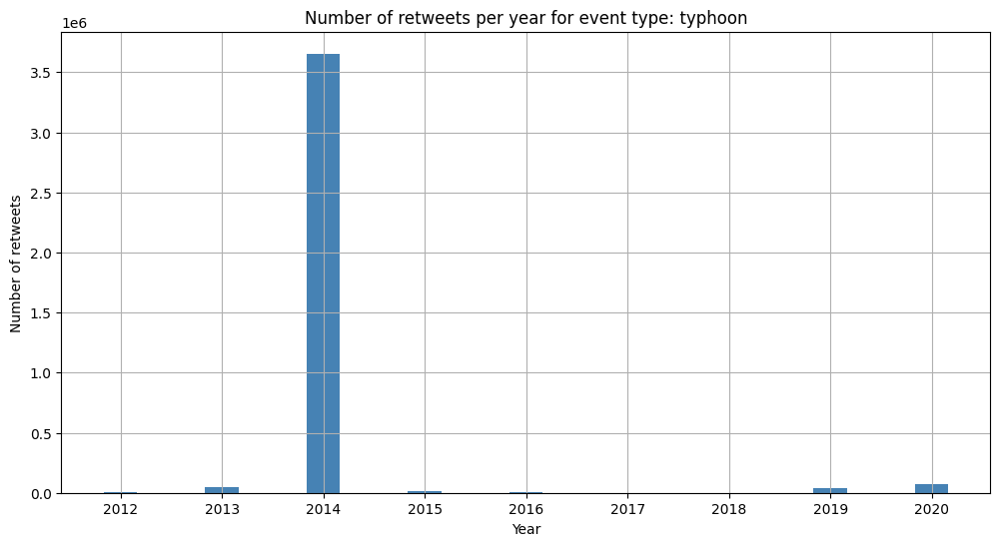


----------------------------------------------------------------------------
Temporal analysis of retweets for event type: wildfire


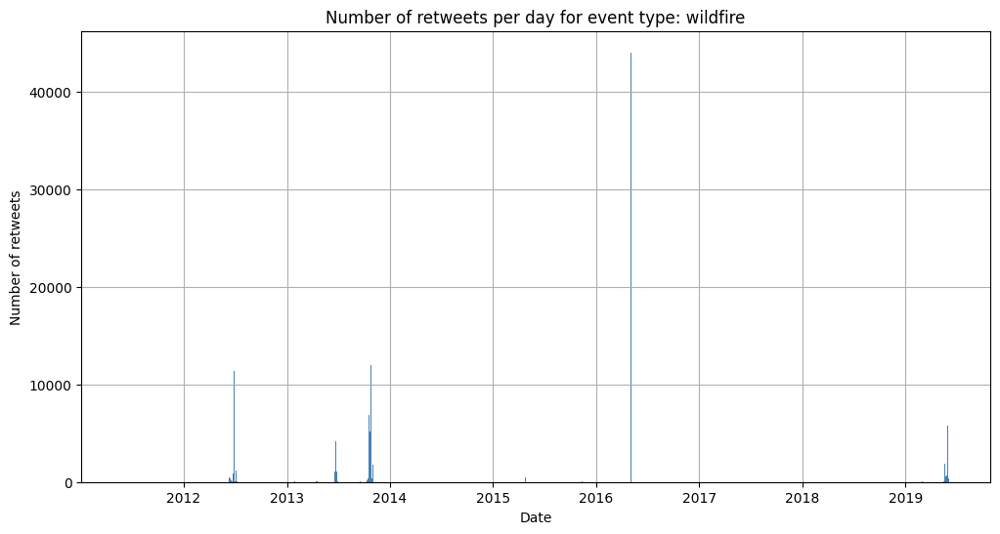


----------------------------------------------------------------------------


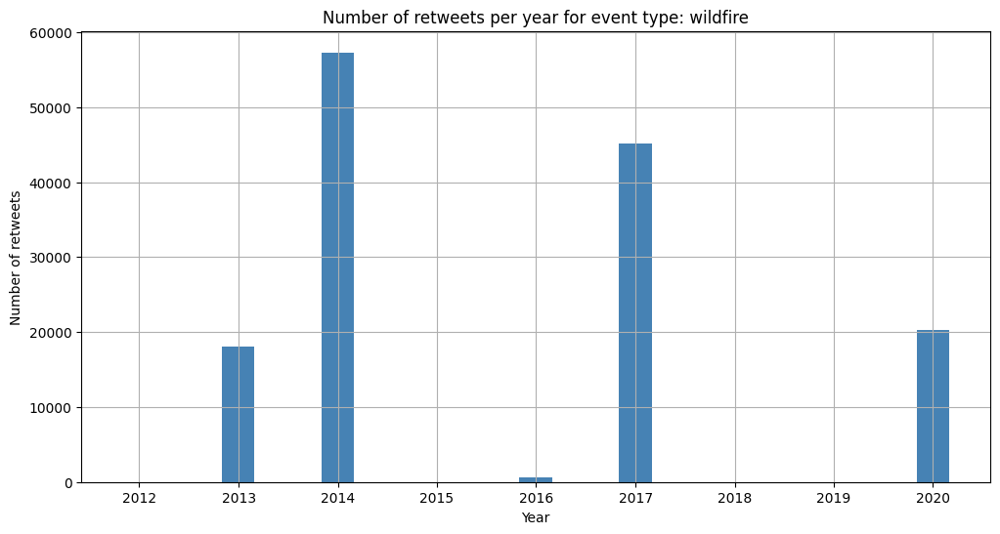


----------------------------------------------------------------------------


In [ ]:
for event_type, df_clean in cleaned_tweets_by_event_type.items():
    df_clean.head()
    print(f"Temporal analysis of retweets for event type: {event_type}")

    tweet_nodes = [node for node, data in G.nodes(data=True) if data.get("labels") == ":Tweet" and data.get("eventType") == event_type]
    created_dates = []
    retweet_counts = []

    for node in tweet_nodes:
        attrs = G.nodes[node]
        try:
            created = parser.parse(attrs.get('created_at'))
            created_dates.append(created)
        except:
            created_dates.append(None)
        retweet_counts.append(attrs.get("retweet_count", 0))

    df_clean = df_clean.copy()
    df_clean['created_at'] = pd.to_datetime(created_dates)
    df_clean['retweet_count'] = retweet_counts

    df_retweets = df_clean[['created_at', 'retweet_count']].dropna()
    df_retweets.set_index('created_at', inplace=True)
    retweet_by_day = df_retweets.resample('D').sum()

    plt.figure(figsize=(12, 6))
    plt.bar(retweet_by_day.index, retweet_by_day['retweet_count'], color='steelblue', width=3)
    plt.title(f'Number of retweets per day for event type: {event_type}')
    plt.xlabel('Date')
    plt.ylabel('Number of retweets')
    plt.grid(True)
    plt.show()
    print("\n----------------------------------------------------------------------------")

    retweet_by_year = df_retweets.resample('Y').sum()

    plt.figure(figsize=(12, 6))
    plt.bar(retweet_by_year.index, retweet_by_year['retweet_count'], color='steelblue', width=120)

    plt.title(f'Number of retweets per year for event type: {event_type}')
    plt.xlabel('Year')
    plt.ylabel('Number of retweets')
    plt.grid(True)
    plt.show()
    print("\n----------------------------------------------------------------------------")

### Sentiment Analysis (Bert)

In [ ]:
# Load pre-trained model and tokenizer from Hugging Face
tokenizer = AutoTokenizer.from_pretrained("distilbert-base-uncased-finetuned-sst-2-english")
model = AutoModelForSequenceClassification.from_pretrained("distilbert-base-uncased-finetuned-sst-2-english")

tokenizer_config.json:   0%|          | 0.00/48.0 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/629 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/268M [00:00<?, ?B/s]

In [ ]:
def determine_sentiment_transformers(sentence):
    inputs = tokenizer(sentence, return_tensors="pt", truncation=True, padding=True)
    with torch.no_grad():
        outputs = model(**inputs)
    scores = torch.nn.functional.softmax(outputs.logits, dim=1)
    label_id = torch.argmax(scores).item()
    label = "positive" if label_id == 1 else "negative"
    return label

Sentiment Analysis for event type: bombing


100%|██████████| 3709/3709 [05:00<00:00, 12.36it/s]


sentiment_label
negative    3352
positive     357
Name: count, dtype: int64

----------------------------------------------------------------------------


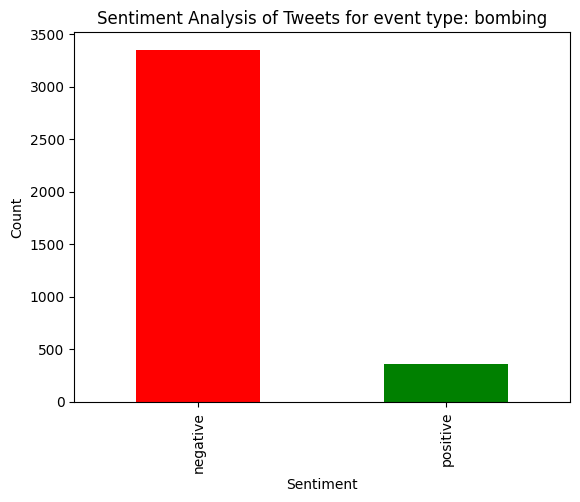


----------------------------------------------------------------------------
Sentiment Analysis for event type: earthquake


100%|██████████| 12461/12461 [17:20<00:00, 11.98it/s]


sentiment_label
negative    9990
positive    2471
Name: count, dtype: int64

----------------------------------------------------------------------------


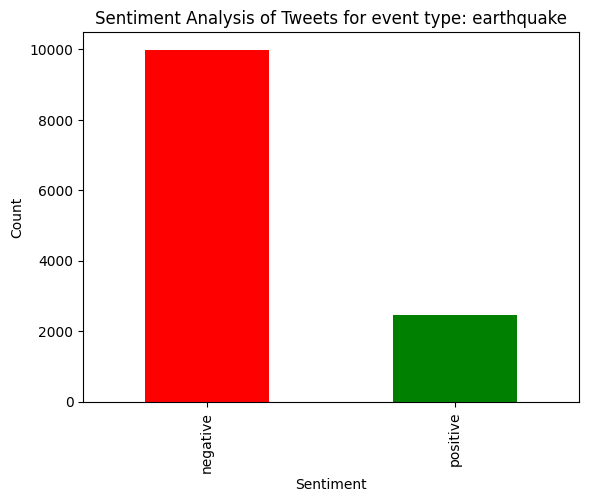


----------------------------------------------------------------------------
Sentiment Analysis for event type: flood


100%|██████████| 6533/6533 [09:46<00:00, 11.14it/s]


sentiment_label
negative    5771
positive     762
Name: count, dtype: int64

----------------------------------------------------------------------------


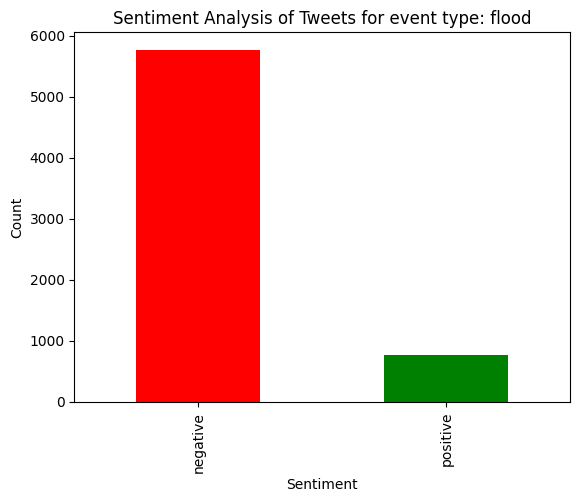


----------------------------------------------------------------------------
Sentiment Analysis for event type: shooting


100%|██████████| 7066/7066 [09:09<00:00, 12.87it/s]


sentiment_label
negative    6695
positive     371
Name: count, dtype: int64

----------------------------------------------------------------------------


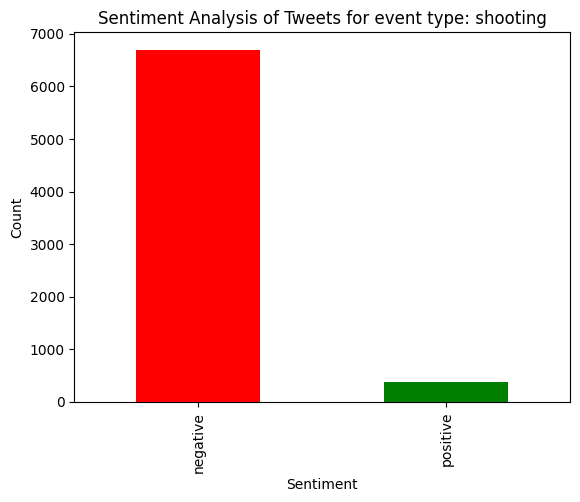


----------------------------------------------------------------------------
Sentiment Analysis for event type: typhoon


100%|██████████| 12274/12274 [18:19<00:00, 11.16it/s]


sentiment_label
negative    10228
positive     2046
Name: count, dtype: int64

----------------------------------------------------------------------------


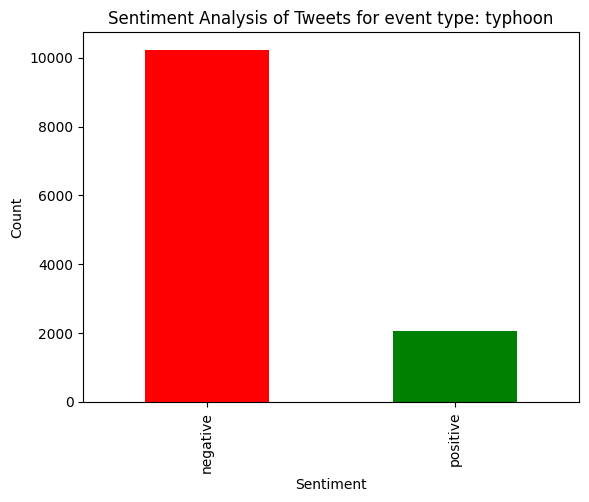


----------------------------------------------------------------------------
Sentiment Analysis for event type: wildfire


100%|██████████| 7040/7040 [10:55<00:00, 10.74it/s]


sentiment_label
negative    5812
positive    1228
Name: count, dtype: int64

----------------------------------------------------------------------------


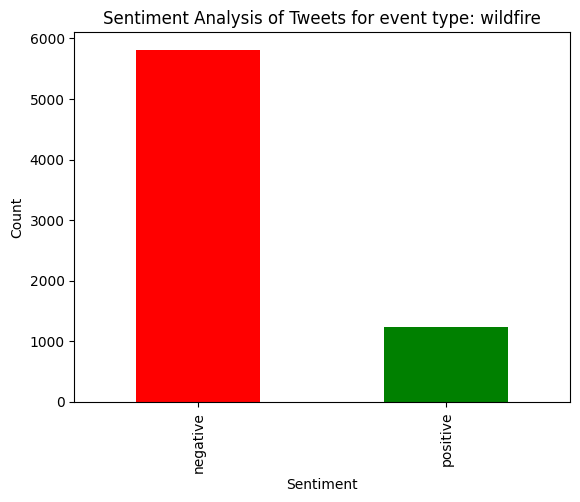


----------------------------------------------------------------------------


In [ ]:
model.eval()
tqdm.pandas()

for event_type, df_clean in cleaned_tweets_by_event_type.items():
    print(f"Sentiment Analysis for event type: {event_type}")
    df = df_clean.copy()
    df['sentiment_label'] = df['text'].progress_apply(determine_sentiment_transformers)
    cleaned_tweets_by_event_type[event_type] = df
    sentiment_counts = df['sentiment_label'].value_counts()
    print(sentiment_counts)
    print("\n----------------------------------------------------------------------------")
    sentiment_counts.plot(kind='bar', color=['red', 'green'])
    plt.title(f'Sentiment Analysis of Tweets for event type: {event_type}')
    plt.xlabel('Sentiment')
    plt.ylabel('Count')
    plt.show()
    print("\n----------------------------------------------------------------------------")

### Analysis of Most Active Users

Top active users for event type: bombing


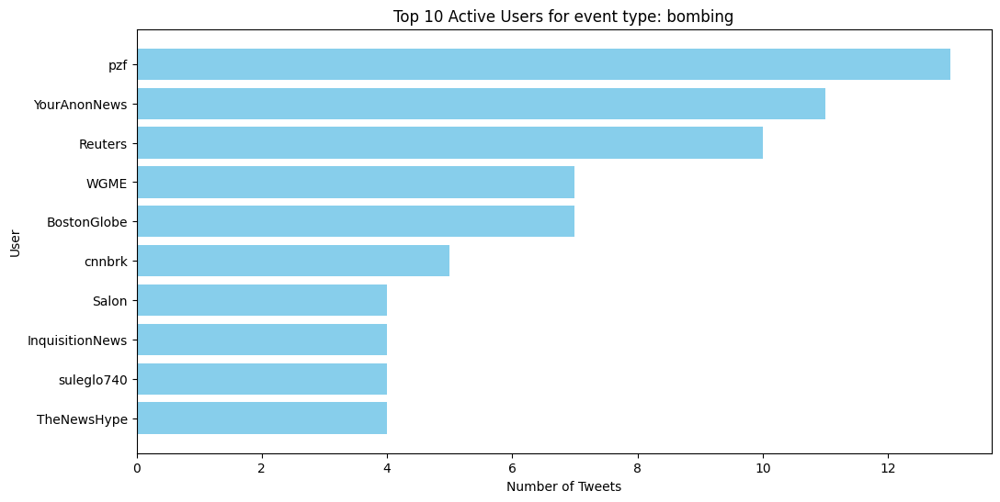


----------------------------------------------------------------------------
Top active users for event type: earthquake


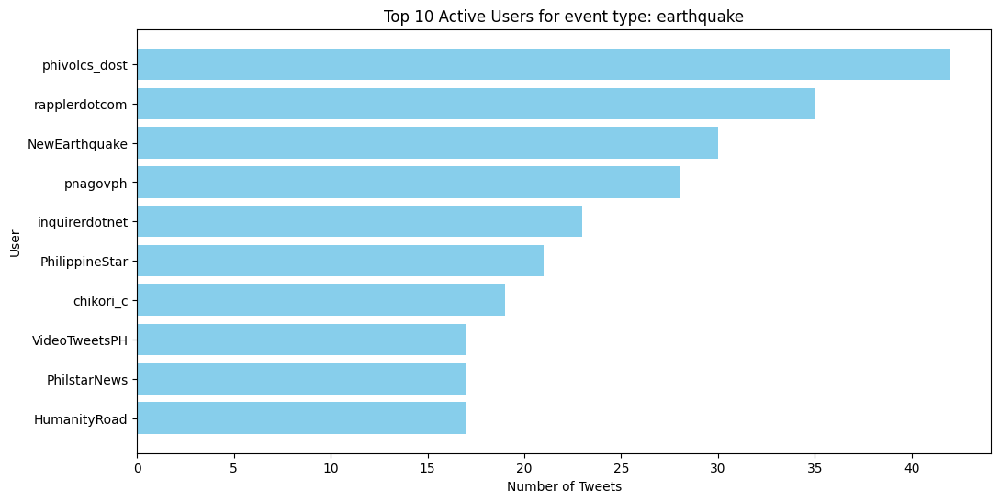


----------------------------------------------------------------------------
Top active users for event type: flood


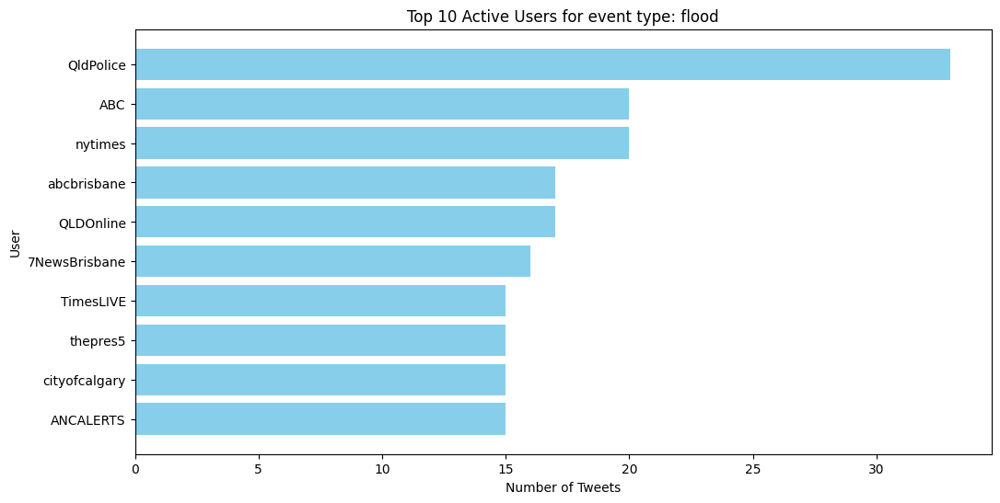


----------------------------------------------------------------------------
Top active users for event type: shooting


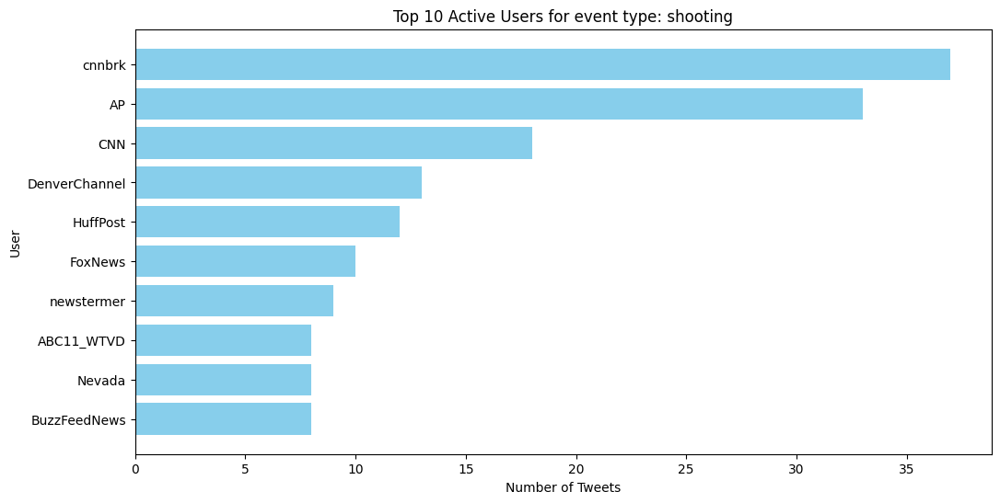


----------------------------------------------------------------------------
Top active users for event type: typhoon


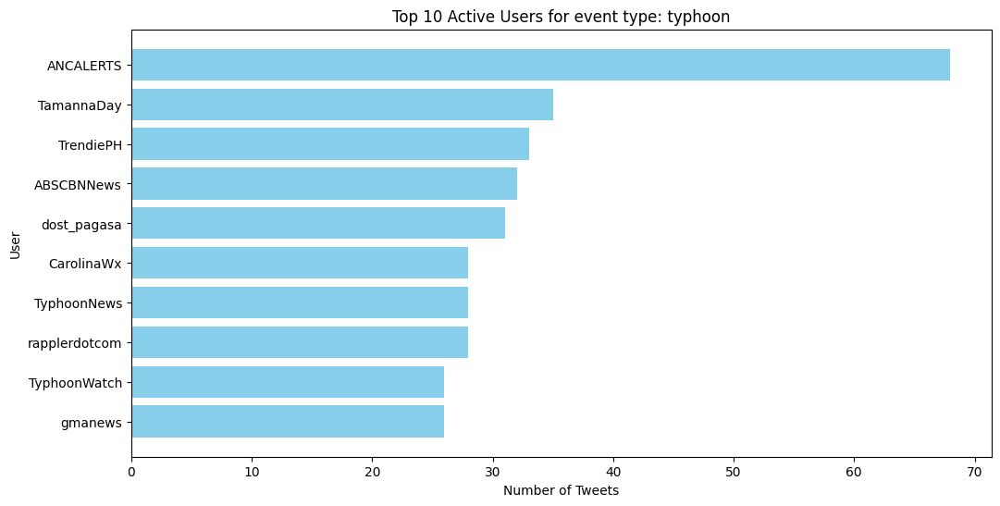


----------------------------------------------------------------------------
Top active users for event type: wildfire


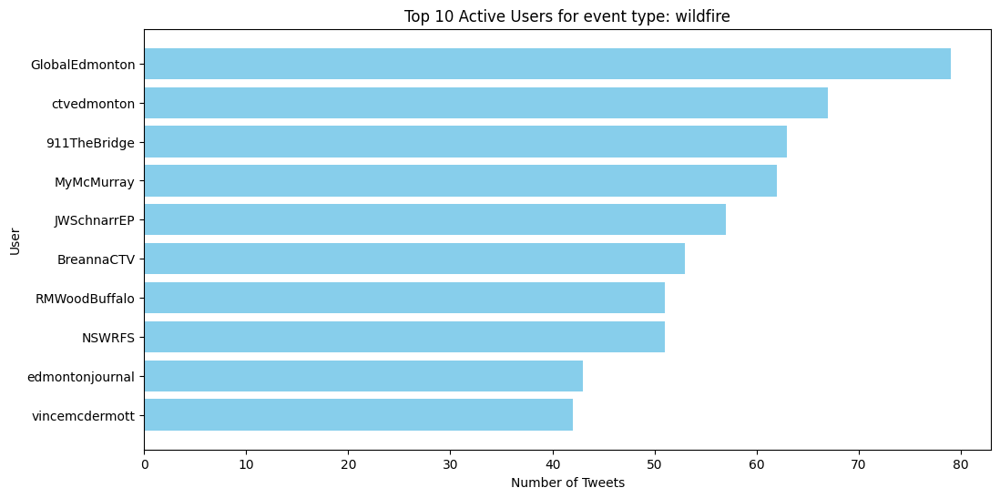


----------------------------------------------------------------------------


In [ ]:
for event_type in sorted(set(nx.get_node_attributes(G, 'eventType').values())):
    print(f"Top active users for event type: {event_type}")
    tweet_nodes = [node for node, data in G.nodes(data=True) if data.get("labels") == ":Tweet" and data.get("eventType") == event_type]
    tweet_user_pairs = [(v,u) for u,v,d in G.edges(data=True) if d.get("label") == "POSTED" and v in tweet_nodes]

    user_ids = [user_node for _, user_node in tweet_user_pairs]
    user_counts = Counter(user_ids)

    top_users = user_counts.most_common(10)

    top_user_data = []

    for user, count in top_users:
        data = G.nodes[user]
        top_user_data.append({
            "user_id": user,
            "screen_name": data.get("screen_name", "unknown"),
            "followers": int(data.get("followers_count", 0)),
            "verified": data.get("isVerified", False),
            "tweets_count": count
        })

    df_top_users = pd.DataFrame(top_user_data)
    df_top_users_sorted = df_top_users.sort_values("tweets_count", ascending=True)

    plt.figure(figsize=(12, 6))
    plt.barh(df_top_users_sorted["screen_name"], df_top_users_sorted["tweets_count"], color='skyblue')
    plt.xlabel('Number of Tweets')
    plt.ylabel('User')
    plt.title(f'Top 10 Active Users for event type: {event_type}')
    plt.show()
    print("\n----------------------------------------------------------------------------")

### Analyse of Hashtags popularity

Top hashtags for event type: bombing


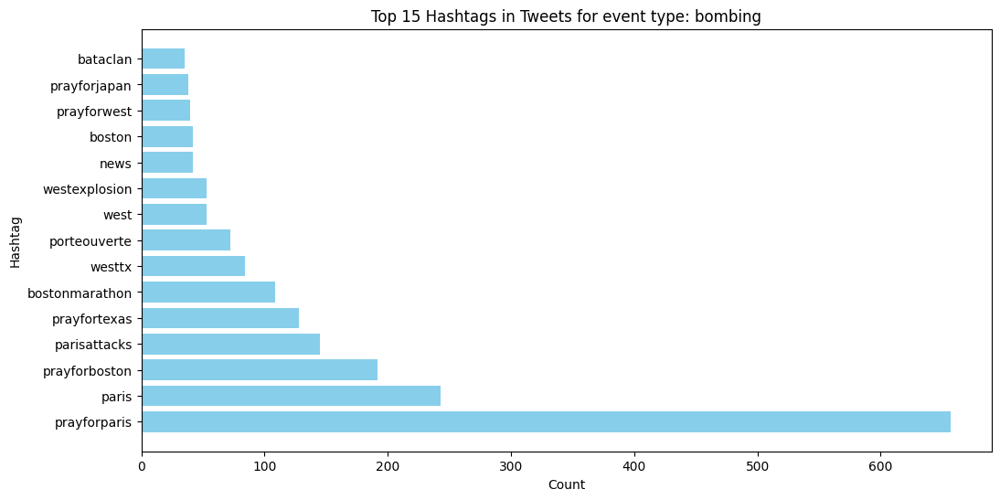


----------------------------------------------------------------------------
Top hashtags for event type: earthquake


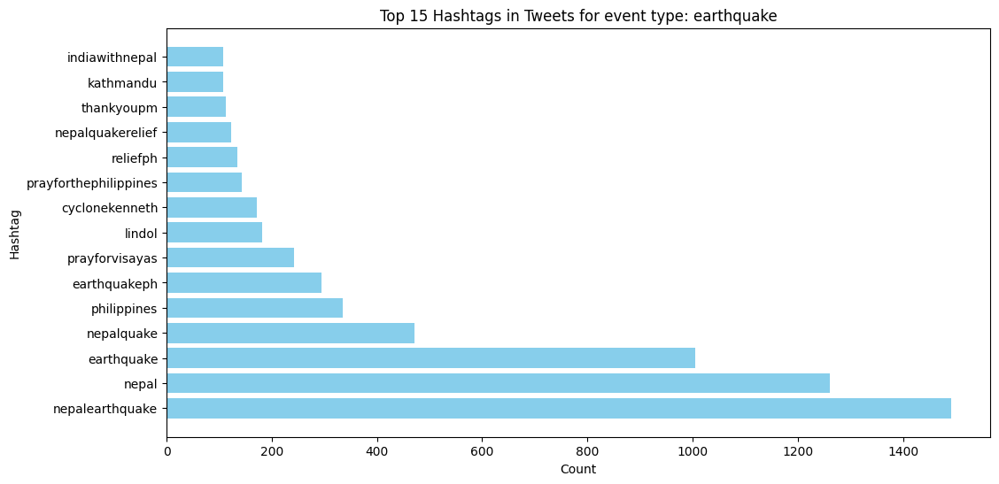


----------------------------------------------------------------------------
Top hashtags for event type: flood


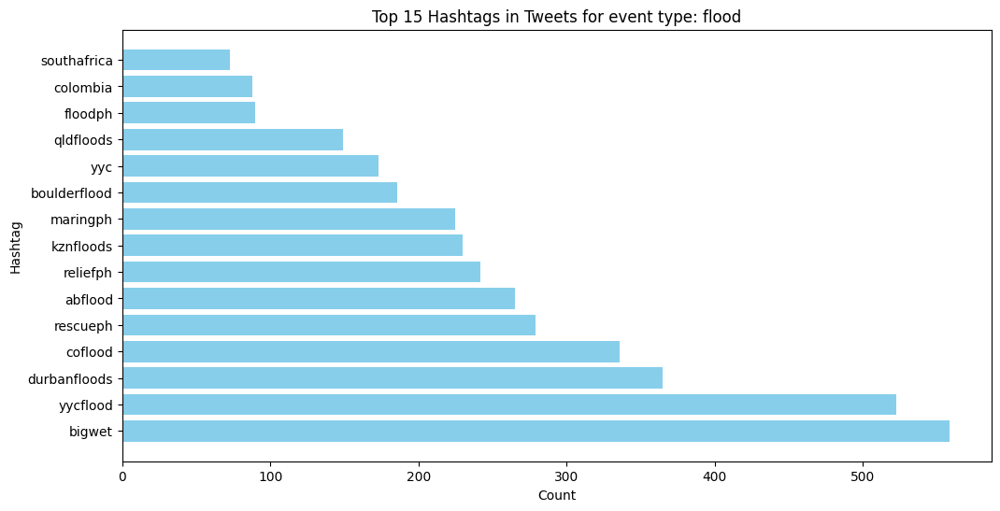


----------------------------------------------------------------------------
Top hashtags for event type: shooting


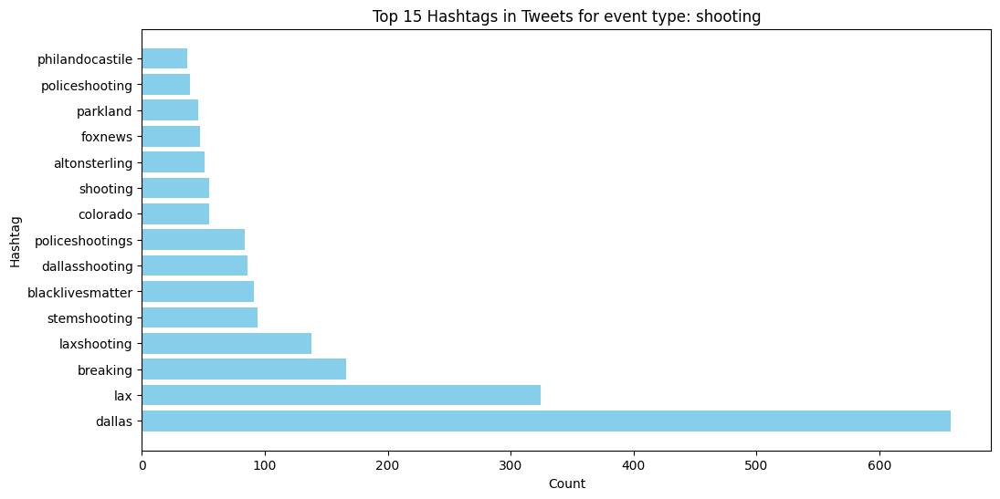


----------------------------------------------------------------------------
Top hashtags for event type: typhoon


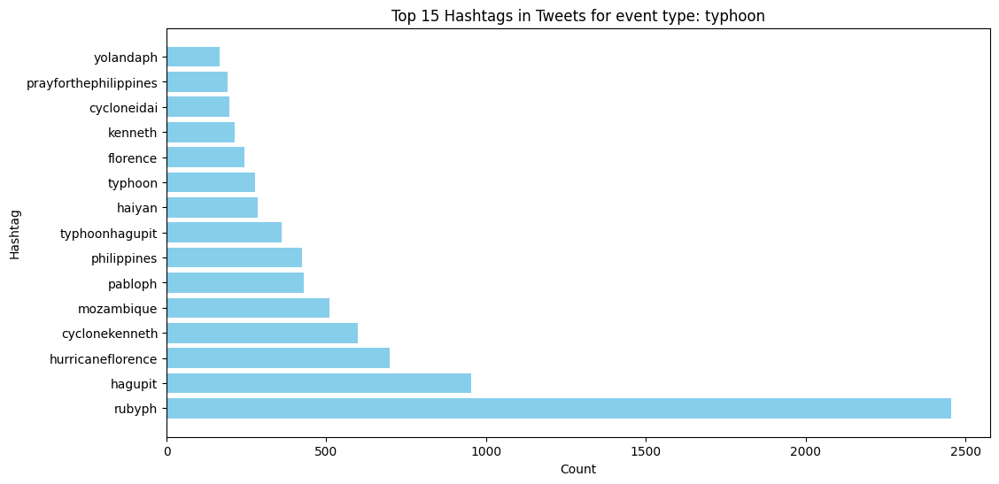


----------------------------------------------------------------------------
Top hashtags for event type: wildfire


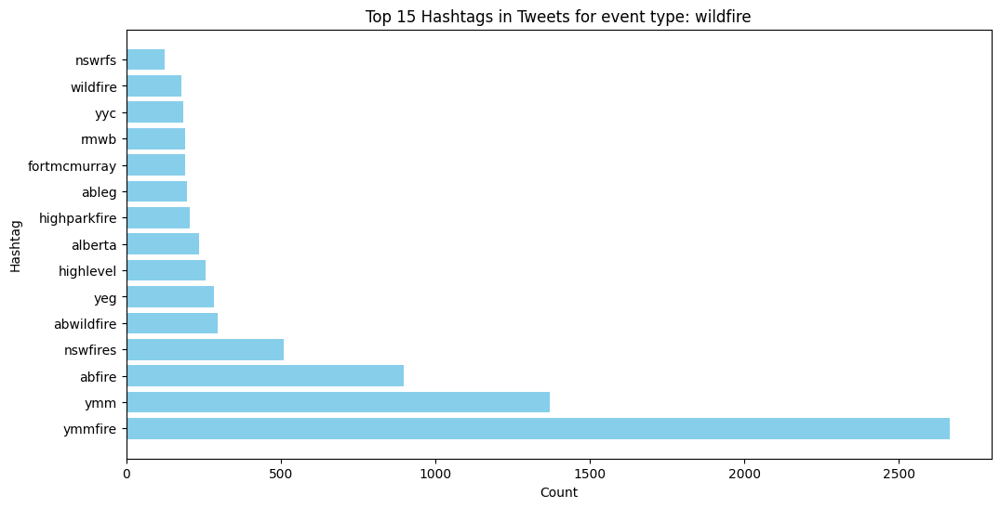


----------------------------------------------------------------------------


In [ ]:
for event_type in sorted(set(nx.get_node_attributes(G, 'eventType').values())):
    print(f"Top hashtags for event type: {event_type}")
    tweet_nodes = [node for node, data in G.nodes(data=True) if data.get("labels") == ":Tweet" and data.get("eventType") == event_type]
    matched_hashtags = [(u, v, G.nodes[v].get("id")) for u, v, d in G.edges(data=True) if d.get("label") == "HAS_HASHTAG" and u in tweet_nodes]
    hashtags_only = [h[2].lower() for h in matched_hashtags if h[2]]
    top_hashtags = Counter(hashtags_only).most_common(15)
    tags, counts = zip(*top_hashtags)
    plt.figure(figsize=(12, 6))
    plt.barh(tags, counts, color='skyblue')
    plt.xlabel('Count')
    plt.ylabel('Hashtag')
    plt.title(f'Top 15 Hashtags in Tweets for event type: {event_type}')
    plt.show()
    print("\n----------------------------------------------------------------------------")

## II - Implementation of an IR or QA system

### Tweet Search Using TF-IDF

In [ ]:
tweet_texts = []

for node in all_tweet_nodes:
    attrs = G.nodes[node]
    text = attrs.get("text")
    if "text" and len(text) > 0:
        tweet_texts.append(text)

print(f"Number of flood tweets text: {len(tweet_texts)}")

Number of flood tweets text: 49083


In [ ]:
df_all_tweets = pd.DataFrame(tweet_texts, columns=['text'])
df_all_clean_tweets = text_cleaning(df_all_tweets, 'text', use_stem=False, verbose=True)

Cleaning text...
Text cleaned


In [ ]:
vectorizer = TfidfVectorizer()
tfidf_matrix = vectorizer.fit_transform(df_all_clean_tweets['text'])

def search_tweets(query, top_k=5):
    query_vec = vectorizer.transform([query])
    scores = cosine_similarity(query_vec, tfidf_matrix).flatten()
    top_indices = scores.argsort()[::-1][:top_k]
    results = df_all_clean_tweets.iloc[top_indices][['text']]
    results['score'] = scores[top_indices]
    return results

queries = [
    "Where did gun shootings happen?",
    "Which areas were affected by emergency flood rescue?",
    "Which city had a bombing attack?",
    "Where did an earthquake rescue operation take place?",
    "Where was a fire emergency declared?",
    "Where was the latest typhoon emergency?"
]

for query in queries:
    results = search_tweets(query)
    print(f"Results for the query: {query}")
    display(results)

Results for the query: Where did gun shootings happen?


,text,score
28501,breitbartnews police shooting happen dallas be...,0.455363
9372,prayforthephilippines always happen people,0.436357
27882,protest dallas shooting happen dallas,0.416480
20878,remembering lost life florida school shooting ...,0.412201
39552,child shot gun school,0.389608


Results for the query: Which areas were affected by emergency flood rescue?


,text,score
12270,flood flood flood rubyph,0.380678
40949,sea rescue kzn flood nsri assist emergency ser...,0.370468
4428,declaration state emergency nswbushfires barry...,0.341454
6017,australia dramatic rescue amidst storm floodin...,0.329827
41789,president cyril ramaphosa commended rescue ser...,0.308718


Results for the query: Which city had a bombing attack?


,text,score
4857,bombing boston,0.500341
23166,prayfor n nbaghdad funeral bombing nlebanon bo...,0.411556
5315,bombing suspect boston plan attack http co uij...,0.376337
21646,prayfor myhonee baghdad funeral bombing lebano...,0.364877
48278,breaking prosecutor office 8 extremist dead pa...,0.329241


Results for the query: Where did an earthquake rescue operation take place?


,text,score
15511,rescue operation going nepal different place,0.458129
18403,heart nepal someone organization take village ...,0.340203
17140,sardesairajdeep hurt u nepalquake thankyoupm 4...,0.283057
39117,search rescue operation halted another earthqu...,0.256121
24610,philippine earthquake death toll hit 110 rescu...,0.251597


Results for the query: Where was a fire emergency declared?


,text,score
4439,see state emergency declared nsw bush fire hop...,0.548019
22412,paris attack state emergency declared http co ...,0.483714
4446,australia declares fire emergency state emerge...,0.465261
46898,56 fire scorch eastern australia state emergen...,0.440060
46880,official least 57 bush fire rage australia sta...,0.430707


Results for the query: Where was the latest typhoon emergency?


,text,score
7675,prayer hope everyone philippine latest typhoon...,0.433577
8242,gmanewsonline good morning philippine latest t...,0.343219
8409,typhoon philippine,0.332341
13465,latest global emergency overview highlight typ...,0.330845
8660,typhoon hagupit slam eastern philippine http c...,0.325613


### Question Answering with Transformers

In [ ]:
qa_pipeline = pipeline("question-answering", model="distilbert-base-cased-distilled-squad")

def bert_qa_on_top_tweets(question, top_k=5):
    # TF-IDF search to reduce the corpus
    query_vec = vectorizer.transform([question])
    scores = cosine_similarity(query_vec, tfidf_matrix).flatten()
    top_indices = scores.argsort()[::-1][:top_k]
    results = df_all_clean_tweets.iloc[top_indices]['text'].tolist()
    # Apply QA on the selected tweets
    answers = []
    for i, context in enumerate(results):
        try:
            result = qa_pipeline({'question': question, 'context': context})
            answers.append((result['answer'], result['score'], context))
        except:
            continue
    answers = sorted(answers, key=lambda x: x[1], reverse=True)
    return answers

Device set to use cpu


In [ ]:
queries = [
    "Where did gun shootings happen?",
    "Which areas were affected by emergency flood rescue?",
    "Which city had a bombing attack?",
    "Where did an earthquake rescue operation take place?",
    "Where was a fire emergency declared?",
    "Where was the latest typhoon emergency?"
]

for query in queries:
    answers = bert_qa_on_top_tweets(query, top_k=10)
    print(f"Results for the query: {query}")
    for i, (answer, score, ctx) in enumerate(answers[:3]):
        print(f"Answer {i+1}: {answer}")
        print(f"Context: {ctx}")
        print(f"Score: {score}")
        print("----------------------------------------------------------------------------")

Results for the query: Where did gun shootings happen?
Answer 1: ghetto
Context: school shooting happen ghetto
Score: 0.9931632876396179
----------------------------------------------------------------------------
Answer 2: prayforthephilippines
Context: prayforthephilippines always happen people
Score: 0.9787241816520691
----------------------------------------------------------------------------
Answer 3: child shot gun school
Context: child shot gun school
Score: 0.9190354943275452
----------------------------------------------------------------------------
Results for the query: Which areas were affected by emergency flood rescue?
Answer 1: durban
Context: thinking affected flood durban lt 3
Score: 0.9000304341316223
----------------------------------------------------------------------------
Answer 2: sabcnews
Context: president cyril ramaphosa commended rescue service kwazulu natal help affected flood province sabcnews
Score: 0.8439332842826843
-----------------------------------

## III - Tweet priority prediction

### Feature Engineering

In [ ]:
drive.mount('/content/drive')
filepath = "/content/drive/MyDrive/Web Mining - Project/database/Everything/database_formated_for_NetworkX.graphml"
G = nx.read_graphml(filepath)

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
propagate_eventType(G)

Number of tweets with eventType: 49083


In [ ]:
priority_tweets = []

for node, data in G.nodes(data=True):
    if data.get("labels") == ":Tweet":
        label = data.get("annotation_postPriority")
        if label in ["Low", "Medium", "High", "Critical"]:
            text = data.get("text")
            created_at = data.get("created_at")
            priority_tweets.append({
                "tweet_id": node,
                "text": text,
                "priority": label,
                "created_at": created_at
            })

df_priority = pd.DataFrame(priority_tweets)
print(df_priority['priority'].value_counts())

priority
Low         25407
Medium       6629
High         4155
Critical      472
Name: count, dtype: int64


In [ ]:
df_priority['priority'] = df_priority['priority'].replace({'Critical': 'High'})
print(df_priority['priority'].value_counts())

priority
Low       25407
Medium     6629
High       4627
Name: count, dtype: int64


In [ ]:
df_priority_clean = text_cleaning(df_priority.copy(), "text", use_stem=False, verbose=True)

Cleaning text...
Text cleaned


In [ ]:
# Label Encoding
le = LabelEncoder()
df_priority_clean['priority_encoded'] = le.fit_transform(df_priority_clean['priority'])

print(dict(zip(le.classes_, le.transform(le.classes_))))

{'High': 0, 'Low': 1, 'Medium': 2}


In [ ]:
# Content-based features
def get_sentiment_score_bert(text):
    inputs = tokenizer(text, return_tensors="pt", truncation=True, padding=True)
    with torch.no_grad():
        outputs = model(**inputs)
    scores = torch.nn.functional.softmax(outputs.logits, dim=1)
    # Sentiment score in [-1, 1], based on difference between positive and negative probabilities
    return float(scores[0][1] - scores[0][0])

In [ ]:
tokenizer = AutoTokenizer.from_pretrained("distilbert-base-uncased-finetuned-sst-2-english")
model = AutoModelForSequenceClassification.from_pretrained("distilbert-base-uncased-finetuned-sst-2-english")

tqdm.pandas()
df_priority_clean['sentiment_score'] = df_priority_clean['text'].progress_apply(get_sentiment_score_bert)

In [ ]:
df_priority_clean["created_at"] = pd.to_datetime(df_priority_clean["created_at"], errors="coerce")
df_priority_clean["date_only"] = df_priority_clean["created_at"].dt.date

In [ ]:
df_priority_clean["eventType"] = df_priority_clean["tweet_id"].apply(lambda tid: G.nodes[tid].get("eventType"))

In [ ]:
group_counts = (
    df_priority_clean
    .groupby(["eventType", "date_only"])
    .size()
    .reset_index(name="daily_eventType_count")
)

df_priority_clean = df_priority_clean.merge(group_counts, on=["eventType", "date_only"], how="left")

In [ ]:
def get_subjectivity(text):
    try:
        return TextBlob(text).subjectivity
    except:
        return 0.0

df_priority_clean['subjectivity'] = df_priority_clean['text'].apply(get_subjectivity)

In [ ]:
df_priority_clean['subjectivity'].head()

In [ ]:
def get_avg_hashtag_popularity(tweet_node):
    popularity_list = []

    for neighbor in G.neighbors(tweet_node):
        edge_data = G.get_edge_data(tweet_node, neighbor)

        if edge_data and edge_data.get("label") == "HAS_HASHTAG":
            hashtag_node = G.nodes[neighbor]
            if hashtag_node.get("labels") == ":Hashtag":
                count = hashtag_node.get("occurences") or hashtag_node.get("popularity") or 0
                try:
                    popularity_list.append(int(count))
                except:
                    continue

    return sum(popularity_list) / len(popularity_list) if popularity_list else 0.0

In [ ]:
def extract_tweet_features(tweet_node):
    node = G.nodes[tweet_node]
    text = node.get("text", "")

    features = {}

    features["word_count"] = len(text.split())
    features["hashtag_count"] = len(re.findall(r"#\w+", text))
    features["contains_emoji"] = bool(re.search(r"[^\w\s,]", text))  # emoji/symbol

    features["sentiment_score"] = df_priority_clean.loc[df_priority_clean['tweet_id'] == tweet_node, 'sentiment_score'].values[0]

    features["retweet_count"] = int(node.get("retweet_count", 0))
    features["favorite_count"] = int(node.get("favorite_count", 0))

    features["possibly_sensitive"] = 1 if node.get("possibly_sensitive") is True else 0
    features["is_quote_status"] = 1 if node.get("is_quote_status") is True else 0

    features["subjectivity"] = df_priority_clean.loc[df_priority_clean['tweet_id'] == tweet_node, 'subjectivity'].values[0]
    #features["avg_hashtag_popularity"] = get_avg_hashtag_popularity(tweet_node)

    features["daily_eventType_count"] = df_priority_clean.loc[df_priority_clean['tweet_id'] == tweet_node, 'daily_eventType_count'].values[0]

    return features

In [ ]:
tweet_features = []

for row in tqdm(df_priority_clean.itertuples(), total=len(df_priority_clean)):
    features = extract_tweet_features(row.tweet_id)
    features["tweet_id"] = row.tweet_id
    features["priority"] = row.priority
    features["priority_encoded"] = row.priority_encoded
    tweet_features.append(features)

df_features = pd.DataFrame(tweet_features).set_index("tweet_id")

In [ ]:
df_features.head()
#print(df_features.describe())

In [ ]:
# User-based features
tweet_to_user = {}
# tweet_id → user_id
for u, v, d in G.edges(data=True):
    if d.get("label") == "POSTED":
        if G.nodes[v].get("labels") == ":Tweet":
            tweet_to_user[v] = u  # v = tweet, u = user

In [ ]:
def add_user_features(df):
    user_features = []

    for tweet_id in df.index:
        user_id = tweet_to_user.get(tweet_id, None)
        if user_id and G.nodes[user_id].get("labels") == ":User":
            user_node = G.nodes[user_id]
            user_features.append({
                "followers_count": int(user_node.get("followers_count", 0)),
                "verified": 1 if user_node.get("isVerified") is True else 0,
                "user_statuses_count": int(user_node.get("statuses_count", 0)),
                "listed_count": int(user_node.get("listed_count", 0)),
                "friends_count": int(user_node.get("friends_count", 0))
            })
        else:
            user_features.append({
                "followers_count": 0,
                "verified": 0,
                "user_statuses_count": 0,
                "listed_count": 0,
                "friends_count": 0
            })

    df_user = pd.DataFrame(user_features, index=df.index)
    return pd.concat([df, df_user], axis=1)

In [ ]:
df_features = add_user_features(df_features)

In [ ]:
df_features[['followers_count', 'verified', 'user_statuses_count', 'listed_count', 'friends_count']].head()

In [ ]:
(df_features['verified'] == 1).value_counts()

In [ ]:
# Tweet embdding
model_st = SentenceTransformer('all-MiniLM-L6-v2')

tweet_embeddings = model_st.encode(
    df_priority_clean['text'].tolist(),
    show_progress_bar=True
)

df_embed = pd.DataFrame(tweet_embeddings, index=df_priority_clean['tweet_id'])
df_embed.columns = [f"embed_{i}" for i in range(df_embed.shape[1])]

In [ ]:
df_features_full = pd.concat([df_features, df_embed], axis=1)

In [ ]:
df_features_full.head()

In [ ]:
# User Embedding
user_embeddings_map = defaultdict(list)

for tweet_id, embedding in zip(df_embed.index, df_embed.values):
    user_id = tweet_to_user.get(tweet_id)
    if user_id:
        user_embeddings_map[user_id].append(embedding)

In [ ]:
user_embedding_final = {}

for user_id, vectors in user_embeddings_map.items():
    user_embedding_final[user_id] = np.mean(vectors, axis=0)

In [ ]:
user_embed_for_tweet = []

for tweet_id in df_embed.index:
    user_id = tweet_to_user.get(tweet_id)
    if user_id in user_embedding_final:
        user_vec = user_embedding_final[user_id]
    else:
        user_vec = np.zeros(384)
    user_embed_for_tweet.append(user_vec)

df_user_embed = pd.DataFrame(user_embed_for_tweet, index=df_embed.index)
df_user_embed.columns = [f"user_embed_{i}" for i in range(df_user_embed.shape[1])]

In [ ]:
df_features_full = pd.concat([df_features_full, df_user_embed], axis=1)

In [ ]:
df_features_full.head()

In [ ]:
filepath = "/content/drive/MyDrive/Web Mining - Project/database/"
df_features_full.to_csv(filepath + "df_features_full.csv")

In [ ]:
filepath = "/content/drive/MyDrive/Web Mining - Project/database/"
df_features_full = pd.read_csv(filepath + "df_features_full.csv")

### Data Preparation for Modeling

In [ ]:
df_features_full.columns

Index(['tweet_id', 'word_count', 'hashtag_count', 'contains_emoji',
       'sentiment_score', 'retweet_count', 'favorite_count',
       'possibly_sensitive', 'is_quote_status', 'subjectivity',
       ...
       'user_embed_374', 'user_embed_375', 'user_embed_376', 'user_embed_377',
       'user_embed_378', 'user_embed_379', 'user_embed_380', 'user_embed_381',
       'user_embed_382', 'user_embed_383'],
      dtype='object', length=786)

In [ ]:
X = df_features_full.drop(columns=['priority', 'priority_encoded', 'tweet_id'], errors='ignore')
y = df_features_full['priority_encoded']

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, stratify=y, random_state=42)

In [ ]:
print(f"Train set size: {len(X_train)}")
print(f"Test set size: {len(X_test)}")

Train set size: 25664
Test set size: 10999


### Handle class imbalance

In [ ]:
y_train.value_counts()

,count
priority_encoded,
1,17785
2,4640
0,3239


In [ ]:
smote = SMOTE(random_state=42)
X_train_bal, y_train_bal = smote.fit_resample(X_train, y_train)

In [ ]:
print(f"Train set size: {len(X_train_bal)}")
print(f"Test set size: {len(X_test)}")

Train set size: 53355
Test set size: 10999


In [ ]:
print(f"Train set size: {y_train_bal.value_counts()}")
print(f"Test set size: {y_test.value_counts()}")

Train set size: priority_encoded
2    17785
1    17785
0    17785
Name: count, dtype: int64
Test set size: priority_encoded
1    7622
2    1989
0    1388
Name: count, dtype: int64


### Model Prediction

#### Random Forest

In [ ]:
rf_model = RandomForestClassifier(n_estimators=200, random_state=42)
rf_model.fit(X_train_bal, y_train_bal)

y_pred = rf_model.predict(X_test)

In [ ]:
def evaluate_model(y_true, y_pred, labels=None, model_title=""):
    print(f"Accuracy: {accuracy_score(y_true, y_pred)}")
    print(f"Recall: {recall_score(y_true, y_pred, average='macro')}")
    print(f"F1-score: {f1_score(y_true, y_pred, average='macro')}")
    print(f"Kappa: {cohen_kappa_score(y_true, y_pred)}")
    print("----------------------------------------------------------------------------")
    print("Classification Repport:")
    print(classification_report(y_true, y_pred, target_names=labels))
    print("----------------------------------------------------------------------------")
    cm = confusion_matrix(y_true, y_pred)
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=labels)
    disp.plot(cmap=plt.cm.Blues)
    plt.title(f"Confusion Matrix - {model_title}")
    plt.show()

Accuracy: 0.722065642331121
Recall: 0.5469332136061893
F1-score: 0.5611112408964041
Kappa: 0.37443226431717935
----------------------------------------------------------------------------
Classification Repport:
              precision    recall  f1-score   support

        High       0.48      0.36      0.41      1388
         Low       0.81      0.87      0.84      7622
      Medium       0.46      0.41      0.44      1989

    accuracy                           0.72     10999
   macro avg       0.58      0.55      0.56     10999
weighted avg       0.71      0.72      0.71     10999

----------------------------------------------------------------------------


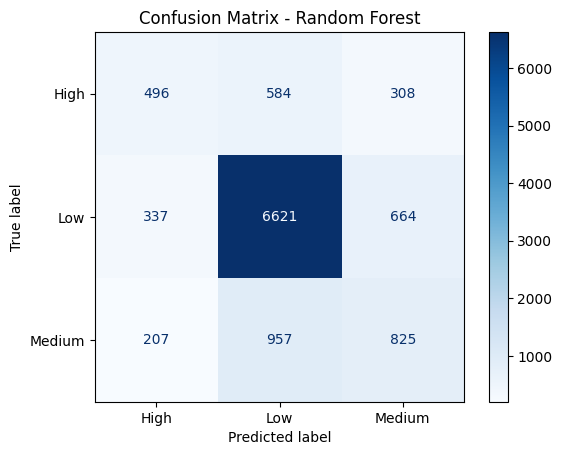

In [ ]:
evaluate_model(y_test, y_pred, labels=le.classes_, model_title = "Random Forest")

In [ ]:
scores = cross_val_score(rf_model, X_train_bal, y_train_bal, cv=5, scoring="f1_macro", n_jobs=-1)
print("Cross-validation scores:", scores)
print("Mean cross-validation score:", scores.mean())
print("Standard deviation of cross-validation scores:", scores.std())

KeyboardInterrupt: 

#### XGBoost + Optuna

In [ ]:
xgb = XGBClassifier(
    objective='multi:softmax',
    num_class=3,
    eval_metric='mlogloss',
    use_label_encoder=False,
    random_state=42
)

xgb.fit(X_train_bal, y_train_bal)

In [ ]:
y_pred_xgb = xgb.predict(X_test)

In [ ]:
evaluate_model(y_test, y_pred_xgb, labels=le.classes_, model_title="XGBoost")

In [ ]:
scores = cross_val_score(xgb, X_train_bal, y_train_bal, cv=5, scoring = "f1_macro")
print("Cross-validation scores:", scores)
print("Mean cross-validation score:", scores.mean())
print("Standard deviation of cross-validation scores:", scores.std())

In [ ]:
plt.figure(figsize=(12, 6))
plot_importance(xgb, max_num_features=20, importance_type='gain', show_values=False)
plt.title("Feature importance (XGBoost - gain)")
plt.show()

In [ ]:
feature_names = X_test.columns
importance_df = pd.DataFrame({
    'feature': feature_names,
    'importance': xgb.feature_importances_
})

importance_df = importance_df.sort_values(by='importance', ascending=False).head(50)

def categorize_feature(name):
    if name.startswith("embed_"):
        return "tweet_embedding"
    elif name.startswith("user_embed_"):
        return "user_embedding"
    else:
        return name


importance_df["category"] = importance_df["feature"].apply(categorize_feature)

agg_importance = importance_df.groupby("category")["importance"].sum().sort_values(ascending=False)
agg_importance.plot(kind="bar", title="Total Importance by Category")
plt.show()

In [ ]:
def objective(trial):
        params = {
            'n_estimators': trial.suggest_int('n_estimators', 100, 400),
            'max_depth': trial.suggest_int('max_depth', 3, 15),
            'learning_rate': trial.suggest_float('learning_rate', 0.01, 0.3, log=True),
            'subsample': trial.suggest_float('subsample', 0.5, 1.0),
            'colsample_bytree': trial.suggest_float('colsample_bytree', 0.5, 1.0),
            'gamma': trial.suggest_float('gamma', 0, 5),
            'reg_alpha': trial.suggest_float('reg_alpha', 0.0, 5.0),
            'reg_lambda': trial.suggest_float('reg_lambda', 0.0, 5.0),
            'random_state': 42,
            'objective': 'multi:softmax',
            'num_class': len(np.unique(y_train_bal)),
            'use_label_encoder': False,
            'eval_metric': 'mlogloss'
        }

        model = XGBClassifier(**params)
        model.fit(X_train_bal, y_train_bal, verbose=False)
        preds = model.predict(X_test)
        f1 = f1_score(y_test, preds, average='macro')
        return f1

In [ ]:
pruner = optuna.pruners.MedianPruner()
study = optuna.create_study(direction="maximize", pruner=pruner)
study.optimize(objective, n_trials=5, timeout=900, show_progress_bar=True)

In [ ]:
print(f'Best trial: {study.best_trial.value}')
print(f'Best params: {study.best_params}')
print(f'Best F1-score: {study.best_value}')

In [ ]:
best_xgb = XGBClassifier(**study.best_params)
best_xgb.fit(X_train_bal, y_train_bal)

save_path = "/content/drive/MyDrive/Web Mining - Project/model/"
joblib.dump(best_xgb, save_path + "best_xgb.joblib")

In [ ]:
evaluate_model(y_test, best_xgb.predict(X_test), labels=le.classes_, model_title="XGBoost")

In [ ]:
scores = cross_val_score(best_xgb, X_train_bal, y_train_bal, cv=5, scoring = "f1_macro")
print("Cross-validation scores:", scores)

In [ ]:
print("Mean cross-validation score:", scores.mean())
print("Standard deviation of cross-validation scores:", scores.std())

#### LinearSVC

In [ ]:
svc = LinearSVC(
    C=1.0,
    max_iter=1000,
    #class_weight='balanced',
    random_state=42
)

svc.fit(X_train_bal, y_train_bal)

LinearSVC(random_state=42)

In [ ]:
y_pred_svc = svc.predict(X_test)

Accuracy: 0.5675970542776616
Recall: 0.3687272373568553
F1-score: 0.3624560987860295
Kappa: 0.06446895004973174
----------------------------------------------------------------------------
Classification Repport:
              precision    recall  f1-score   support

        High       0.18      0.08      0.11      1388
         Low       0.72      0.73      0.72      7622
      Medium       0.23      0.30      0.26      1989

    accuracy                           0.57     10999
   macro avg       0.37      0.37      0.36     10999
weighted avg       0.56      0.57      0.56     10999

----------------------------------------------------------------------------


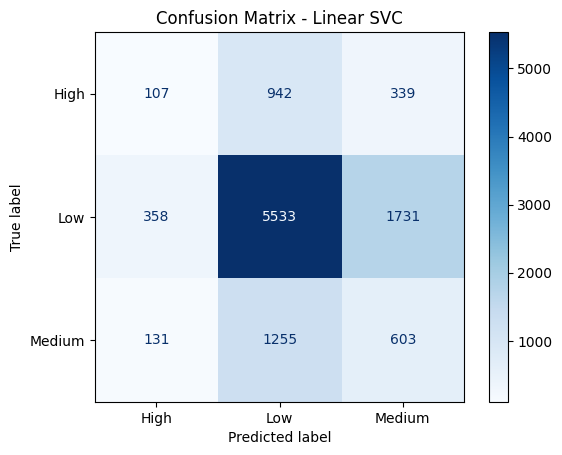

In [ ]:
evaluate_model(y_test, y_pred_svc, labels=le.classes_, model_title="Linear SVC")

In [ ]:
scores = cross_val_score(svc, X_train_bal, y_train_bal, cv=5, scoring = "f1_macro")
print("Cross-validation scores:", scores)
print("Mean cross-validation score:", scores.mean())
print("Standard deviation of cross-validation scores:", scores.std())

#### MLPClassifier

In [ ]:
mlp = MLPClassifier(
    hidden_layer_sizes=(128, 64),  # 2 layers : 128 → 64
    activation='relu',
    solver='adam',
    max_iter=300,
    random_state=42,
    early_stopping=True,
    verbose=False
)

mlp.fit(X_train_bal, y_train_bal)

MLPClassifier(early_stopping=True, hidden_layer_sizes=(128, 64), max_iter=300,
              random_state=42)

In [ ]:
y_pred_mlp = mlp.predict(X_test)

In [ ]:
evaluate_model(y_test, y_pred_mlp, labels=le.classes_, model_title="MLP Classifier")

In [ ]:
scores = cross_val_score(mlp, X_train_bal, y_train_bal, cv=5, scoring = "f1_macro")
print("Cross-validation scores:", scores)
print("Mean cross-validation score:", scores.mean())
print("Standard deviation of cross-validation scores:", scores.std())